# SSW2023 Workshop 2 NIRSpec Handout

## Author: Taylor Bell (Bay Area Environmental Research Institutite)

Run the [SWW2023_JWST_MIRI_NIRSpec_Setup](https://colab.research.google.com/drive/1fccr9FVwEsPhCzUhC4ah2FA9g0Q_AEMS?usp=sharing) notebook to download the data. The setup notebook needs to just be run **once** for both Hands-on I and II sessions.

## Google Colab Usage

*Please read (don't just hit run) the information given above each code cell as there are separate install cells for Colab*
&#128992;
*and running Python on your computer*
&#128309;.

**Confirm login account**
* Please make sure to be logged in with the Google account you want to use for the exercises before running the code cells below. You can check by clicking the circular account icon in the top right corner of the colab notebook.

**Working directory**
* Note: The data will be installed in a directory called "SSW2023" in your Google drive. This directory will be created if it does not exist.

**Running cells**
* Run cells individually by clicking on the triangle on each cell

**To Restart runtime**
*   Click on Runtime menu item
*   Select Restart runtime
*   Select Run code cells individually from the top

**To Recreate runtime**
*   Click on Runtime menu item
*   Select Disconnect and Delete runtime
*   Select Run code cells individually from the top

**To Exit:**
*   Close the browser window

# &#128992; Google Colab Setup and Installing Eureka!

**Important:** You will need to re-run these first two cells each time your runtime gets deleted.

&#128992; **This first cell will install Eureka!**

In [ ]:
# Change numpy version (required for theano)
!pip install numpy==1.21.6
# Install Eureka! (for now a dev branch, but in the future a stable branch)
!pip install eureka@git+https://github.com/kevin218/Eureka.git@dev/tjb

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 27.4 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.22.4
    Uninstalling numpy-1.22.4:
      Successfully uninstalled numpy-1.22.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.12.0 requires numpy<1.24,>=1.22, but you have numpy 1.21.6 which is incompatible.


  Cloning https://github.com/kevin218/Eureka.git (to revision dev/tjb) to /tmp/pip-install-4ymwjsdv/eureka_95449a9a8bd044d9abbcbdc5492c1a07
  Running command git clone --filter=blob:none --quiet https://github.com/kevin218/Eureka.git /tmp/pip-install-4ymwjsdv/eureka_95449a9a8bd044d9abbcbdc5492c1a07
  Running command git checkout -b dev/tjb --track origin/dev/tjb
  Switched to a new branch 'dev/tjb'
  Branch 'dev/tjb' set up to track remote branch 'dev/tjb' from 'origin'.
  Resolved https://github.com/kevin218/Eureka.git to commit 99c375da1da749c15679805a1c391740e431669d
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Cloning https://github.com/kevin218/Astraeus (to revision main) to /tmp/pip-install-4ymwjsdv/astraeus_d0d77ef84a9b4567b42a6157dc65a634
  Running command git clone --filter=blob:none --quiet https://github.com/kevin218/Astraeus /tmp/pip-install-4ymwjsdv/astraeus_d0d77ef84a9b4567b42a6157

This next cell will connect your notebook to your Google Drive files.

&#128992; **Run this cell if you are running Google Colab.**

In [ ]:
# You will be prompted to Permit this notebook to access your Google Drive files - Click on "Connect to Google Drive"
# You will then be prompted to Choose an account - click on your preferred Google account
# You will then confirm that Google Drive for desktop wants to access your Google Account - scroll to click "Allow"
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


&#128992; **After the cell above outputs "Mounted at /content/drive", click the "Runtime"->"Restart runtime" in the top menu bar, and then you can proceed with the cells below**

# &#128309; Installing Eureka! on your computer

If you are running this on your computer instead of Google Colab, you should instead follow the installation instructions at https://eurekadocs.readthedocs.io/en/latest/installation.html.

---
# Setting up the notebook

The first step is to setup the notebook and environment.

We'll first import Eureka! along with some other useful packages.

*(You can safely ignore the warnings about jwst, starry, pymc3 - we didn't install them above to try and make the installation process a bit faster)*

In [ ]:
import eureka
import os
import numpy as np

Could not import starry and/or pymc3 related packages. Functionality may be limited.


Next, we will re-use the eventlabel from Workshop #1. The eventlabel is a short, meaningful label (without spaces) that describes the data you're currently working on. For simplicity, simply set `eventlabel = 'nirspec'`. This same event label should be used throughout all stages.

In [ ]:
eventlabel = 'nirspec'

# An introduction to Bayesian statistics

*The text discussing Bayesian statistics throughout this notebook is adapted from:*
<blockquote>Bell, Taylor James. "Characterizing Ultra-Hot Jupiters through Theoretical Modelling and Precise Observations." Doctoral Thesis, McGill University, 2021.</blockquote>

<br/>

**This introduction to Bayesian statistics can be skipped if you are already familiar, and you can resume at "Optimizing a fit to the white lightcurve".**

<br/>

This workshop will make heavy use of Bayesian statistics which is a fundamental aspect of most aspects of modern science and data analysis. According to Bayes' theorem, the probability, $P$, of a hypothesis, $H$, given a set of observations, $\mathbf{X}$, and a collection of prior knowledge, $I$, is given by
\begin{equation*}
    P(H|\mathbf{X},I) = \frac{P(\mathbf{X}|H,I) P(H|I)}{P(\mathbf{X}|I)},
\end{equation*}
where $|$ reads as "given" (that all terms to the right are assumed true), and the comma reads as "and". The power of Bayes' theorem is that it allows us to compute the *posterior probability*, $P(H|\mathbf{X},I)$, using the much more easily calculable *likelihood function*, $P(\mathbf{X}|H,I)$, which is the probability that we would have observed the data $\mathbf{X}$ if the hypothesis and prior knowledge were correct. The $P(H|I)$ term is the *prior probability* and summarizes how our prior knowledge affects our hypothesis before having measured the data $\mathbf{X}$. Finally, the $P(\mathbf{X}|I)$ term is the *evidence* or *marginal likelihood* and is often omitted when fitting a model to data as it is only a normalization term and does not depend on the hypothesis.

When fitting a set of observations, a hypothesis typically consists of a function describing the model which depends on a collection of parameters, $\theta$, and hyperparameters, $\alpha$. Bayes' theorem can then be re-written as
\begin{equation*}
    P(\theta|\mathbf{X},\alpha) \propto P(\mathbf{X}|\theta,\alpha) P(\theta|\alpha).
\end{equation*}
Fitting the observations usually starts by freezing the set of hyperparameters and then evaluating the posterior probability by comparing different model predictions to the observed data. Fitting the observations then requires determining the values of $\theta$ that maximize the posterior probability (called the Maximum A Posteriori estimate or MAP estimate), while determining the uncertainty on the model parameters involves determining the range of values of $\theta$ that provide an adequately good fit to the observations (called the confidence interval).

In principle, one could simultaneously estimate the optimal value of $\theta$ and its confidence interval from the posterior probability density function (PDF) by calculating the posterior probability for all values of $\theta$; this is called a grid search. While this technique may be feasible for discrete parameters or low dimensional problems, performing a grid search when the vector $\theta$ contains tens or thousands of continuous variables becomes immensely challenging and computationally inefficient. Instead, various algorithms can be used to compute the MAP estimate and the confidence interval, some of which we will make use of in this workshop.

# Optimizing a fit to the white lightcurve

In this section, we are going to find the MAP (often called "best-fit") model parameter values by fitting a "white" lightcurve using an optimization algorithm. As was discussed in Workshop #1, by "white" we mean wavelength-integrated, where the MIRI wavelengths used here span 5–10.5 micrometers.

Estimating the best-fit values of the parameters $\theta$ is often done using a gradient descent algorithm. This technique starts by picking either a random or partially informed initial estimate for the value of $\theta$ and then computing or estimating the gradient in the posterior PDF depending on whether or not the model is differentiable. In practice, most optimization methods are formulated as minimization routines (hence the name gradient *descent*), so it is more common to seek the minimum of the *negative* posterior probability. The algorithm will then take a small step in the direction in which the posterior probability most rapidly increases and then re-evaluate the gradient in the posterior PDF. This procedure is then repeated (typically with a gradually decreasing step size) until the algorithm locates a local maximum in the posterior PDF. The distinction of a local maximum rather than a global maximum is important as gradient descent routines do not explore the parameter space as thoroughly as a grid search, so it is possible for the algorithm to settle on a local maximum which compares poorly to the global maximum. This is typically overcome by running several gradient descent optimizations initialized at random locations in parameter space in the hopes that one of the optimizations will make its way to the global maximum (or at least alert you to the presence of many local maxima). As we'll see later, the posterior for the fits we'll be making in this workshop is pretty smooth, so we'll just run a single optimization run.

## Setting the Stage 5 "Eureka! Control File" (ECF)

**This determines what will happen during Stage 5**

To begin, please first copy below the contents of the ECF template for MIRI/LRS from the `S5_template.ecf` file in the ECF demos folder on [GitHub](https://github.com/kevin218/Eureka/tree/main/demos/JWST).

The most important parameters and their recommended settings are described below, but more context can be found on the [Eureka! documentation website](https://eurekadocs.readthedocs.io/en/latest/ecf.html#stage-5).

1. Set the `ncpu` parameter to `1`. Model optimization algorithms can typically only make use of one cpu thread, and since we're running this on Google Colab which only offers one thread there's no benefit to setting it higher.
2. Make sure `rescale_err` is set to `False` - we'll be using a different method of error inflation to ensure that we end up with a reduced chi-squared of unity.
3. Set `verbose` to `True` so you get lots of useful information printed out.
4. Set `fit_method` to `[lsq]` to use the [scipy.optimize.minimize](https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.minimize.html) algorithm to **minimize** the **negative** log-probability in order to find the best-fit values for each fitted parameter.
5. Set `run_myfuncs` to `[batman_tr, polynomial, ypos, ywidth]`. Each element in this list is a function that will be fitted to the data — we'll setup more aspects of each function below when we setup the "Eureka! Parameter File". The `batman_tr` function uses the [batman](http://lkreidberg.github.io/batman/docs/html/index.html) package to model a transit function which describes how the astrophysical flux decreases when the planet passes in front of its star blocks part of the star's light. The `polynomial` function allows us to fit for systematic trends in time (like a linear slope) as well as fitting for the overall baseline flux level; you must always use a `polynomial` model when fitting observations to at least model the baseline flux level. The `ypos` and `ywidth` functions model changes in the flux caused by changes in the position and PSF width of the spectrum on the detector in the spatial direction; we computed these during Stage 3 in Workshop #1. JWST is quite stable over time, so these functions just assume that the flux is linearly correlated with the spatial position and PSF width. Not all observations require that you use the `ypos` and `ywidth` functions, but as we saw in Workshop #1 there is a strong mirror-tilt event in these observations, as we are going to use `ypos` and `ywidth` to try to remove that sudden jump in flux.
6. Set `fit_par` to `./S5_fit_par_template.epf`. This tells Eureka! where you have specified the priors and initial guesses for the parameters the control the functions listed above.
7. Set `manual_clip` to `[[None,20]]`. This will remove the first 20 integrations which show a curved shape likely due to an effect called charge trapping.
8. Leave all parameters under the "Limb darkening controls" heading at their default values of `None` since we didn't produce model limb-darkening spectra in Workshop #1.
9. Set `lsq_method` to `Powell`. This controls which scipy.optimize.minimize optimization method will be used. In general, the Powell algorithm works very well.
10. Set `lsq_tol` to `1e-6`. This sets the error tolerance for the scipy.optimize.minimize optimization method, where a smaller value will result in a more precise estimate of the "best-fit" value, so long as the optimizer manages to converge. A value of `1e-6` will suffice for most datasets.
11. Leave `lsq_maxiter` at its default setting of `None`. This parameter can be used to let the optimzation routine run for longer if you get a message saying that the fit failed because the maximum number of function evaluations has been exceeded. This can sometimes happen when `lsq_tol` is set too small, when you're fitting a complex model with many parameters, or when there are strong degeneracies between two or more parameters.
12. For now, you can safely ignore all of the settings related to the dynesty, emcee, and nuts sampling algorithms - we'll come back to these later.
13. Set `isplots_S5` to `5` so that you see lots of useful plots that can help you debug your fits.
14. Set `nbin_plot` to `None` since we're not fitting that many integrations and we don't really need to temporally bin the data when plotting to be able to see our astrophysical signal.
15. Set `hide_plots` to `False` so that all your figures appear within the notebook (you can set this to `True` if you're running the code from the terminal and want to avoid an excessive number of pop-ups appearing).
16. &#128992; Set `topdir` to the folder containing your input "white" Stage 4 folder. This should start with /content/drive/MyDrive/ (this is where your Google Drive files get mounted) and then specify the folder structure you setup. For example, if your Stage4_white files on Google Drive are in SSW2023→WASP39b_NIRSpec→Stage4_white, then set `topdir` to `/content/drive/MyDrive/SSW2023/WASP39b_NIRSpec`. This `topdir` setting will use our provided Stage 4 output files, but if you want to try using your own results from Workshop #1, you can instead set `topdir` to `/content/drive/MyDrive/SSW2023/NIRSpec`. &#128309; If you are using the Jupyter notebook, set `topdir` to the full parent directory of the input "white" Stage4 directory, either choosing to use our provided Stage4_white files or your own from Workshop #1.
17. Since we're fitting white lightcurves, we'll adjust the `inputdir` to `Stage4_white` and the `outputdir` to `Stage5_white`. Depending on the `topdir` setting you used, this will either use our provided Stage 4 output files or your own results from Workshop #1. If you're using your own results from Workshop #1, setting `intputdir` to `Stage4_white` will use your most recent Stage4_white result, but you can also choose a specific run using the syntax `Stage4_white/S4_YYYY-MM-DD_nirspec_runN` where YYYY is the year (e.g., `2023`), MM is the month (e.g., `07`), DD is the day (e.g., `24`), and N is the particular run number that you want to use (e.g., `1`).

In [ ]:
s5_ecf_contents = f"""
# Eureka! Control File for Stage 5: Lightcurve Fitting

# Stage 5 Documentation: https://eurekadocs.readthedocs.io/en/latest/ecf.html#stage-5

ncpu            1 # The number of CPU threads to use when running emcee or dynesty in parallel

allapers        False                   # Run S5 on all of the apertures considered in S4? Otherwise will use newest output in the inputdir
rescale_err     False                   # Rescale uncertainties to have reduced chi-squared of unity
fit_par         ./S5_fit_par_template.epf   # What fitting epf do you want to use?
verbose         True                    # If True, more details will be printed about steps
fit_method      [lsq]               #options are: lsq, emcee, dynesty (can list multiple types separated by commas)
run_myfuncs     [batman_tr, polynomial, ypos, ywidth]  # options are: batman_tr, batman_ecl, sinusoid_pc, expramp, polynomial, step, xpos, ypos, xwidth, ywidth, and GP (can list multiple types separated by commas)

# Manual clipping in time
manual_clip     [[None,20]]    # A list of lists specifying the start and end integration numbers for manual removal.

# Limb darkening controls
# IMPORTANT: limb-darkening coefficients are not automatically fixed then, change to 'fixed' in .epf file whether they should be fixed or fitted!
use_generate_ld  None  # use the generated limb-darkening coefficients from Stage 4? Options: exotic-ld, None. For exotic-ld, the limb-darkening laws available are linear, quadratic, 3-parameter and 4-parameter non-linear.
ld_file          None  # Fully qualified path to the location of a limb darkening file that you want to use
ld_file_white    None  # Fully qualified path to the location of a limb darkening file that you want to use for the white-light light curve (required if ld_file is not None and any EPF parameters are set to white_free or white_fixed).

# General fitter
old_fitparams   None # filename relative to topdir that points to a fitparams csv to resume where you left off (set to None to start from scratch)

#lsq
lsq_method      'Powell' # The scipy.optimize.minimize optimization method to use
lsq_tol         1e-6    # The tolerance for the scipy.optimize.minimize optimization method
lsq_maxiter     None    # Maximum number of iterations to perform. Depending on the method each iteration may use several function evaluations. Set to None to use the default value

#mcmc
old_chain       None    # Output folder relative to topdir that contains an old emcee chain to resume where you left off (set to None to start from scratch)
lsq_first       True    # Initialize with an initial lsq call (can help shorten burn-in, but turn off if lsq fails). Only used if old_chain is None
run_nsteps      1000
run_nwalkers    200
run_nburn       500     # How many of run_nsteps should be discarded as burn-in steps

#dynesty
run_nlive       1024    # Must be > ndim * (ndim + 1) // 2
run_bound       'multi'
run_sample      'auto'
run_tol         0.1

#GP inputs
kernel_inputs   ['time'] #options: time
kernel_class    ['Matern32'] #options: ExpSquared, Matern32, Exp, RationalQuadratic for george, Matern32 for celerite (sums of kernels possible for george separated by commas)
GP_package      'celerite' #options: george, celerite

# Plotting controls
interp          False   # Should astrophysical model be interpolated (useful for uneven sampling like that from HST)

# Diagnostics
isplots_S5      5       # Generate few (1), some (3), or many (5) figures (Options: 1 - 5)
nbin_plot       None     # The number of bins that should be used for figures 5104 and 5304. Defaults to 100.
testing_S5      False   # Boolean, set True to only use the first spectral channel
testing_model   False   # Boolean, set True to only inject a model source of systematics
hide_plots      False   # If True, plots will automatically be closed rather than popping up

# Project directory
topdir          /content/drive/MyDrive/SSW2023/WASP39b_NIRSpec

# Directories relative to topdir
inputdir        Stage4_white   # The folder containing the outputs from Eureka!'s S4 pipeline (will be overwritten if calling S4 and S5 sequentially)
outputdir       Stage5_white

# Fill this text block with the contents of the S5 ECF template from https://github.com/kevin218/Eureka/tree/main/demos/JWST
# and then adjust the values as described above

"""

with open(f'S5_{eventlabel}.ecf', 'w') as f:
    f.write(s5_ecf_contents)

## Setting the Stage 5 "Eureka! Parameter File" (EPF)

**This determines the priors and starting guesses for your fitted models**

Here is where we dive further into specifying details about the models that we want to fit to our data. We'll discuss the ones relevant to this fit below, but more details can be found on the [Eureka documentation webpage](https://eurekadocs.readthedocs.io/en/latest/ecf.html#stage-5-fit-parameters).

Each row has 6 columns:
> `Name Value Free? PriorPar1 PriorPar2 PriorType`

`Name` specifies the name of a fitted variable. These have to be from a very specific list of options so that Eureka! knows what the variable is supposed to mean. For example `rp` is the planet-to-star radius ratio (so `rp` squared would be equal to the transit depth) and `fp` is the eclipse depth.

`Value` specifies the starting guess for the variable. This column is used for all optimization or sampling algorithms except dynesty which does not take a starting guess. In general, starting guesses do not need to be exceptionally good, and as long as they're in the vague ballpark then the fitting or sampling algorithm should work fine. For fixed parameters (see the description of `Free?` below), this column sets the value of the parameter.

`Free?` specifies whether the parameter should be freely fitted for each wavelength (`'free'`), should be set to a fixed value and not changed throughout the fit (`'fixed'`), is an auxilliary variable that also should not be fit (`'independent'`). Other more advanced options also exist, but we won't cover them here. For fixed and independent variables, the remaining three columns are not used.

**The rightmost column**, `PriorType`, determines what type of prior function you will use to constrain your fitted parameters. The three options are Normal (`N`; also known as a Gaussian prior), Uniform (`U`), and Log-Uniform (`LU`). Some sampling algorithms work faster or more efficiently with Normal priors, but sometimes you must use Uniform priors to avoid unphysical parameter settings. Normal priors are typically best for orbital parameters for which there are published best-fit values and uncertainties.

The meanings of the `PriorPar1` and `PriorPar2` columns are dependent on the setting of the `PriorType` column (which is the last column). If `PriorType` is N, then `PriorPar1` is the mean of the Gaussian prior and `PriorPar2` is the standard deviation. If `PriorType` is U, then `PriorPar1` is the lower limit of the parameter and `PriorPar2` is the upper limit of the parameter. If `PriorType` is LU, then `PriorPar1` is the lower limit of the log of the parameter, and `PriorPar2` is the upper limit of the log of the parameter.


<br/>

---

<br/>


For your fit, you will need the following variables: `rp`, `per`, `t0`, `time_offset`, `inc`, `a`, `ecc`, `w`, `c0`, `c1`, `ypos`, `ywidth`, `scatter_mult`.

To begin, please first copy below the contents of the ECF template for MIRI/LRS from the `S5_fit_par_template.epf` file in the ECF demos folder on [GitHub](https://github.com/kevin218/Eureka/tree/main/demos/JWST).

- For `per` (planetary orbital period), `t0` (time of conjunction; also called linear ephemeris or transit midpoint), `inc` (planetary orbital inclination), `a` (planetary orbital semi-major axis), `ecc` (planetary orbital eccentricity), and `w` (planetary orbital argument of periastron) we will make use of previously published research. Navigate to the [NASA Exoplanet Archive's page](https://exoplanetarchive.ipac.caltech.edu/overview/WASP-39b) about our target WASP-39b and click on "WASP-39 b Planetary Parameters". We will use the values published by Maciejewski et al. 2016 as priors. Where there are two values for the uncertainty, just use the larger of the two. Also, while the published `t0` is in units of BJD_TDB, JWST timestamps are in units of B**M**JD_TDB, where the M means "modified" and BMJD_TDB=BJD_TDB-2400000.5; this removes the first two digits that won't change in our lifetime and changes the time so that a new BMJD_TDB day starts at midnight (while new BJD_TDB days inconventiently start at noon). So we will need to subtract that 2400000.5 from the published `t0` value when entering it into your EPF. And since the planet is consistent with a zero-eccentricity orbit, let's set `ecc` to be fixed to 0 and arbitrarily set `w` to be fixed to 90 (the value of `w` doesn't matter if the eccentricity is zero). In summary, you should have:
> `per 4.0552765 'free' 4.0552765 0.0000035 N`<br/>
> `t0 55342.46982 'free' 55342.46982 0.00051 N`<br/>
> `inc 87.75 'free' 87.75 0.27 N`<br/>
> `a 11.37 'free' 11.37 0.24 N`<br/>
> `ecc 0 'fixed'`<br/>
> `w 90 'fixed'`<br/>

- For rp (planet-to-star radius ratio), we'll also use the published value from Maciejewski et al. 2016 as a Normal prior. However, this is the main value that we are hoping to measure with our observations and we want to be able to see how the radius changes with wavelength. As a result, we will greatly increase the uncertainty on the radius to `0.01` in order to minimally bias our observations. In summary, set:
> `rp 0.1457 'free' 0.1457 0.01 N`

- Leave time_offset at it's default settings of:
> `time_offset 0 'independent'`.

- No star is completely uniform in brightness across its surface, and one of the main sources of non-uniformity is called limb-darkening where the ceter of the star appears brighter than the edges of the star. A convenient and efficient way of modelling this limb-darkening was published in [Kipping (2013)](https://ui.adsabs.harvard.edu/abs/2013MNRAS.435.2152K/abstract). With this limb-darkening law, there are two parameters to be fitted and each can theoretically take on any value between 0 and 1. To let Eureka! fit these limb-darkening parameters, set:
> `limb_dark 'kipping2013' 'independent'`<br/>
> `u1 0.5 'free' 0 1 U`<br/>
> `u2 0.5 'free' 0 1 U`

- Our systematics models are controlled by
  - `c0` (the baseline flux level) and `c1` (which fits for a linear slope as a function of time). These two parameters control the `polynomial` function we specified in the ECF settings above. To make things easier, Eureka! normalizes the lightcurves by the median flux, so the value of `c0` should be approximately 1, but since our observations have such a large transit it will be a bit above 1. The value of `c1` is in the units of change in `c0` per day, and is typically very small (the absolute value of `c1` is typically at or below 0.001. Reasonable, minimally informative priors could then be:
  > `c0 1 'free' 1 0.01 N`<br/>
  > `c1 0 'free' 0 0.01 N`
  - `ypos` which assumes the observed flux varies linearly with the position on the detector. This can happen because of flux lost outside of our extraction aperture or between gaps between pixels. Values for `ypos` are typically well below 1, so a reasonable, minimally informative prior could then be:
  > `ypos 0 'free' 0 0.1 N`
  - and `ywidth` which assumes the observed flux varies linearly with the PSF width of the spectrum. This can happen because of flux lost outside of our extraction aperture or between gaps between pixels. Values for `ywidth` can sometimes reach as high as ~1, so a reasonable, minimally informative prior could then be:
  > `ywidth 0 'free' 0 10 N`

- We also need to setup `scatter_mult`. Eureka! estimates the expected level of noise from photon-limited statistics, but data is imperfect and we rarely ever reach the photon-limited noise level (because of background noise, read noise, and other systematic noise sources). If you fit data with underestimated error bars, then the resulting confidence intervals can be artificially small, so we want to inflate the error bars on our observations as is justified by the data. The simplest way to do this with Eureka! is the `scatter_mult` parameter which multiplies the error bars by a constant factor. A fitted value of 2 for `scatter_mult` would mean that the observed scatter in the data is twice as high as it would be in the photon-limited noise regime. NIRSpec data is typically pretty well behaved though, and a reasonable, minimally informative prior could be:
> `scatter_mult 1.4 'free' 1.4 2 N`

**Finally, delete or comment-out (with `#`) all other parameters not mentioned above.**

In [ ]:
s5_epf_contents = f"""
# Stage 5 Fit Parameters Documentation: https://eurekadocs.readthedocs.io/en/latest/ecf.html#stage-5-fit-parameters


# Name       Value         Free?          PriorPar1    PriorPar2    PriorType
# "Free?" can be free, fixed, white_free, white_fixed, shared, or independent
# PriorType can be U (Uniform), LU (Log Uniform), or N (Normal).
# If U/LU, PriorPar1 and PriorPar2 represent upper and lower limits of the parameter/log(the parameter).
# If N, PriorPar1 is the mean and PriorPar2 is the standard deviation of a Gaussian prior.
#-------------------------------------------------------------------------------------------------------
#
# ------------------
# ** Transit/eclipse parameters **
# ------------------
rp 0.1457 'free' 0.1457 0.01 N
time_offset 0 'independent'
#fp           0.008          'free'         0           0.5          U
# ----------------------
# ** Phase curve parameters **
# ----------------------
#AmpCos1      0.4           'free'         0            1            U
#AmpSin1      0.01          'free'         -1           1            U
#AmpCos2      0.01          'free'         -1           1            U
#AmpSin2      0.01          'free'         -1           1            U
# ------------------
# ** Orbital parameters **
# ------------------
per 4.0552765 'free' 4.0552765 0.0000035 N
t0 55342.46982 'free' 55342.46982 0.00051 N
inc 87.75 'free' 87.75 0.27 N
a 11.37 'free' 11.37 0.24 N
ecc 0 'fixed'
w 90 'fixed'
# -------------------------
# ** Limb darkening parameters **
# Choose limb_dark from ['uniform', 'linear', 'quadratic', 'kipping2013', 'squareroot', 'logarithmic', 'exponential','3-parameter', '4-parameter']
# When using generated limb-darkening coefficients from exotic-ld choose from ['linear', 'quadratic', '3-parameter', '4-parameter']
# -------------------------
limb_dark 'kipping2013' 'independent'
u1 0.5 'free' 0 1 U
u2 0.5 'free' 0 1 U
# --------------------
# ** Systematic variables **
# Polynomial model variables (c0--c9 for 0th--3rd order polynomials in time); Fitting at least c0 is very strongly recommended!
# Exponential ramp model variables (r0--r2 for one exponential ramp, r3--r5 for a second exponential ramp)
# GP model parameters (A, WN, m1, m2) in log scale
# Step-function model variables (step# and steptime# for step-function model #; e.g. step0 and steptime0)
# Drift model variables (xpos, ypos, xwidth, ywidth)
# --------------------
c0 1 'free' 1 0.01 N
c1 0 'free' 0 0.01 N
ypos 0 'free' 0 0.1 N
ywidth 0 'free' 0 10 N
#A            -5             'free'         -20.         -5.          U
#WN           -15            'free'         -20.         -10.         U
#m1           -5             'free'         -10.         0.           U
# -----------
# ** White noise **
# Use scatter_mult to fit a multiplier to the expected noise level from Stage 3 (recommended)
# Use scatter_ppm to fit the noise level in ppm
# Use WN parameter in GP model parameters to account for white noise in the GP model
# -----------
scatter_mult 1.4 'free' 1.4 2 N
# Fill this text block with the contents of the S5 EPF template from https://github.com/kevin218/Eureka/tree/main/demos/JWST
# and then adjust the values as described above

"""

with open('S5_fit_par_template.epf', 'w') as f:
    f.write(s5_epf_contents)

## Running Eureka!'s Stage 5

The following cell will run Eureka!'s Stage 5 using the settings you defined above. Note that your ECF and EPF will be copied to your output folder, making it easy to remember how you produced those outputs hours, days, or years after you reduced the data.

The following fit should take &lt;1 minute to complete on Google Colab.

Finished loading parameters from /content/drive/MyDrive/SSW2023/WASP39b_NIRSpec/Stage4_white/S4_2023-06-02_nirspec_run1/ap5_bg7//S4_nirspec_ap5_bg7_LCData.h5

Starting Stage 5: Light Curve Fitting

Input directory: /content/drive/MyDrive/SSW2023/WASP39b_NIRSpec/Stage4_white/S4_2023-06-02_nirspec_run1/ap5_bg7/
Output directory: /content/drive/MyDrive/SSW2023/WASP39b_NIRSpec/Stage5_white/S5_2023-07-25_nirspec_run1/ap5_bg7/
Copying S5 control file
Copying S5 parameter control file
Manually removing data points from meta.manual_clip...

Starting Channel 1 of 1

Starting lsq fit.
Starting lnprob: -586193.4755009518


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_optimize.py:2417: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)


Current lnprob =  3178.111866497522
Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -3178.111866497522
       x: [ 1.469e-01  4.055e+00  5.534e+04  8.773e+01  1.137e+01
            2.813e-02  2.032e-01  1.007e+00 -5.244e-05  6.364e-03
           -3.524e-01  1.988e+00]
     nit: 19
   direc: [[-1.134e-04 -5.911e-09 ... -2.073e-03 -6.140e-02]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 3.319e-06 -3.691e-10 ... -3.258e-04  4.738e-04]]
    nfev: 3644

Ending lnprob: 3178.111866497522
Reduced Chi-squared: 1.024501687735315

LSQ RESULTS:
rp: 0.14685595178811844
per: 4.0552801374670455
t0: 55342.469859119374
inc: 87.72774578134315
a: 11.369288364363793
u1: 0.028134138993797405
u2: 0.20316204651574707
c0: 1.0066219209776583
c1: -5.244460719562026e-05
ypos: 0.00636424465790622
ywidth: -0.35239450202991407
scatter_mult: 1.987769302339

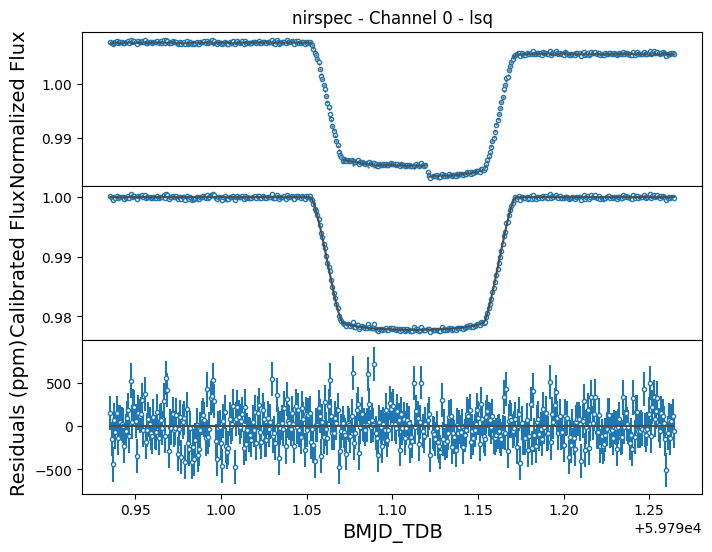

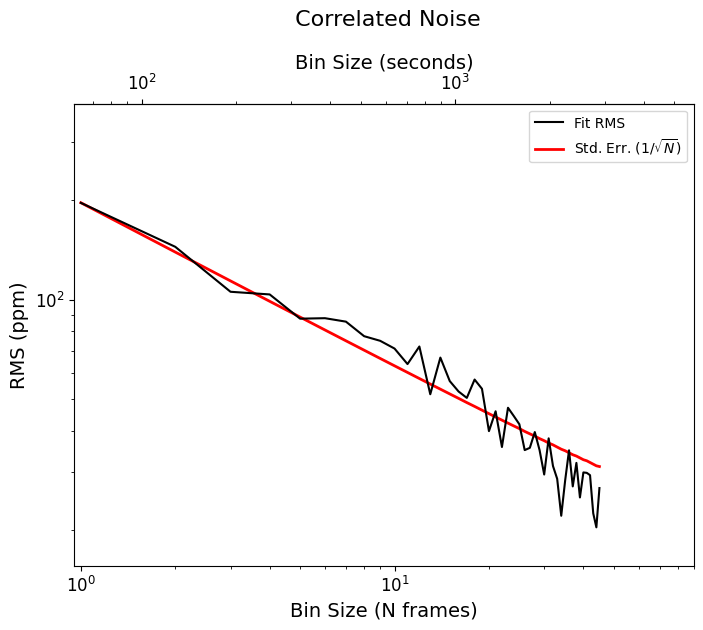

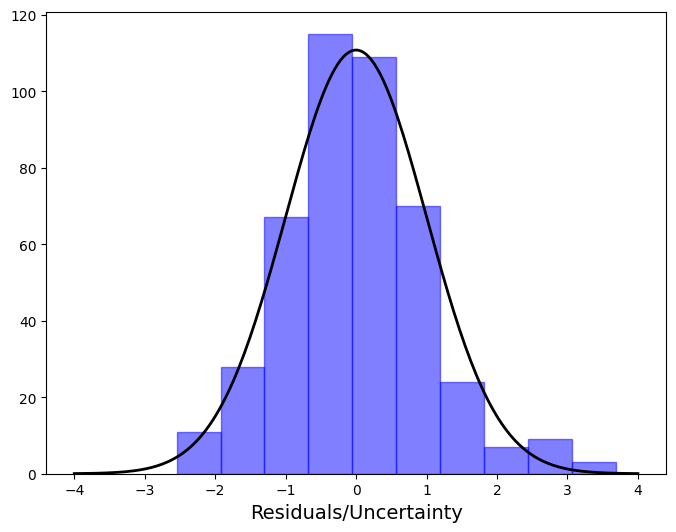

Completed lsq fit.
-------------------------


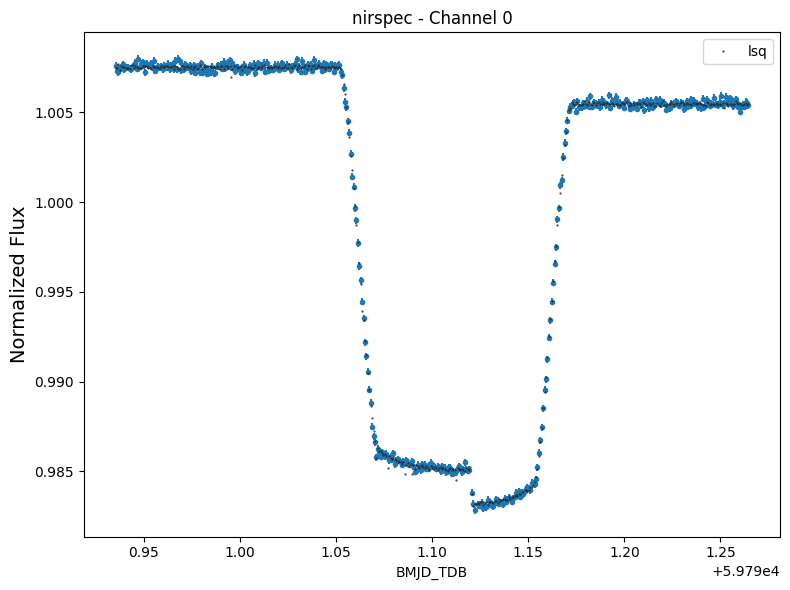

Saving results

Total time (min): 0.25


In [ ]:
s5_meta = eureka.S5_lightcurve_fitting.s5_fit.fitlc(eventlabel)

# Sampling white lightcurve posterior

Estimating the confidence interval of our parameters $\theta$ could be done by extrapolating the posterior PDF from the MAP value using the first and second order gradient and then determining the extent to which each component of $\theta$ can be changed while still providing an adequately good fit to the observations. However, this technique can give inaccurate estimates especially in the presence of correlations between different parameters. Instead, a sampling algorithm like the Markov Chain Monte-Carlo (MCMC) method is typically used to estimate parameter uncertainties. Monte-Carlo (MC) methods in general involve randomly sampling values of $\theta$, while MCMCs are a specific variant where samples are randomly drawn based on the knowledge of the posterior probability from the previously drawn value; the draws of MCMC are typically called steps taken by a walker, and a collection of many walker steps are called a chain.

One increasingly popular sampling algorithm is called [Nested Sampling](https://en.wikipedia.org/wiki/Nested_sampling_algorithm) which does not necessarily use a MCMC method. Nested sampling can be difficult to explain intuitively, but one of the nice advantages to nested sampling is that it can be used for model comparison. More relevant to our purposes here, the [dynesty](https://dynesty.readthedocs.io/en/stable/) dynamic nested sampling algorithm is able to quickly sample our posterior and has a convenient stopping condition which ensures the sampler has converged so that we get reliable uncertainties.

## Adjusting the Stage 5 "Eureka! Control File" (ECF)

Thankfully we can reuse the vast majority of our ECF settings above with only a few minor tweaks.

To begin, please first copy below the contents of the ECF that you filled out above. Then:

1. Change `fit_method` to be `[dynesty]` to instead use the dynesty sampler.
2. Add the following dynesty-related settings
  1. Set `run_nlive` to `121`. This sets the number of "live" points that dynesty will use (for more details see [here](https://dynesty.readthedocs.io/en/stable/faq.html#live-point-questions)). For reliable results, this must be greater than `ndim * (ndim + 1) // 2`, where `ndim` is the number of fitted parameters and `//` indicates integer division. In general, the larger this number the more robust your results will be and the longer they will take to run. A value of `121` is a fairly reasonable balance of speed and quality.
  2. Set `run_bound` to `'multi'`. This sets the type of bounds used by dynesty to "multiple ellipsoid decomposition". For more information, see [here](https://dynesty.readthedocs.io/en/stable/faq.html#bounding-questions). A value of `'multi'` should work for most problems.
  3. Set `run_sample` to `'auto'`. This lets dynesty choose the optimal sampling method based on the number of fitted parameters, and `auto` is a safe bet for most problems. For more information, see [here](https://dynesty.readthedocs.io/en/stable/faq.html#sampling-questions).
  4. Finally, set `run_tol` to `0.1`. This determines the stopping condition of the sampler. Smaller values will result in more precise posteriors at the cost of increased runtime, while larger values can result in poorly converged garbage. In general, a value of `0.1` should work for most problems.

In [ ]:
s5_ecf_contents = f"""
# Eureka! Control File for Stage 5: Lightcurve Fitting

# Stage 5 Documentation: https://eurekadocs.readthedocs.io/en/latest/ecf.html#stage-5

ncpu            1 # The number of CPU threads to use when running emcee or dynesty in parallel

allapers        False                   # Run S5 on all of the apertures considered in S4? Otherwise will use newest output in the inputdir
rescale_err     False                   # Rescale uncertainties to have reduced chi-squared of unity
fit_par         ./S5_fit_par_template.epf   # What fitting epf do you want to use?
verbose         True                    # If True, more details will be printed about steps
fit_method      [dynesty]               #options are: lsq, emcee, dynesty (can list multiple types separated by commas)
run_myfuncs     [batman_tr, polynomial, ypos, ywidth]  # options are: batman_tr, batman_ecl, sinusoid_pc, expramp, polynomial, step, xpos, ypos, xwidth, ywidth, and GP (can list multiple types separated by commas)

# Manual clipping in time
manual_clip     [[None,20]]    # A list of lists specifying the start and end integration numbers for manual removal.

# Limb darkening controls
# IMPORTANT: limb-darkening coefficients are not automatically fixed then, change to 'fixed' in .epf file whether they should be fixed or fitted!
use_generate_ld  None  # use the generated limb-darkening coefficients from Stage 4? Options: exotic-ld, None. For exotic-ld, the limb-darkening laws available are linear, quadratic, 3-parameter and 4-parameter non-linear.
ld_file          None  # Fully qualified path to the location of a limb darkening file that you want to use
ld_file_white    None  # Fully qualified path to the location of a limb darkening file that you want to use for the white-light light curve (required if ld_file is not None and any EPF parameters are set to white_free or white_fixed).

# General fitter
old_fitparams   None # filename relative to topdir that points to a fitparams csv to resume where you left off (set to None to start from scratch)

#lsq
lsq_method      'Powell' # The scipy.optimize.minimize optimization method to use
lsq_tol         1e-6    # The tolerance for the scipy.optimize.minimize optimization method
lsq_maxiter     None    # Maximum number of iterations to perform. Depending on the method each iteration may use several function evaluations. Set to None to use the default value

#mcmc
old_chain       None    # Output folder relative to topdir that contains an old emcee chain to resume where you left off (set to None to start from scratch)
lsq_first       True    # Initialize with an initial lsq call (can help shorten burn-in, but turn off if lsq fails). Only used if old_chain is None
run_nsteps      1000
run_nwalkers    200
run_nburn       500     # How many of run_nsteps should be discarded as burn-in steps

#dynesty
run_nlive 121
run_bound  'multi'
run_sample 'auto'
run_tol  0.1


#GP inputs
kernel_inputs   ['time'] #options: time
kernel_class    ['Matern32'] #options: ExpSquared, Matern32, Exp, RationalQuadratic for george, Matern32 for celerite (sums of kernels possible for george separated by commas)
GP_package      'celerite' #options: george, celerite

# Plotting controls
interp          False   # Should astrophysical model be interpolated (useful for uneven sampling like that from HST)

# Diagnostics
isplots_S5      5       # Generate few (1), some (3), or many (5) figures (Options: 1 - 5)
nbin_plot       None     # The number of bins that should be used for figures 5104 and 5304. Defaults to 100.
testing_S5      False   # Boolean, set True to only use the first spectral channel
testing_model   False   # Boolean, set True to only inject a model source of systematics
hide_plots      False   # If True, plots will automatically be closed rather than popping up

# Project directory
topdir          /content/drive/MyDrive/SSW2023/WASP39b_NIRSpec

# Directories relative to topdir
inputdir        Stage4_white   # The folder containing the outputs from Eureka!'s S4 pipeline (will be overwritten if calling S4 and S5 sequentially)
outputdir       Stage5_white

# Fill this text block with the contents of your S5 ECF from above,
# and then adjust the values as described above

"""

with open(f'S5_{eventlabel}.ecf', 'w') as f:
    f.write(s5_ecf_contents)

## Running Eureka!'s Stage 5

Because we want to use the exact same model and priors as our previous optimization run, there is no need to update our EPF and the code will just re-use the one we made above.

The following cell will run Eureka!'s Stage 5 using the settings you defined above. Note that your ECF and EPF will be copied to your output folder, making it easy to remember how you produced those outputs hours, days, or years after you reduced the data.

The following fit should take ~7 minutes to complete on Google Colab. While waiting for the fits to complete, you could begin setting up the next section.

Finished loading parameters from /content/drive/MyDrive/SSW2023/WASP39b_NIRSpec/Stage4_white/S4_2023-06-02_nirspec_run1/ap5_bg7//S4_nirspec_ap5_bg7_LCData.h5

Starting Stage 5: Light Curve Fitting

Input directory: /content/drive/MyDrive/SSW2023/WASP39b_NIRSpec/Stage4_white/S4_2023-06-02_nirspec_run1/ap5_bg7/
Output directory: /content/drive/MyDrive/SSW2023/WASP39b_NIRSpec/Stage5_white/S5_2023-07-25_nirspec_run2/ap5_bg7/
Copying S5 control file
Copying S5 parameter control file
Manually removing data points from meta.manual_clip...

Starting Channel 1 of 1

Starting dynesty fit.
Starting lnprob: -586193.4755009518
Running dynesty...


5943it [09:30, 10.42it/s, +121 | bound: 294 | nc: 1 | ncall: 180865 | eff(%):  3.355 | loglstar:   -inf < 3151.472 <    inf | logz: 3104.819 +/-    nan | dlogz:  0.001 >  0.100]


Summary
nlive: 121
niter: 5943
ncall: 180744
eff(%):  3.355
logz: 3104.819 +/-  0.666

Number of posterior samples is 6064


Finished writing to /content/drive/MyDrive/SSW2023/WASP39b_NIRSpec/Stage5_white/S5_2023-07-25_nirspec_run2/ap5_bg7/S5_dynesty_samples_ch0.h5
Ending lnprob: 3177.954684358637
Reduced Chi-squared: 1.001260429604101

DYNESTY RESULTS:
rp: 0.14689056539250384 (+0.0002374851843391923, -0.00025937971404216276)
per: 4.055280268707323 (+4.2200980843176694e-07, -3.744294359009359e-07)
t0: 55342.46971318395 (+0.0004145472776144743, -0.0004508449783315882)
inc: 87.7238398573203 (+0.04504511575665049, -0.043944213800102716)
a: 11.366418587766384 (+0.0353334101683096, -0.036285651756893245)
u1: 0.027486326547243603 (+0.010924172091954891, -0.00898269067476961)
u2: 0.2097702902477065 (+0.1903346022141854, -0.12604779647128905)
c0: 1.0066251063271896 (+1.059637349865028e-05, -1.2390198486089687e-05)
c1: -3.611707646009655e-05 (+0.00019178949697517162, -0.00020772379718821587)
ypos: 0.007105231070609355 (+0.006813926046906364, -0.0073548634814899596)
ywidth: -0.3530711807530415 (+0.006758351624030268, 

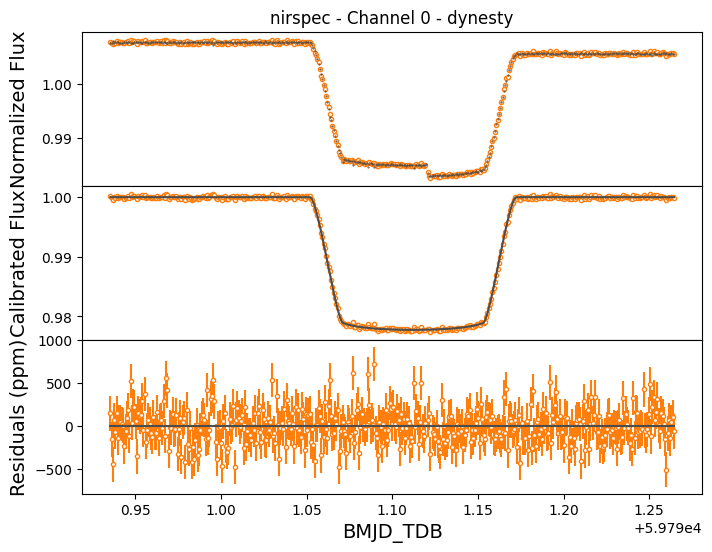

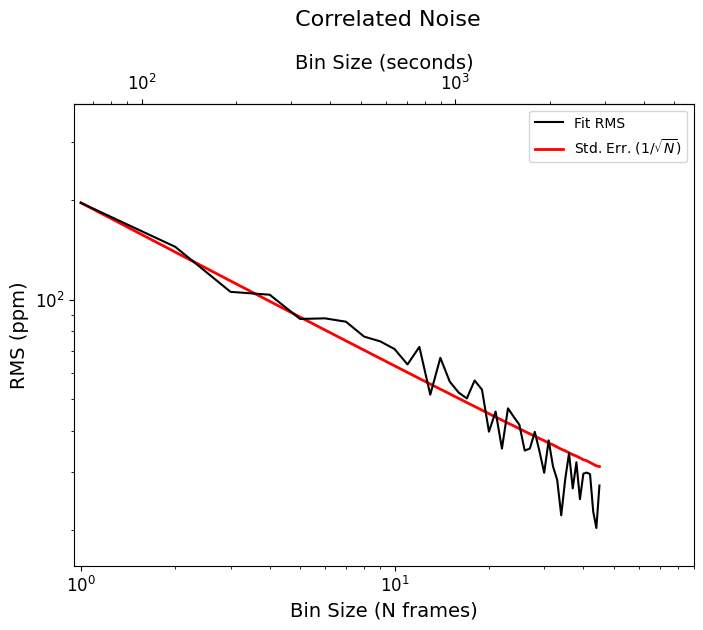

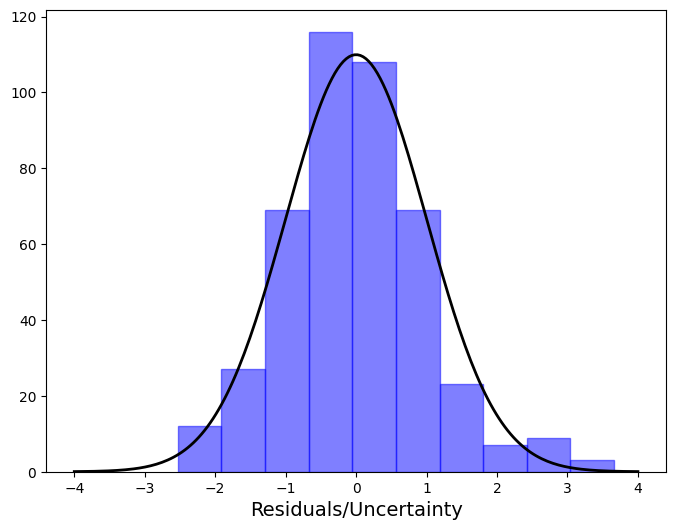

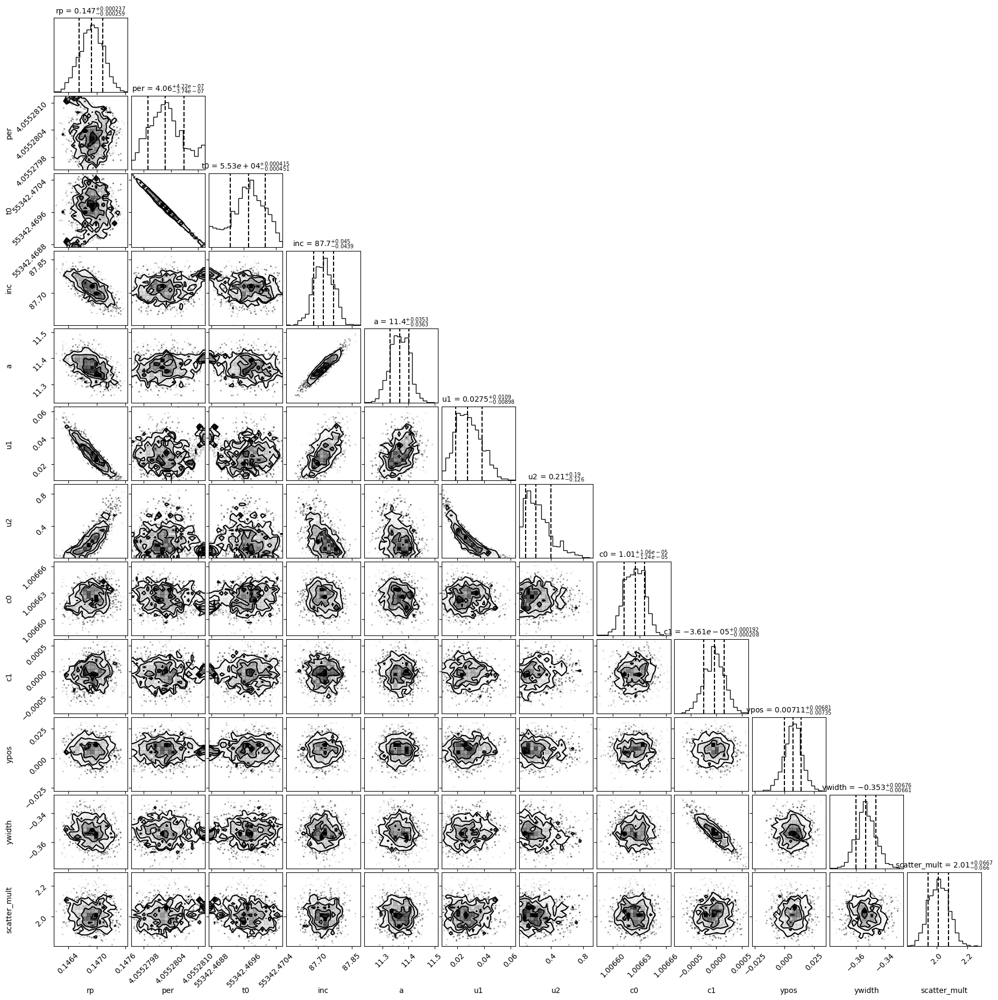

Completed dynesty fit.
-------------------------


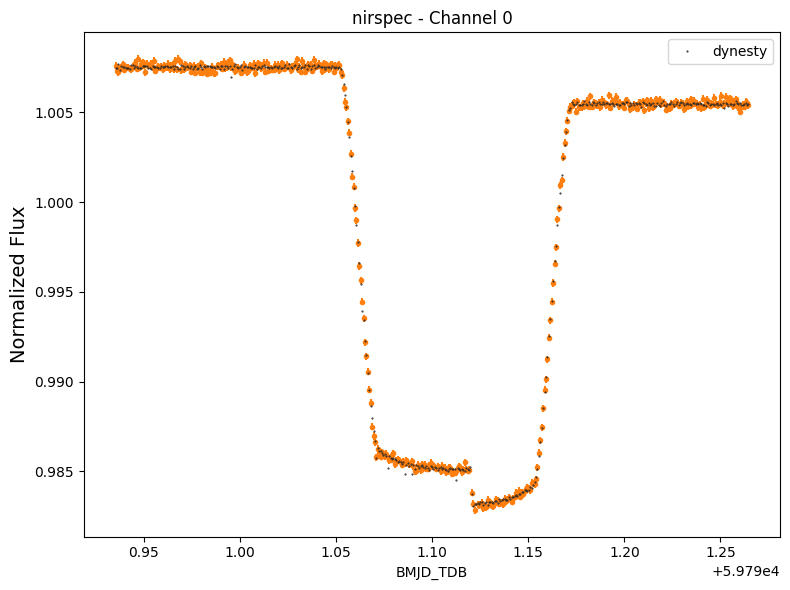

Saving results

Total time (min): 10.06


In [ ]:
s5_meta = eureka.S5_lightcurve_fitting.s5_fit.fitlc(eventlabel)

# Optimizing fits to spectroscopic lightcurves

Now that we know how to find best-fit values and uncertainties from a single "white" lightcurve, it is easy to extrapolate those skills to perform fits to "spectroscopic" lightcurves to evaluate how parameters like the eclipse depth vary as a function of wavelength (which can tell us about molecules in the planets' atmospheres).

## Adjusting the Stage 5 "Eureka! Control File" (ECF)

Thankfully we can reuse the vast majority of our ECF settings above with only a few minor tweaks.

To begin, please first copy below the contents of the ECF that you filled out above. Then:

1. Change `fit_method` back to `[lsq]` to go back to using the optimization algorithm. Running dynesty on each channel will take too long to be completed during this workshop but could be an interesting exercise on your own.
2. Since we're now fitting spectroscopic lightcurves, we'll adjust the `inputdir` to `Stage4` and the `outputdir` to `Stage5`. Depending on the `topdir` setting you used, this will either use our provided Stage 4 output files or your own results from Workshop #1. If you're using your own results from Workshop #1, setting `intputdir` to `Stage4` will use your most recent Stage4 result, but you can also choose a specific run using the syntax `Stage4/S4_YYYY-MM-DD_nirspec_runN` where YYYY is the year (e.g., `2023`), MM is the month (e.g., `07`), DD is the day (e.g., `24`), and N is the particular run number that you want to use (e.g., `1`).

And that's it for adjustments to the ECF!

In [ ]:
s5_ecf_contents = f"""
# Eureka! Control File for Stage 5: Lightcurve Fitting

# Stage 5 Documentation: https://eurekadocs.readthedocs.io/en/latest/ecf.html#stage-5

ncpu            1 # The number of CPU threads to use when running emcee or dynesty in parallel

allapers        False                   # Run S5 on all of the apertures considered in S4? Otherwise will use newest output in the inputdir
rescale_err     False                   # Rescale uncertainties to have reduced chi-squared of unity
fit_par         ./S5_fit_par_template.epf   # What fitting epf do you want to use?
verbose         True                    # If True, more details will be printed about steps
fit_method      [lsq]               #options are: lsq, emcee, dynesty (can list multiple types separated by commas)
run_myfuncs     [batman_tr, polynomial, ypos, ywidth]  # options are: batman_tr, batman_ecl, sinusoid_pc, expramp, polynomial, step, xpos, ypos, xwidth, ywidth, and GP (can list multiple types separated by commas)

# Manual clipping in time
manual_clip     [[None,20]]    # A list of lists specifying the start and end integration numbers for manual removal.

# Limb darkening controls
# IMPORTANT: limb-darkening coefficients are not automatically fixed then, change to 'fixed' in .epf file whether they should be fixed or fitted!
use_generate_ld  None  # use the generated limb-darkening coefficients from Stage 4? Options: exotic-ld, None. For exotic-ld, the limb-darkening laws available are linear, quadratic, 3-parameter and 4-parameter non-linear.
ld_file          None  # Fully qualified path to the location of a limb darkening file that you want to use
ld_file_white    None  # Fully qualified path to the location of a limb darkening file that you want to use for the white-light light curve (required if ld_file is not None and any EPF parameters are set to white_free or white_fixed).

# General fitter
old_fitparams   None # filename relative to topdir that points to a fitparams csv to resume where you left off (set to None to start from scratch)

#lsq
lsq_method      'Powell' # The scipy.optimize.minimize optimization method to use
lsq_tol         1e-6    # The tolerance for the scipy.optimize.minimize optimization method
lsq_maxiter     None    # Maximum number of iterations to perform. Depending on the method each iteration may use several function evaluations. Set to None to use the default value

#mcmc
old_chain       None    # Output folder relative to topdir that contains an old emcee chain to resume where you left off (set to None to start from scratch)
lsq_first       True    # Initialize with an initial lsq call (can help shorten burn-in, but turn off if lsq fails). Only used if old_chain is None
run_nsteps      1000
run_nwalkers    200
run_nburn       500     # How many of run_nsteps should be discarded as burn-in steps

#dynesty
run_nlive 121
run_bound  'multi'
run_sample 'auto'
run_tol  0.1


#GP inputs
kernel_inputs   ['time'] #options: time
kernel_class    ['Matern32'] #options: ExpSquared, Matern32, Exp, RationalQuadratic for george, Matern32 for celerite (sums of kernels possible for george separated by commas)
GP_package      'celerite' #options: george, celerite

# Plotting controls
interp          False   # Should astrophysical model be interpolated (useful for uneven sampling like that from HST)

# Diagnostics
isplots_S5      5       # Generate few (1), some (3), or many (5) figures (Options: 1 - 5)
nbin_plot       None     # The number of bins that should be used for figures 5104 and 5304. Defaults to 100.
testing_S5      False   # Boolean, set True to only use the first spectral channel
testing_model   False   # Boolean, set True to only inject a model source of systematics
hide_plots      False   # If True, plots will automatically be closed rather than popping up

# Project directory
topdir          /content/drive/MyDrive/SSW2023/WASP39b_NIRSpec

# Directories relative to topdir
inputdir        Stage4   # The folder containing the outputs from Eureka!'s S4 pipeline (will be overwritten if calling S4 and S5 sequentially)
outputdir       Stage5
# Fill this text block with the contents of your S5 ECF from above,
# and then adjust the values as described above

"""

with open(f'S5_{eventlabel}.ecf', 'w') as f:
    f.write(s5_ecf_contents)

## Adjusting the Stage 5 "Eureka! Parameter File" (EPF)

Thankfully we can reuse the vast majority of our EPF settings above with only a few minor tweaks.

To begin, please first copy below the contents of the EPF that you filled out above. Then you just need to set any parameters that cannot vary with wavelength to be `'fixed'`. The relevant parameters that cannot vary with wavelength are the orbital parameters which are `per`, `t0`, `a`, and `inc`.

One option is to fix these parameters to the best-fit values obtained from your optimization run near the top of the notebook. Alternatively, you could also fix them to the published values from Maciejewski et al. 2016. If you go with the former, copy-paste your best-fit values for `per`, `t0`, `a`, and `inc` into the `Value` column and set the `Free?` column to `'fixed'`. If you go with the latter option, you just need to set the `Free?` column to `'fixed'`.

In [ ]:
s5_epf_contents = f"""
# Stage 5 Fit Parameters Documentation: https://eurekadocs.readthedocs.io/en/latest/ecf.html#stage-5-fit-parameters


# Name       Value         Free?          PriorPar1    PriorPar2    PriorType
# "Free?" can be free, fixed, white_free, white_fixed, shared, or independent
# PriorType can be U (Uniform), LU (Log Uniform), or N (Normal).
# If U/LU, PriorPar1 and PriorPar2 represent upper and lower limits of the parameter/log(the parameter).
# If N, PriorPar1 is the mean and PriorPar2 is the standard deviation of a Gaussian prior.
#-------------------------------------------------------------------------------------------------------
#
# ------------------
# ** Transit/eclipse parameters **
# ------------------
rp 0.1457 'free' 0.1457 0.01 N
time_offset 0 'independent'
#fp           0.008          'free'         0           0.5          U
# ----------------------
# ** Phase curve parameters **
# ----------------------
#AmpCos1      0.4           'free'         0            1            U
#AmpSin1      0.01          'free'         -1           1            U
#AmpCos2      0.01          'free'         -1           1            U
#AmpSin2      0.01          'free'         -1           1            U
# ------------------
# ** Orbital parameters **
# ------------------
per 4.0552801374670455 'fixed' 4.0552765 0.0000035 N
t0 55342.469859119374 'fixed' 55342.46982 0.00051 N
inc 87.72774578134315 'fixed' 87.75 0.27 N
a 11.369288364363793 'fixed' 11.37 0.24 N
ecc 0 'fixed'
w 90 'fixed'
# -------------------------
# ** Limb darkening parameters **
# Choose limb_dark from ['uniform', 'linear', 'quadratic', 'kipping2013', 'squareroot', 'logarithmic', 'exponential','3-parameter', '4-parameter']
# When using generated limb-darkening coefficients from exotic-ld choose from ['linear', 'quadratic', '3-parameter', '4-parameter']
# -------------------------
limb_dark 'kipping2013' 'independent'
u1 0.5 'free' 0 1 U
u2 0.5 'free' 0 1 U
# --------------------
# ** Systematic variables **
# Polynomial model variables (c0--c9 for 0th--3rd order polynomials in time); Fitting at least c0 is very strongly recommended!
# Exponential ramp model variables (r0--r2 for one exponential ramp, r3--r5 for a second exponential ramp)
# GP model parameters (A, WN, m1, m2) in log scale
# Step-function model variables (step# and steptime# for step-function model #; e.g. step0 and steptime0)
# Drift model variables (xpos, ypos, xwidth, ywidth)
# --------------------
c0 1 'free' 1 0.01 N
c1 0 'free' 0 0.01 N
ypos 0 'free' 0 0.1 N
ywidth 0 'free' 0 10 N
#A            -5             'free'         -20.         -5.          U
#WN           -15            'free'         -20.         -10.         U
#m1           -5             'free'         -10.         0.           U
# -----------
# ** White noise **
# Use scatter_mult to fit a multiplier to the expected noise level from Stage 3 (recommended)
# Use scatter_ppm to fit the noise level in ppm
# Use WN parameter in GP model parameters to account for white noise in the GP model
# -----------
scatter_mult 1.4 'free' 1.4 2 N
# Fill this text block with the contents of your S5 EPF from above,
# and then adjust the values as described above

"""

with open('S5_fit_par_template.epf', 'w') as f:
    f.write(s5_epf_contents)

## Running Eureka!'s Stage 5

The following cell will run Eureka!'s Stage 5 using the settings you defined above. Note that your ECF and EPF will be copied to your output folder, making it easy to remember how you produced those outputs hours, days, or years after you reduced the data.

The code will loop through each wavelength channel, printing information about the fit and showing plots as it goes.

The following fits should take a total of ~7 minutes to complete on Google Colab. While waiting for the fits to complete, you could begin setting up the next section.

Finished loading parameters from /content/drive/MyDrive/SSW2023/WASP39b_NIRSpec/Stage4/S4_2023-06-02_nirspec_run1/ap5_bg7//S4_nirspec_ap5_bg7_LCData.h5

Starting Stage 5: Light Curve Fitting

Input directory: /content/drive/MyDrive/SSW2023/WASP39b_NIRSpec/Stage4/S4_2023-06-02_nirspec_run1/ap5_bg7/
Output directory: /content/drive/MyDrive/SSW2023/WASP39b_NIRSpec/Stage5/S5_2023-07-25_nirspec_run1/ap5_bg7/
Copying S5 control file
Copying S5 parameter control file
Manually removing data points from meta.manual_clip...

Starting Channel 1 of 50

Starting lsq fit.
Starting lnprob: -17939.093101787046


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_optimize.py:2417: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)



Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2594.449530611622
       x: [ 1.451e-01  1.895e-02  4.977e-01  1.007e+00  3.074e-04
           -3.915e-02 -3.281e-01  1.396e+00]
     nit: 11
   direc: [[ 0.000e+00  0.000e+00 ...  0.000e+00  1.000e+00]
           [ 2.491e-04  1.685e-03 ... -7.330e-02  3.553e-03]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [-2.862e-05  1.341e-03 ... -2.976e-04 -1.684e-03]]
    nfev: 1189

Ending lnprob: 2594.449530611622
Reduced Chi-squared: 1.0174936128915584

LSQ RESULTS:
rp: 0.14508014664150778
u1: 0.018948150390524682
u2: 0.49771166420233565
c0: 1.0065229531228836
c1: 0.0003073547893924334
ypos: -0.03914863714050626
ywidth: -0.32811345981073986
scatter_mult: 1.396091999799524; 724.8035604906014 ppm



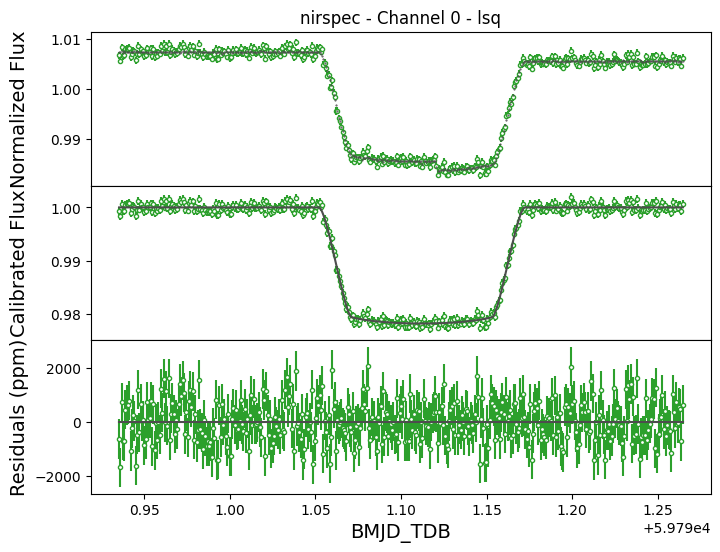

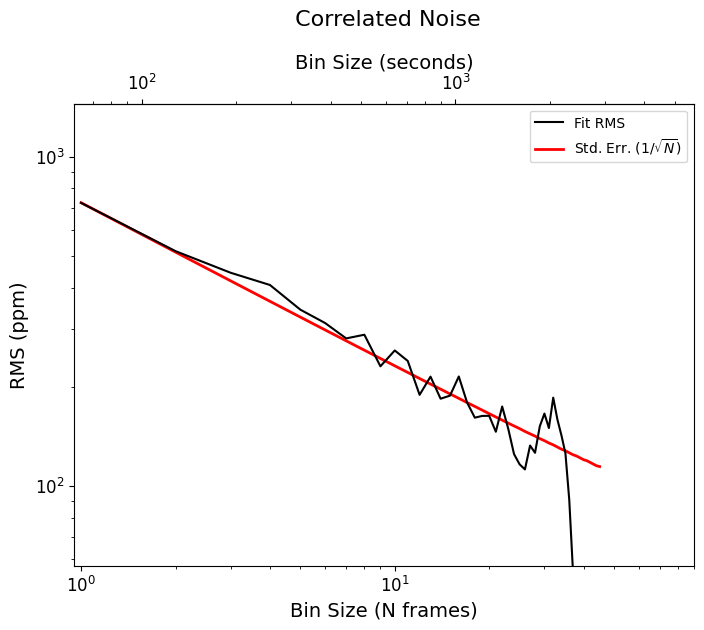

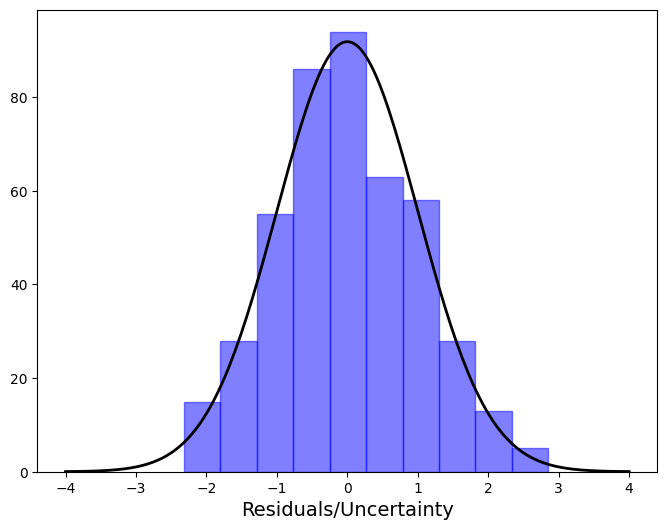

Completed lsq fit.
-------------------------


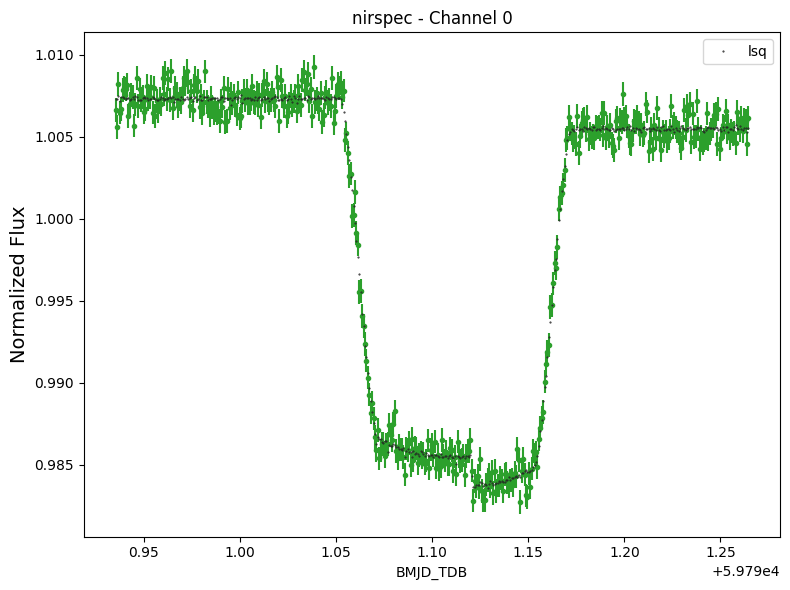

Saving results

Starting Channel 2 of 50

Starting lsq fit.
Starting lnprob: 2543.0960785003294

Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2553.3545424359227
       x: [ 1.449e-01  4.043e-02  3.327e-01  1.007e+00 -1.355e-03
           -3.646e-02 -2.846e-01  1.507e+00]
     nit: 5
   direc: [[-2.710e-04  1.174e-03 ...  1.617e-02 -3.996e-03]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 8.410e-06  2.343e-03 ...  4.914e-03  6.279e-05]]
    nfev: 492

Ending lnprob: 2553.3545424359227
Reduced Chi-squared: 1.0161157701984895

LSQ RESULTS:
rp: 0.14485511294139533
u1: 0.040431497849917904
u2: 0.3326656231026187
c0: 1.0065306734240422
c1: -0.0013546074192450127
ypos: -0.03646320520815994
ywidth: -0.28459566646219225
scatter_mult: 1.5069707112795303; 784.4419654036873 ppm



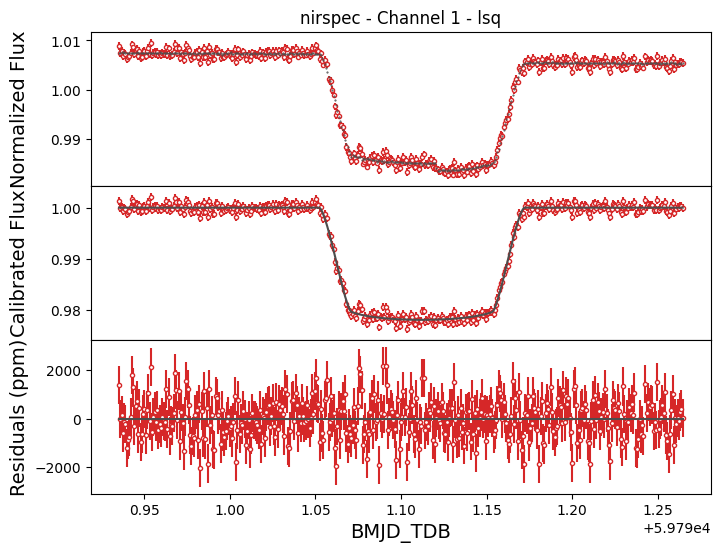

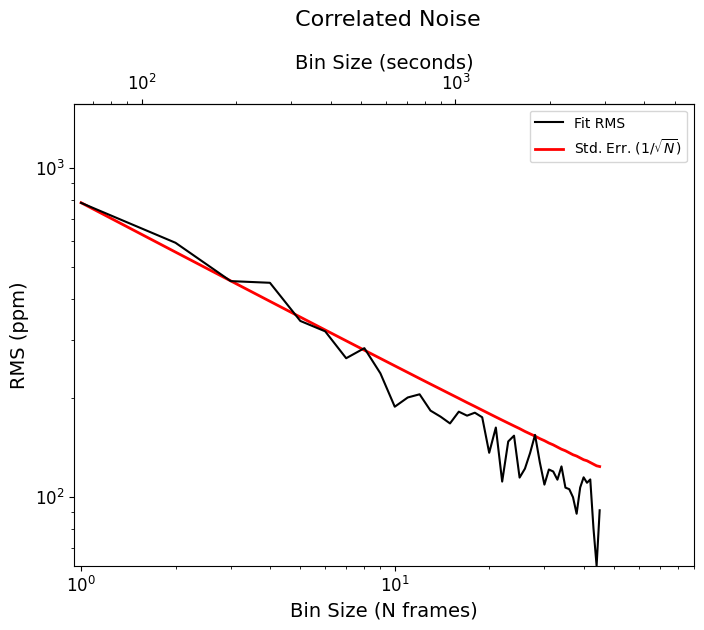

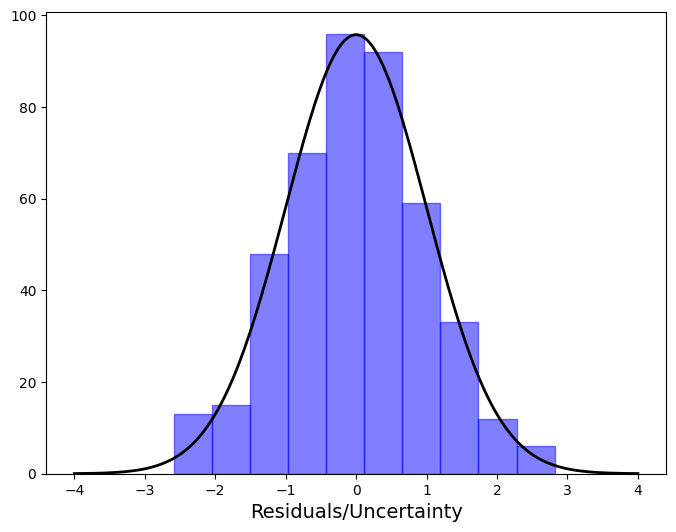

Completed lsq fit.
-------------------------


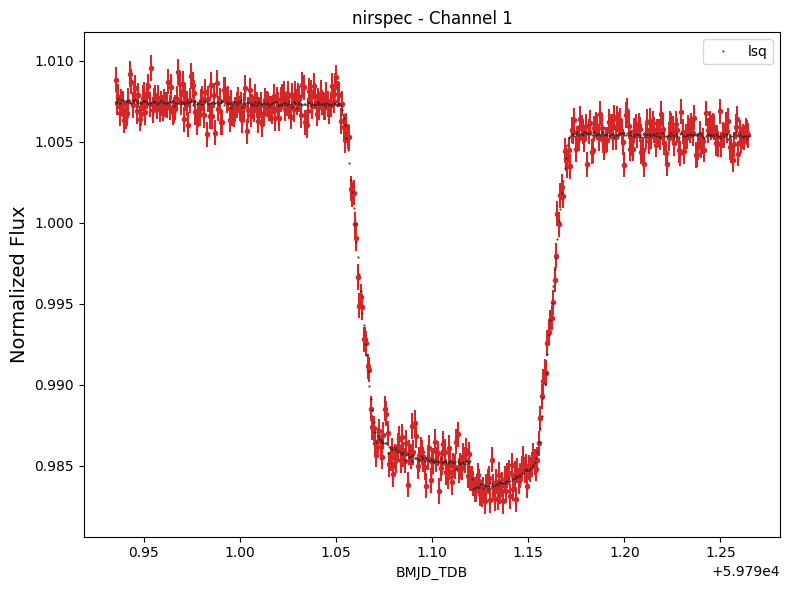

Saving results

Starting Channel 3 of 50

Starting lsq fit.
Starting lnprob: 2556.1474242881113
Current lnprob =  2570.173579736029
Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2570.173579736029
       x: [ 1.453e-01  3.589e-02  7.875e-12  1.007e+00  4.134e-04
            6.901e-03 -3.655e-01  1.462e+00]
     nit: 7
   direc: [[-3.350e-06  2.496e-03 ... -2.614e-02 -5.307e-03]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 1.640e-05 -1.689e-04 ... -2.097e-04  5.253e-05]]
    nfev: 1024

Ending lnprob: 2570.173579736029
Reduced Chi-squared: 1.0183590358280248

LSQ RESULTS:
rp: 0.1453144502397288
u1: 0.035885174716199376
u2: 7.875293411821917e-12
c0: 1.0065590836726812
c1: 0.00041343407876743036
ypos: 0.006900501134964784
ywidth: -0.3655031544343303
scatter_mult: 1.4623554906801195; 765.2708893618643 ppm



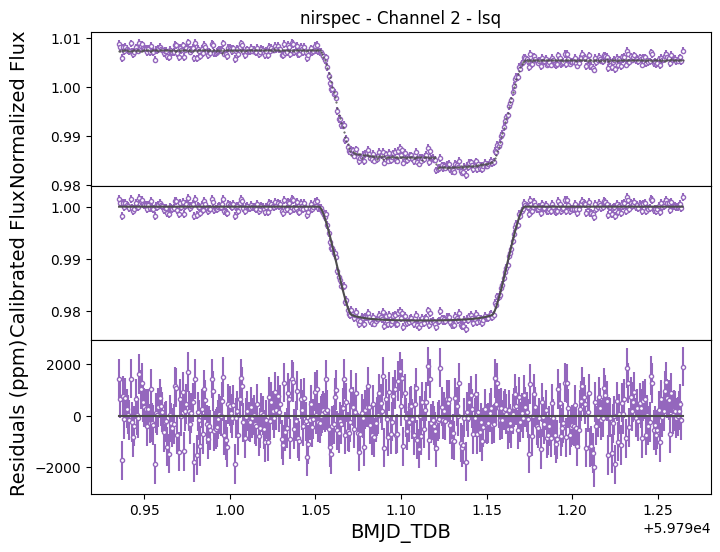

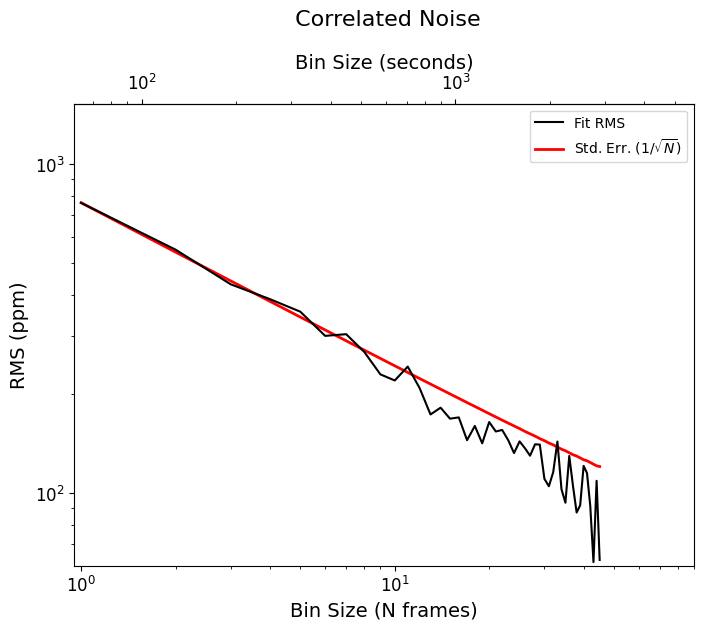

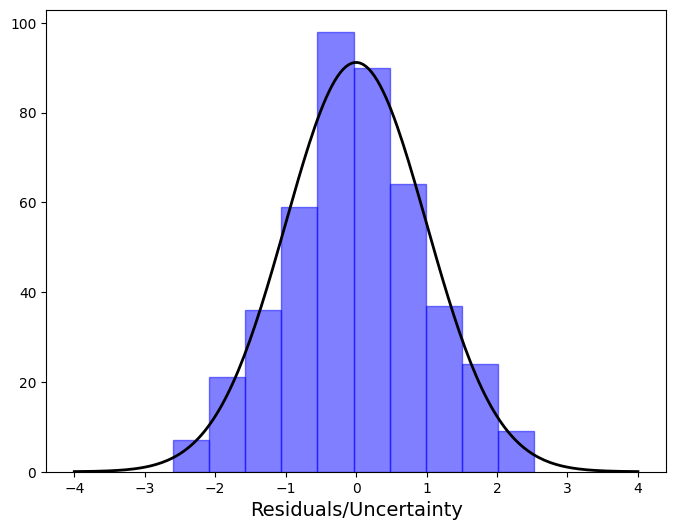

Completed lsq fit.
-------------------------


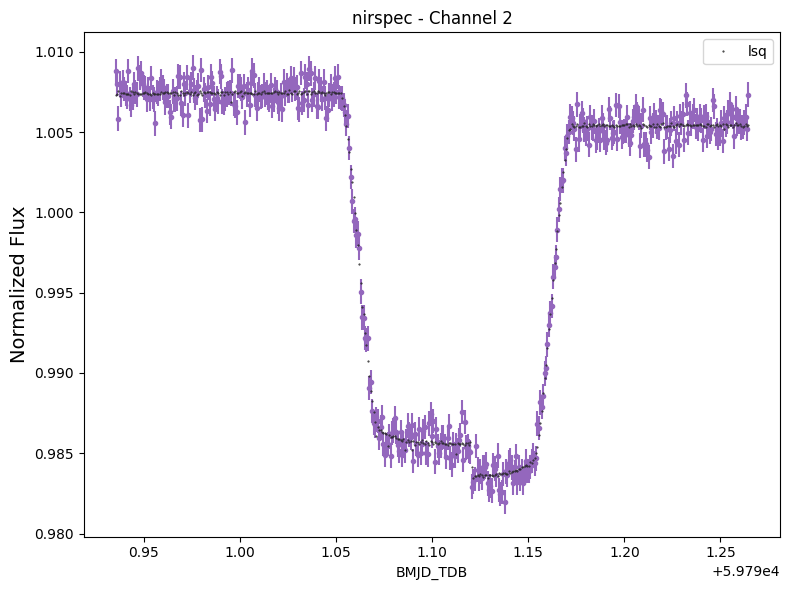

Saving results

Starting Channel 4 of 50

Starting lsq fit.
Starting lnprob: 2551.950835369457

Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2557.136158205083
       x: [ 1.458e-01  1.105e-02  8.553e-01  1.007e+00 -6.503e-04
            3.638e-02 -3.279e-01  1.451e+00]
     nit: 5
   direc: [[-6.628e-06 -7.995e-03 ...  1.043e-02 -5.024e-03]
           [ 0.000e+00  0.000e+00 ...  0.000e+00  1.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 6.864e-05 -9.901e-04 ...  2.867e-03 -3.341e-04]]
    nfev: 503

Ending lnprob: 2557.136158205083
Reduced Chi-squared: 1.0160472050980827

LSQ RESULTS:
rp: 0.1458184220775788
u1: 0.011049537243420208
u2: 0.8552528265769236
c0: 1.0065488910511269
c1: -0.0006502775629061179
ypos: 0.036375687799043106
ywidth: -0.3279431532881201
scatter_mult: 1.4508526303173908; 777.8131318799908 ppm



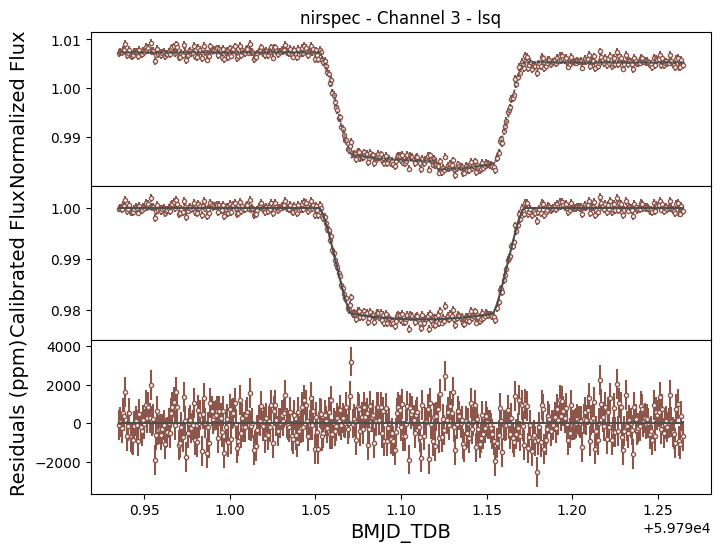

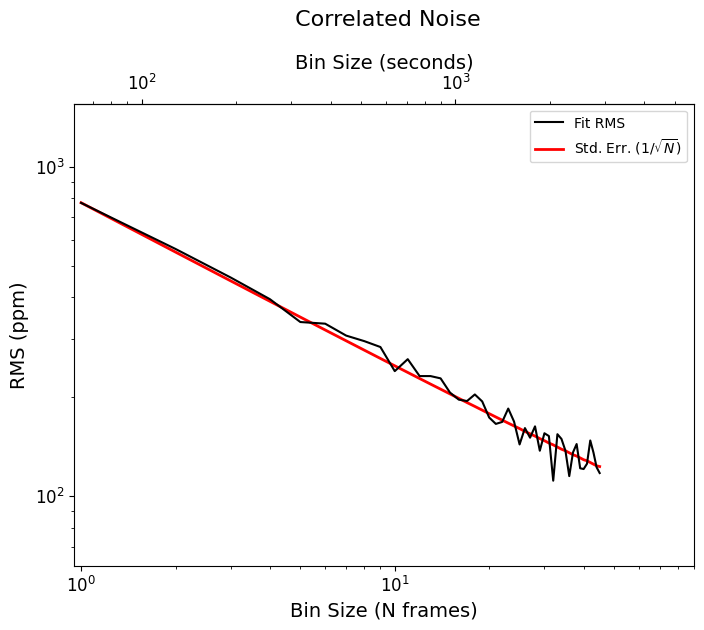

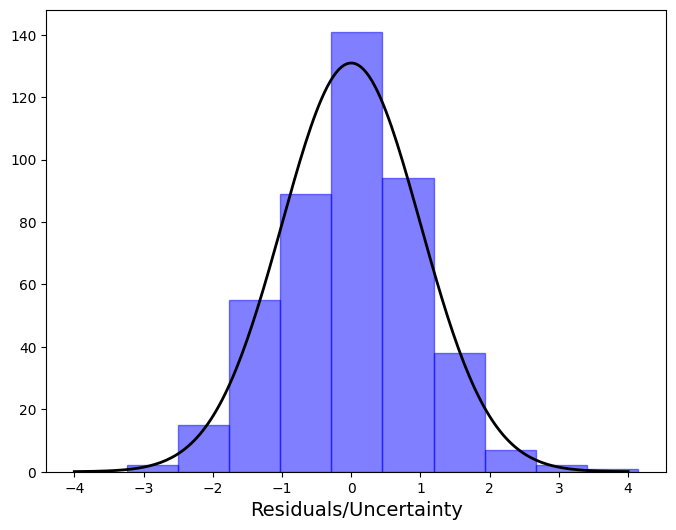

Completed lsq fit.
-------------------------


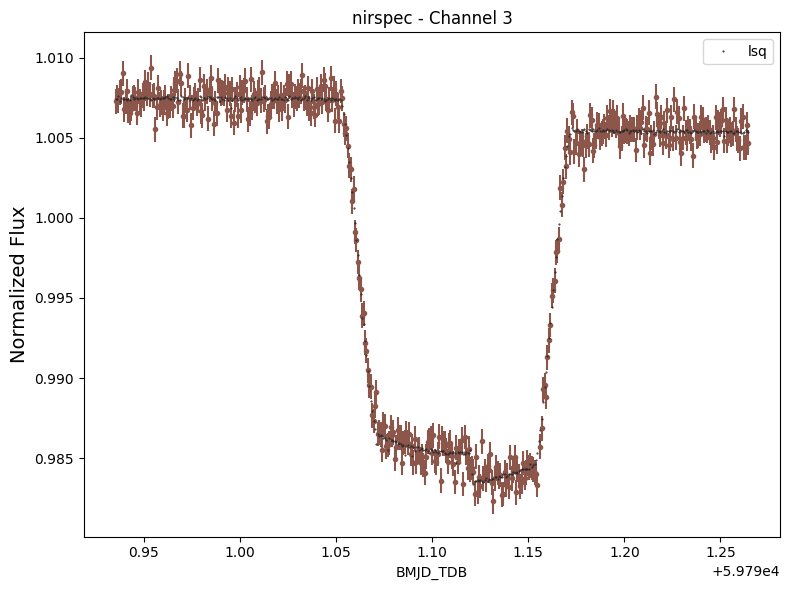

Saving results

Starting Channel 5 of 50

Starting lsq fit.
Starting lnprob: 2519.142216138778
Current lnprob =  2545.321233937063
Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2545.5290801674264
       x: [ 1.461e-01  2.307e-02  9.870e-02  1.007e+00  2.589e-04
            7.609e-03 -4.401e-01  1.476e+00]
     nit: 9
   direc: [[-1.488e-04  1.412e-03 ... -7.754e-03 -1.092e-03]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 1.739e-04 -3.032e-03 ... -1.337e-02 -1.164e-03]]
    nfev: 1028

Ending lnprob: 2545.5290801674264
Reduced Chi-squared: 1.0183839693851335

LSQ RESULTS:
rp: 0.14611184497865537
u1: 0.02306935101245673
u2: 0.09869968359265988
c0: 1.006621506983973
c1: 0.00025889565226286225
ypos: 0.00760894105109922
ywidth: -0.44010936538896184
scatter_mult: 1.4760871373968996; 808.7635304877782 ppm



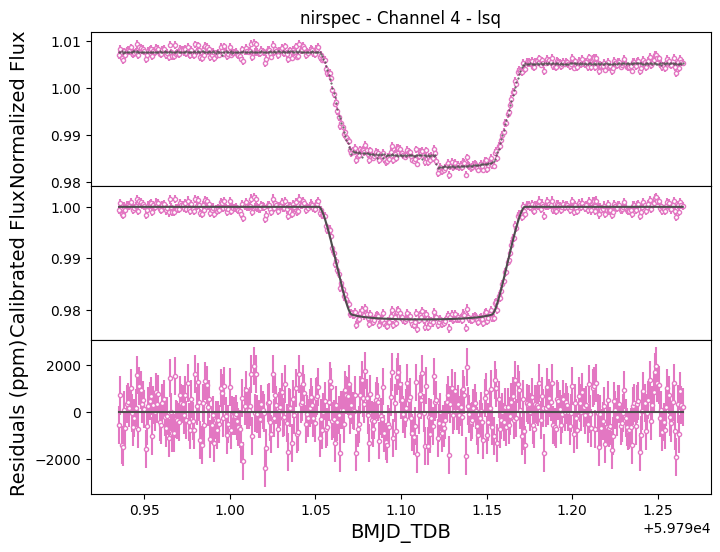

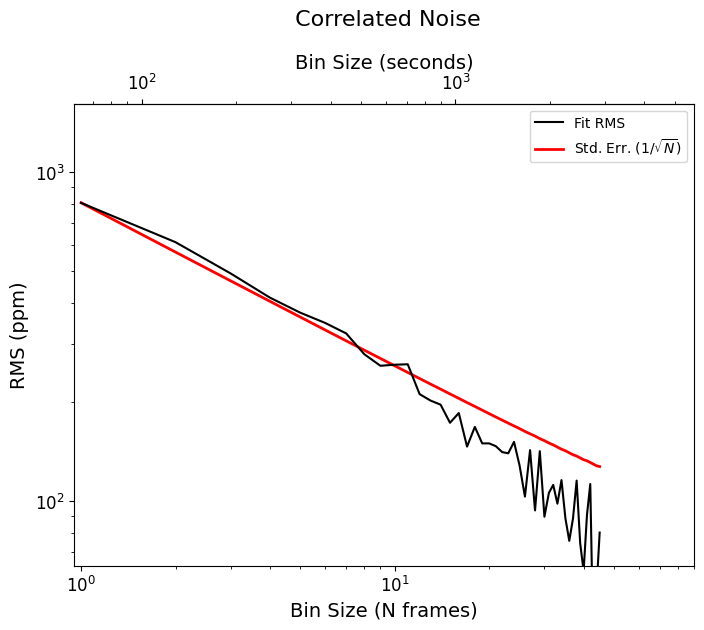

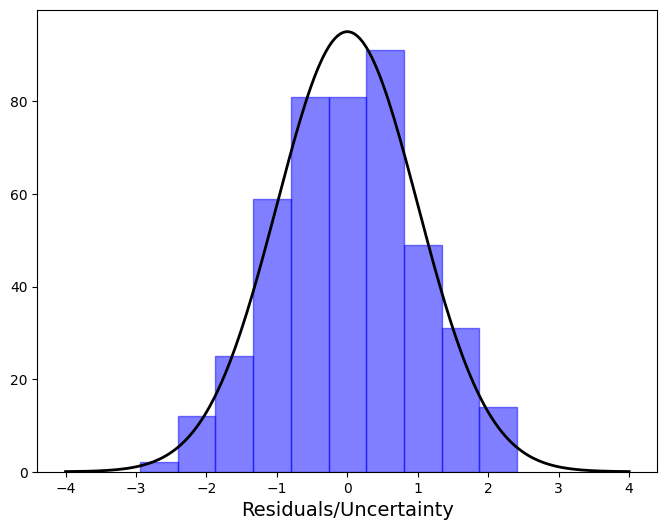

Completed lsq fit.
-------------------------


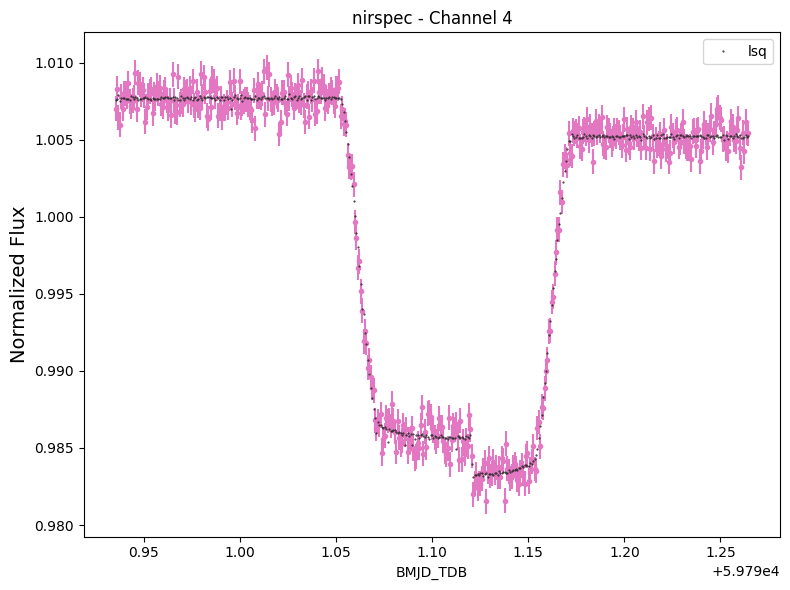

Saving results

Starting Channel 6 of 50

Starting lsq fit.
Starting lnprob: 2524.6644072435142
Current lnprob =  2528.5880670828474
Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2528.5880670828474
       x: [ 1.461e-01  2.042e-02  4.218e-01  1.007e+00 -3.083e-04
           -1.233e-02 -4.499e-01  1.537e+00]
     nit: 6
   direc: [[-6.382e-06 -2.075e-03 ... -1.982e-03 -2.312e-04]
           [ 0.000e+00  0.000e+00 ...  0.000e+00  1.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 4.534e-05 -8.301e-04 ... -1.280e-03 -5.004e-05]]
    nfev: 603

Ending lnprob: 2528.5880670828474
Reduced Chi-squared: 1.0184267151149682

LSQ RESULTS:
rp: 0.14614175818820985
u1: 0.020418778583625376
u2: 0.42177489916439775
c0: 1.006620370576488
c1: -0.0003082520870206411
ypos: -0.012326650980054511
ywidth: -0.4499169262809238
scatter_mult: 1.5365537410709718; 840.0384096455591 ppm



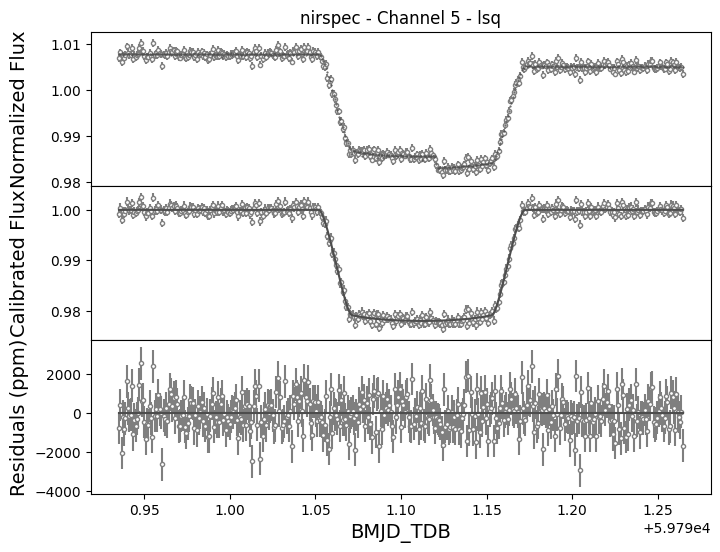

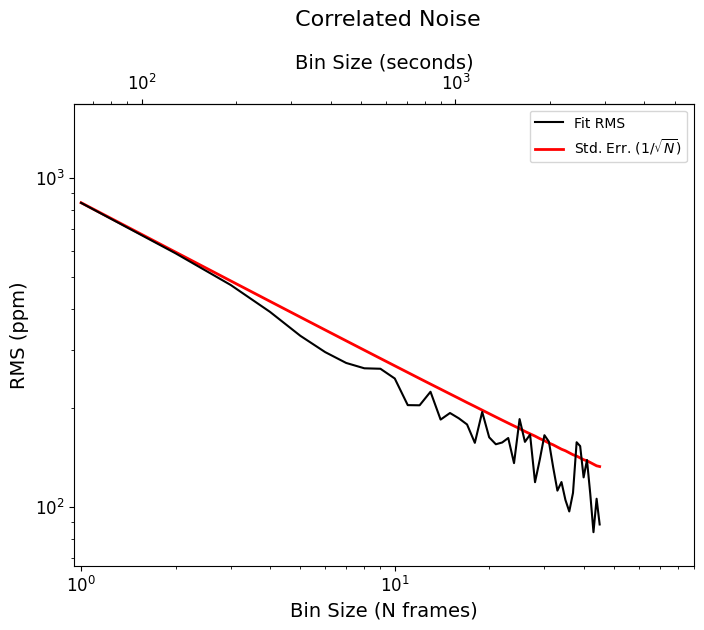

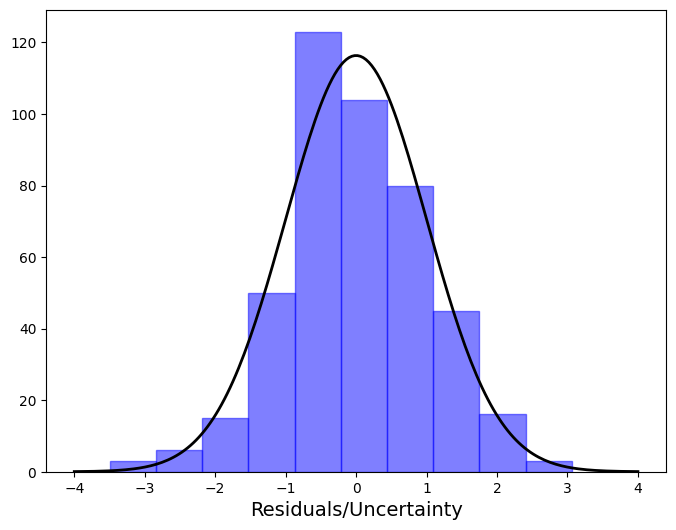

Completed lsq fit.
-------------------------


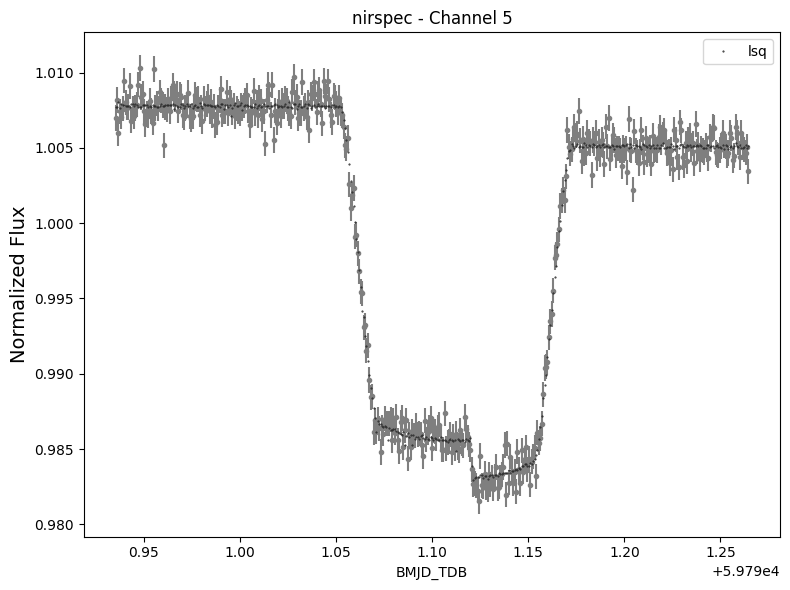

Saving results

Starting Channel 7 of 50

Starting lsq fit.
Starting lnprob: 2477.319589159317
Current lnprob =  2511.382247267839
Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2511.382247267839
       x: [ 1.457e-01  4.381e-02  5.559e-02  1.007e+00 -6.346e-04
           -1.877e-02 -3.209e-01  1.511e+00]
     nit: 7
   direc: [[-1.976e-04  6.289e-03 ...  2.924e-03  8.185e-04]
           [-7.482e-05 -1.599e-03 ...  6.996e-02 -2.842e-02]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 2.748e-06  9.122e-04 ...  2.217e-04 -1.263e-04]]
    nfev: 738

Ending lnprob: 2511.382247267839
Reduced Chi-squared: 1.0184053940616709

LSQ RESULTS:
rp: 0.14565657027082266
u1: 0.04380856685669002
u2: 0.055589855413415976
c0: 1.0065943935281456
c1: -0.0006346490140052042
ypos: -0.018769524810066326
ywidth: -0.32089324579995276
scatter_mult: 1.511037601277535; 873.3384750172619 ppm



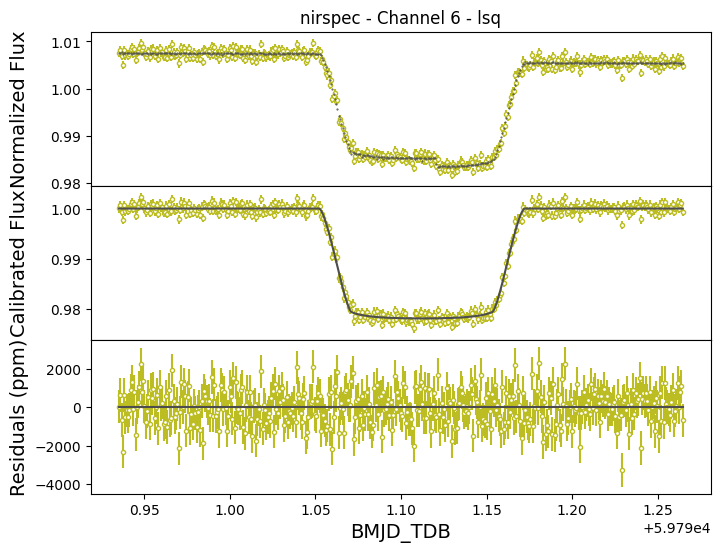

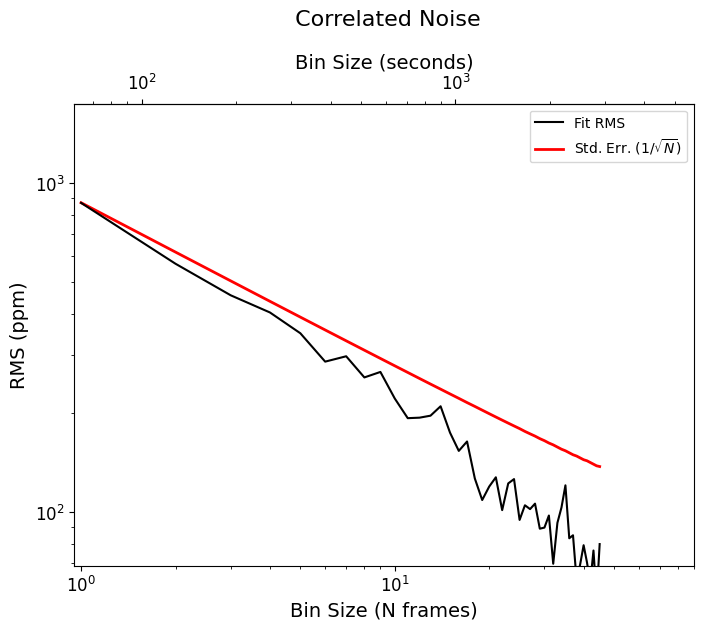

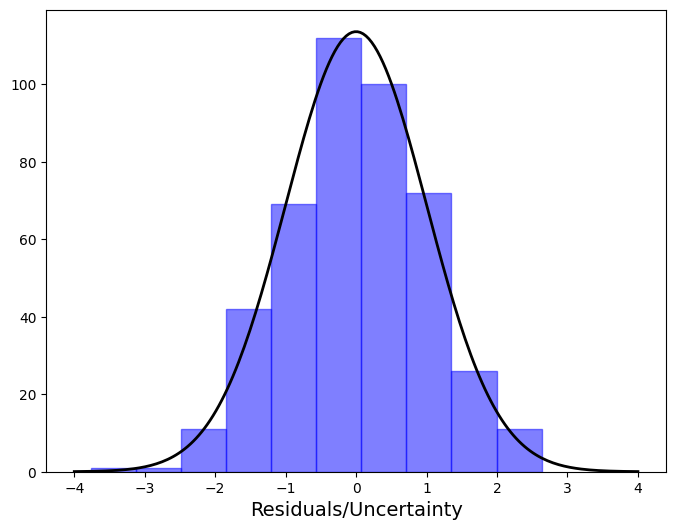

Completed lsq fit.
-------------------------


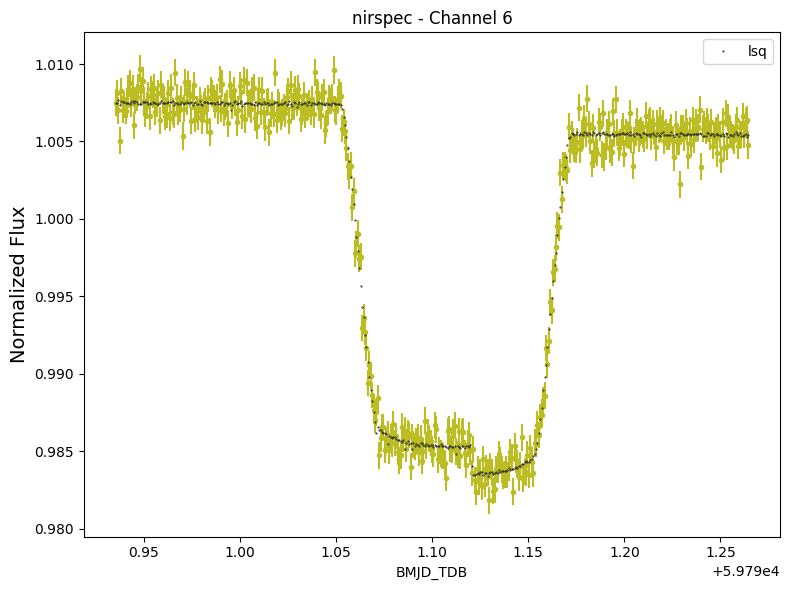

Saving results

Starting Channel 8 of 50

Starting lsq fit.
Starting lnprob: 2511.529360869338

Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2520.841865716508
       x: [ 1.462e-01  3.694e-02  9.765e-02  1.007e+00  9.017e-04
            2.097e-04 -3.146e-01  1.502e+00]
     nit: 5
   direc: [[ 0.000e+00  0.000e+00 ...  0.000e+00  1.000e+00]
           [ 1.315e-04 -1.080e-03 ...  1.131e-03 -9.525e-04]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 6.455e-06 -8.485e-04 ...  4.271e-04  9.663e-06]]
    nfev: 563

Ending lnprob: 2520.841865716508
Reduced Chi-squared: 1.0161057444318813

LSQ RESULTS:
rp: 0.1461915544375709
u1: 0.03693799012207695
u2: 0.0976513979517473
c0: 1.0066552077506064
c1: 0.0009016534630839546
ypos: 0.0002097129343469245
ywidth: -0.31461823001323264
scatter_mult: 1.501755565864582; 844.2565697458386 ppm



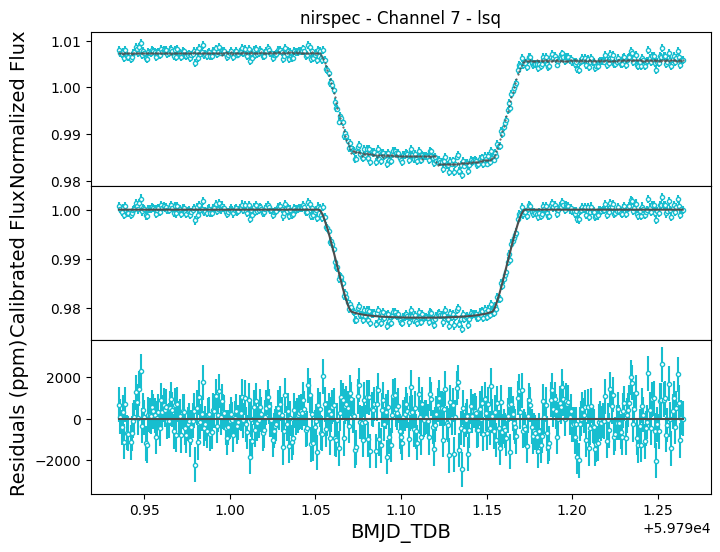

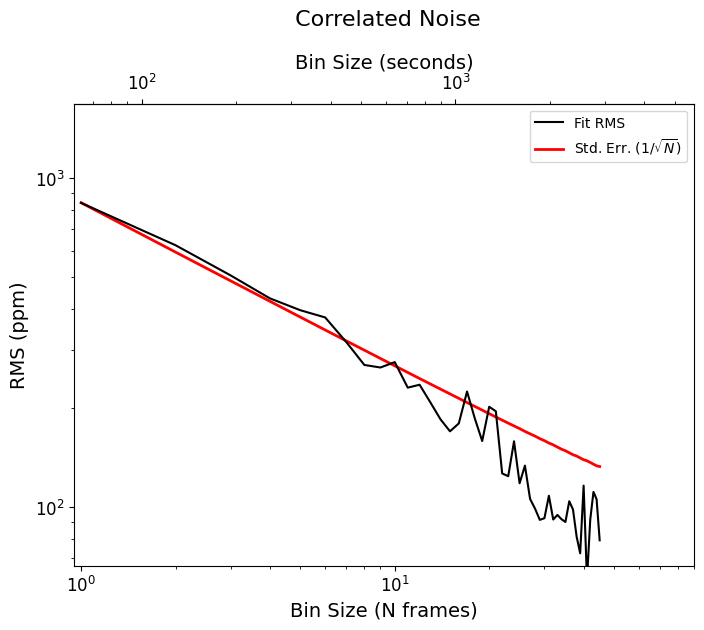

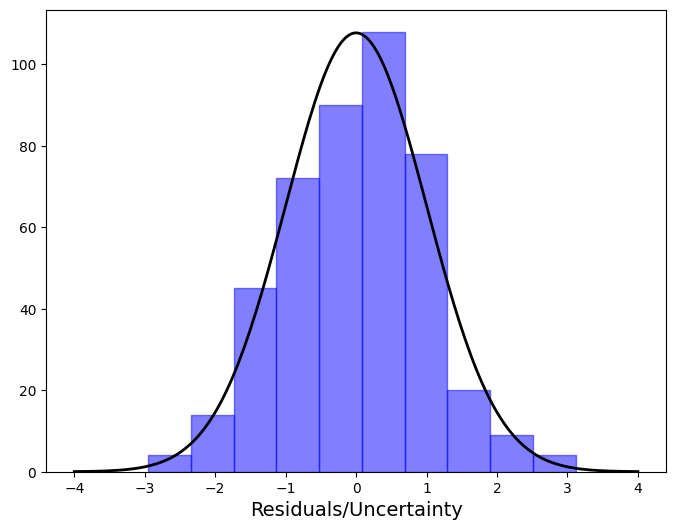

Completed lsq fit.
-------------------------


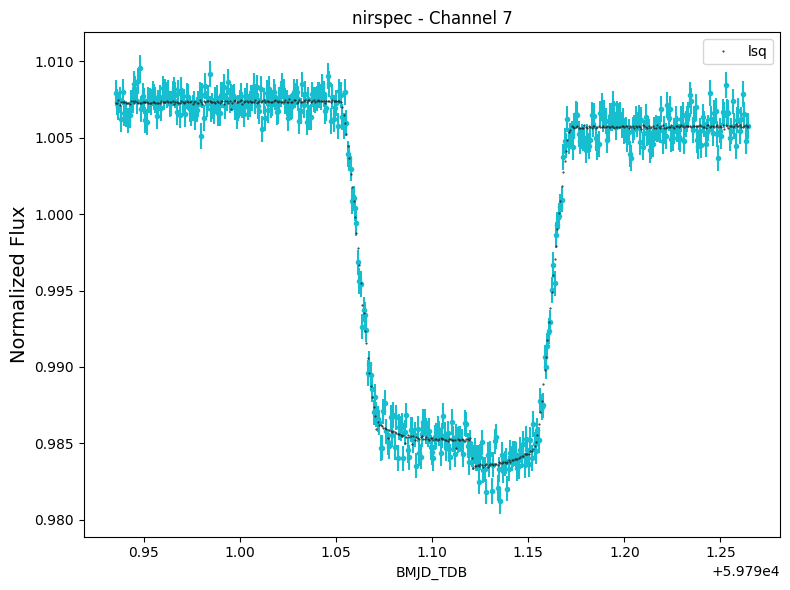

Saving results

Starting Channel 9 of 50

Starting lsq fit.
Starting lnprob: 2540.9505507098415
Current lnprob =  2543.1087420788003
Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2543.113019411155
       x: [ 1.465e-01  2.050e-02  4.296e-01  1.007e+00  4.051e-04
           -8.458e-03 -3.109e-01  1.439e+00]
     nit: 5
   direc: [[ 4.922e-05 -5.525e-03 ...  1.600e-03 -9.290e-04]
           [ 0.000e+00  0.000e+00 ...  0.000e+00  1.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 2.919e-05 -4.490e-04 ... -1.406e-04 -2.654e-06]]
    nfev: 547

Ending lnprob: 2543.113019411155
Reduced Chi-squared: 1.018335152804772

LSQ RESULTS:
rp: 0.1465452560430821
u1: 0.020501494959824257
u2: 0.4296453039078491
c0: 1.0066571316424326
c1: 0.00040513047850064776
ypos: -0.008458236530667863
ywidth: -0.3108732843849067
scatter_mult: 1.4394734562390186; 813.327393063644 ppm



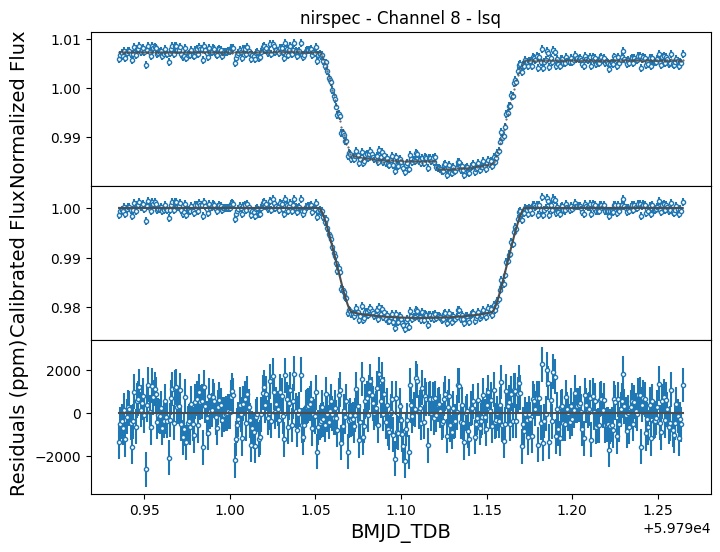

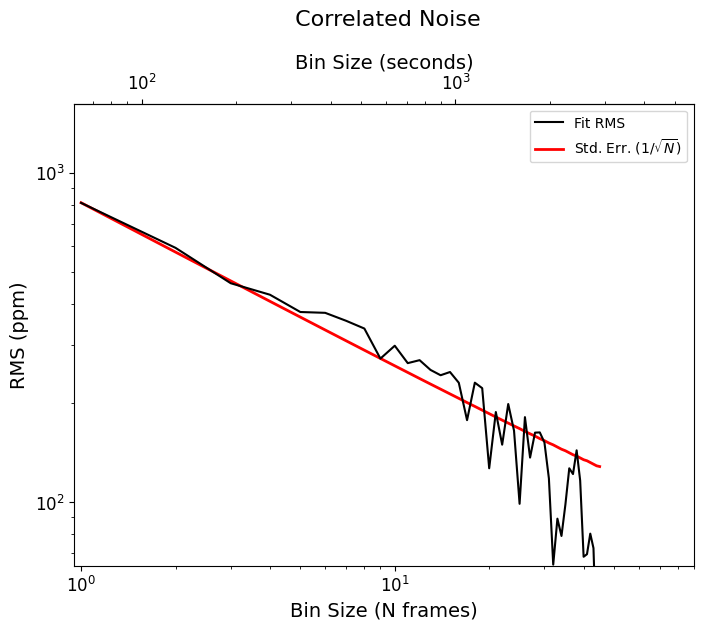

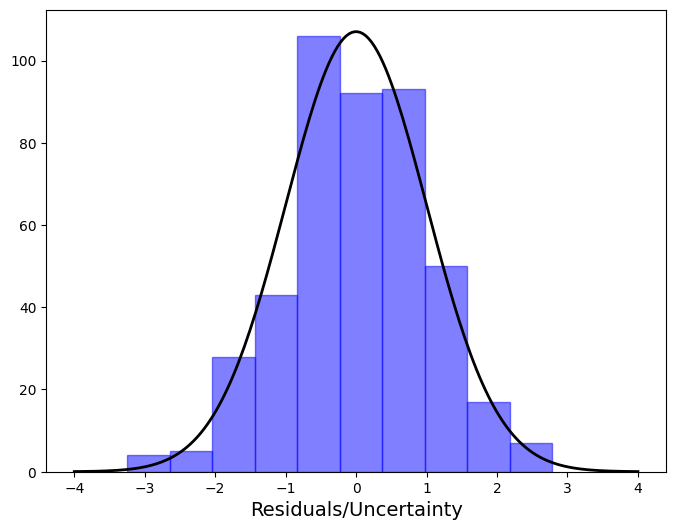

Completed lsq fit.
-------------------------


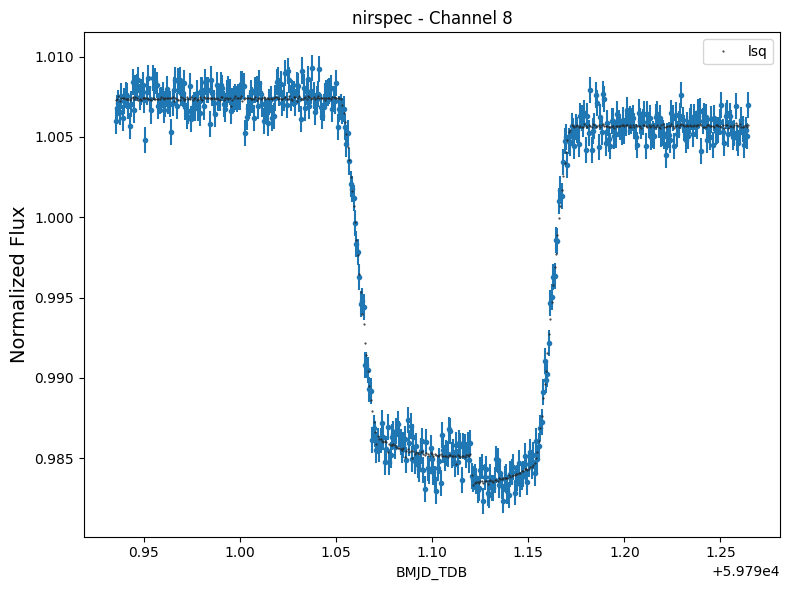

Saving results

Starting Channel 10 of 50

Starting lsq fit.
Starting lnprob: 2469.691069621144
Current lnprob =  2481.998848176387
Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2482.0063977247346
       x: [ 1.454e-01  2.221e-02  5.629e-01  1.007e+00 -1.878e-04
           -1.844e-02 -3.046e-01  1.598e+00]
     nit: 5
   direc: [[ 0.000e+00  0.000e+00 ...  0.000e+00  1.000e+00]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 1.404e-06 -5.451e-04 ...  3.122e-03 -3.839e-05]]
    nfev: 525

Ending lnprob: 2482.0063977247346
Reduced Chi-squared: 1.0162093176095626

LSQ RESULTS:
rp: 0.14544419080989088
u1: 0.022209392230484837
u2: 0.5628550146175986
c0: 1.0065308910238122
c1: -0.0001878201398672866
ypos: -0.018441553613476876
ywidth: -0.3045666385130384
scatter_mult: 1.5979890597091628; 921.2890968838204 ppm



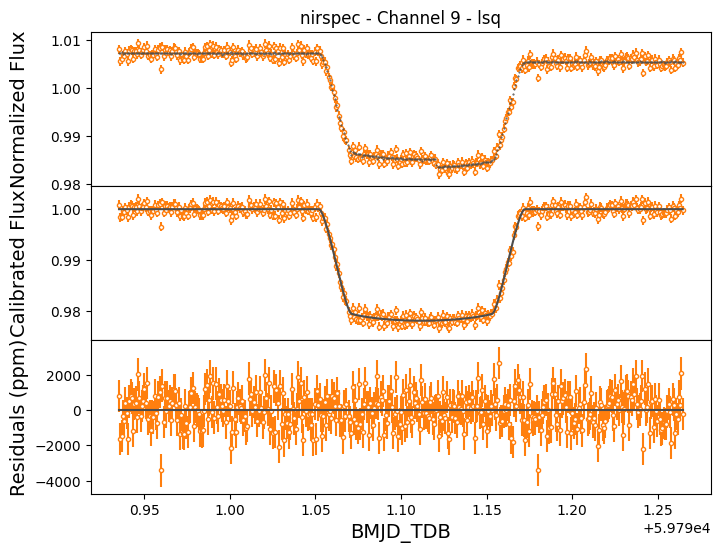

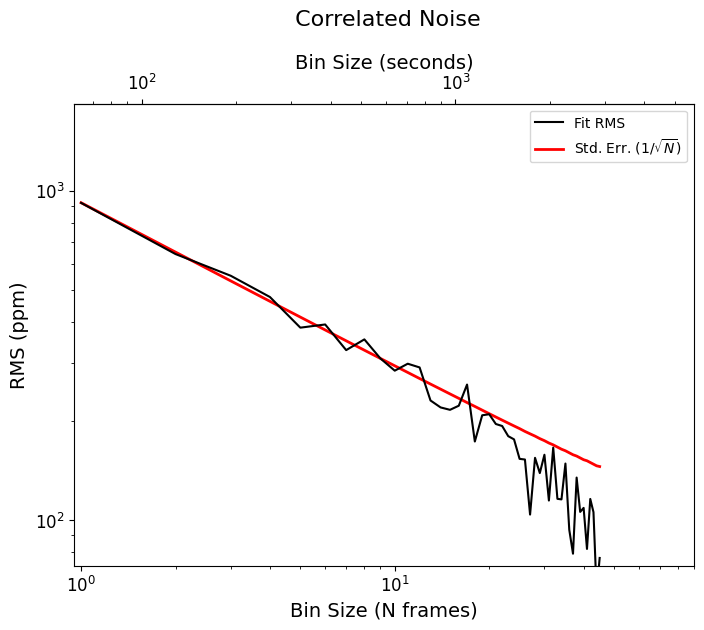

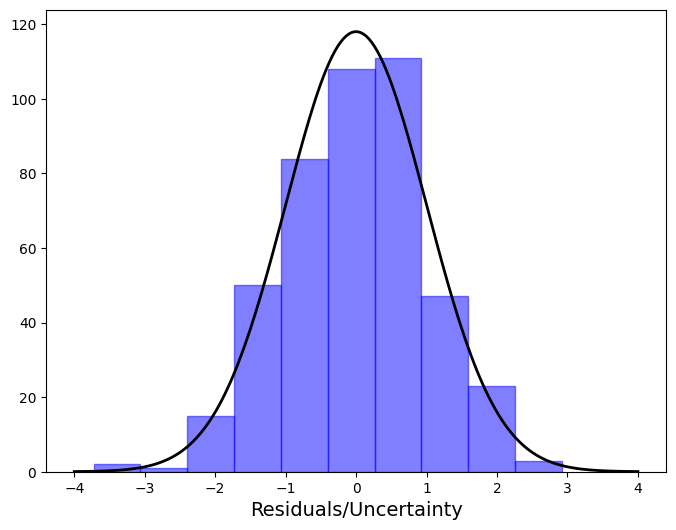

Completed lsq fit.
-------------------------


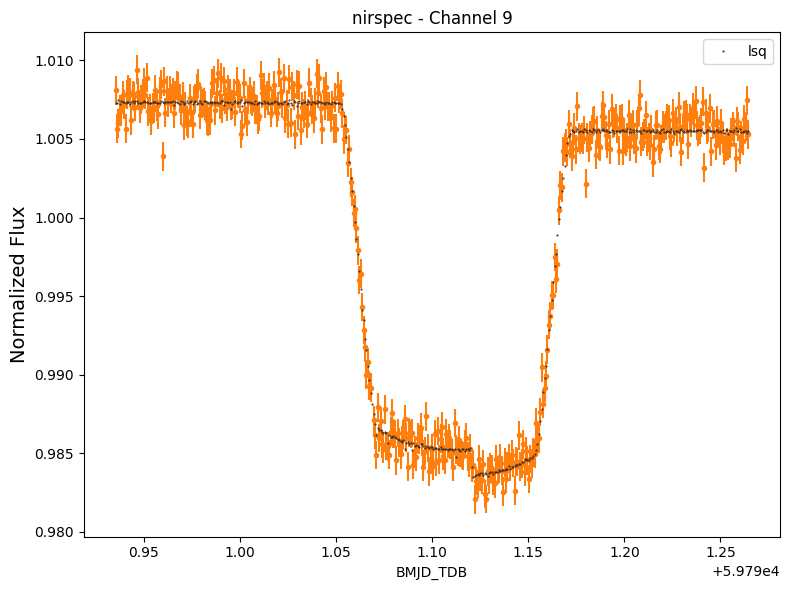

Saving results

Starting Channel 11 of 50

Starting lsq fit.
Starting lnprob: 2506.5388195467704
Current lnprob =  2519.1847269260934
Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2519.1847269260934
       x: [ 1.454e-01  3.872e-02  1.227e-01  1.007e+00  3.218e-04
           -2.853e-03 -3.827e-01  1.473e+00]
     nit: 7
   direc: [[ 1.227e-04  1.118e-02 ... -3.134e-02 -1.217e-02]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 6.031e-05 -2.962e-03 ... -4.396e-03 -1.842e-04]]
    nfev: 737

Ending lnprob: 2519.1847269260934
Reduced Chi-squared: 1.0183771879485435

LSQ RESULTS:
rp: 0.14538042799878148
u1: 0.03872291898164812
u2: 0.12271797797376376
c0: 1.006566079494841
c1: 0.0003218495928250959
ypos: -0.0028529256563789482
ywidth: -0.382668283285974
scatter_mult: 1.472567178819793; 858.1536990423966 ppm



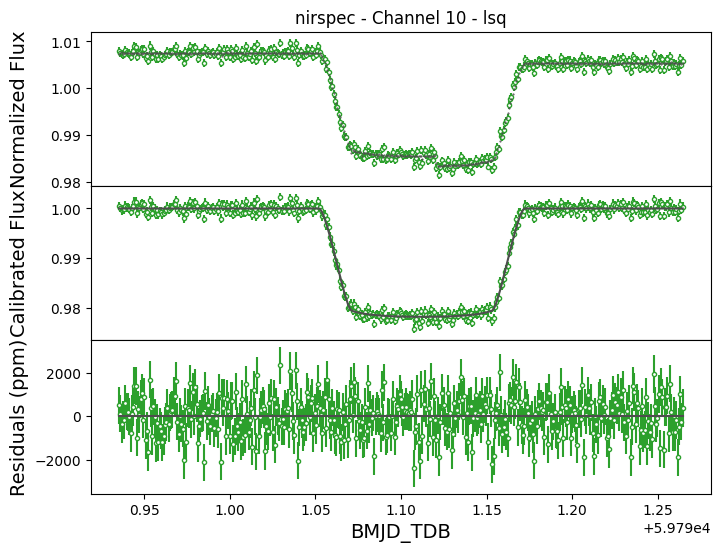

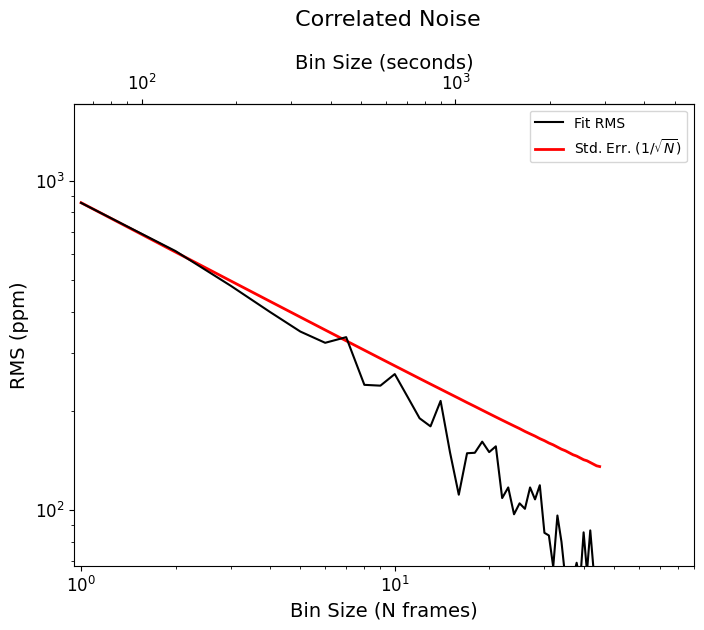

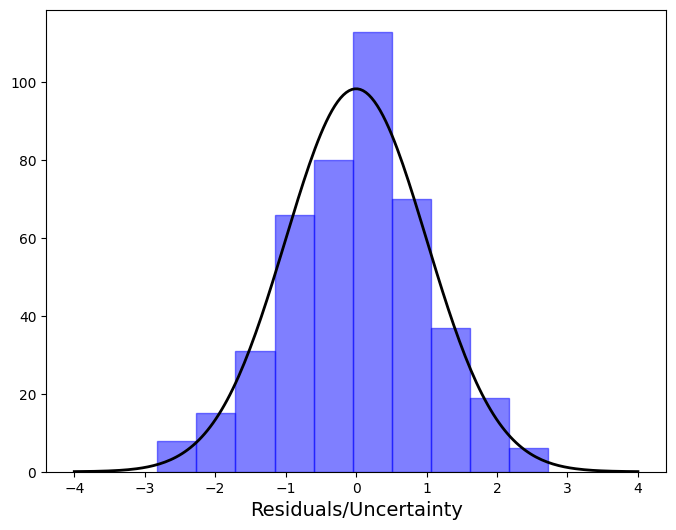

Completed lsq fit.
-------------------------


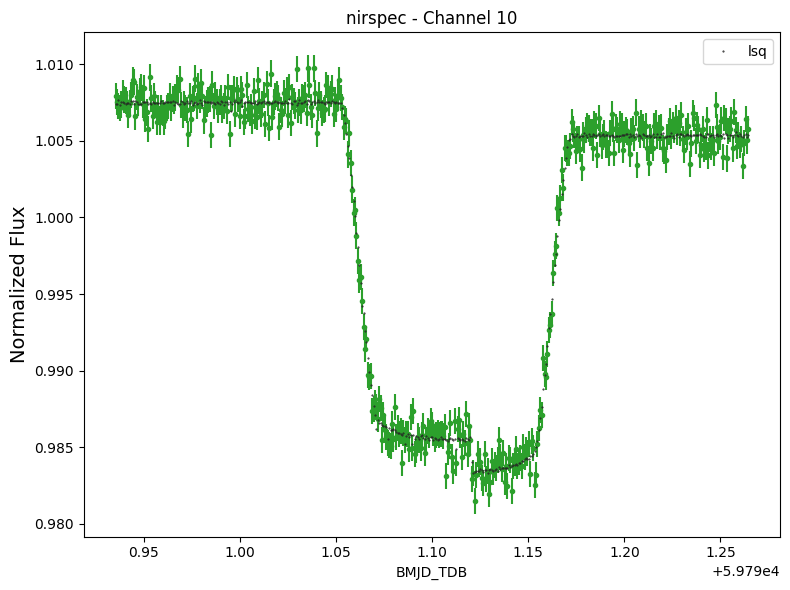

Saving results

Starting Channel 12 of 50

Starting lsq fit.
Starting lnprob: 2487.569945222119

Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2491.110477810338
       x: [ 1.449e-01  2.984e-02  3.399e-01  1.007e+00  2.270e-05
            1.859e-02 -3.675e-01  1.552e+00]
     nit: 6
   direc: [[-4.451e-05 -2.270e-03 ...  3.799e-03 -3.764e-04]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 3.627e-05 -9.152e-04 ...  1.122e-03 -2.043e-05]]
    nfev: 653

Ending lnprob: 2491.110477810338
Reduced Chi-squared: 1.0184417645523092

LSQ RESULTS:
rp: 0.14488334720622503
u1: 0.02983695407466475
u2: 0.3398813428248798
c0: 1.0065139176164497
c1: 2.2701025191470483e-05
ypos: 0.018587752872818164
ywidth: -0.36747688450745264
scatter_mult: 1.5515876547191003; 913.9107257715209 ppm



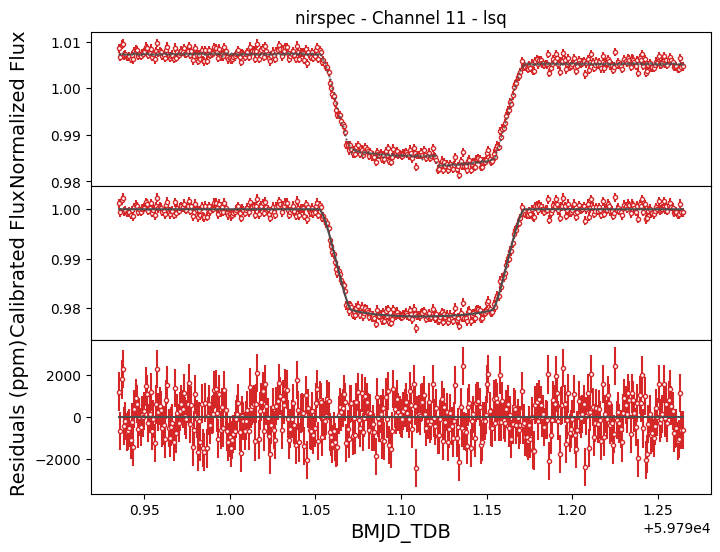

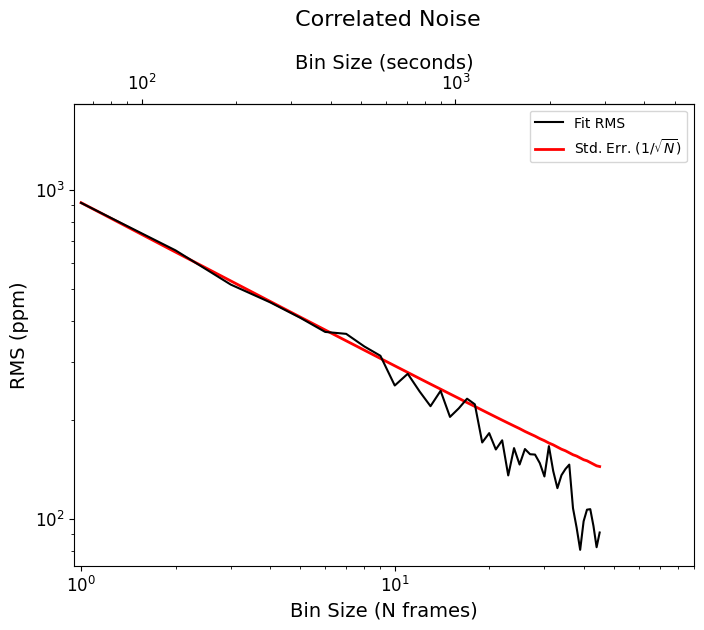

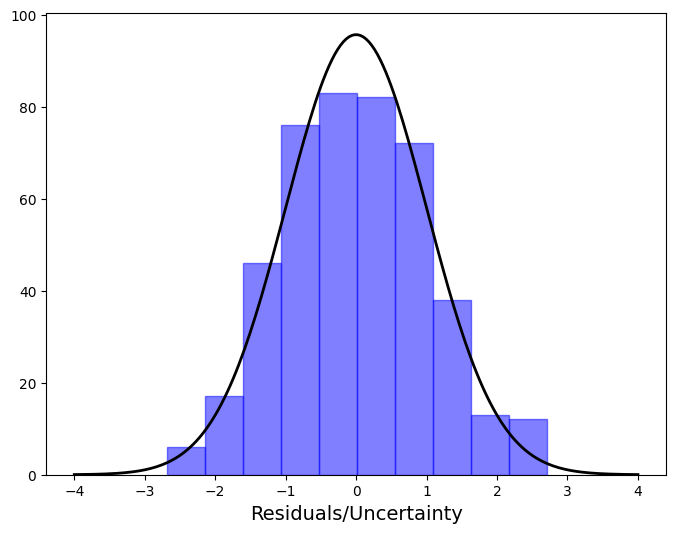

Completed lsq fit.
-------------------------


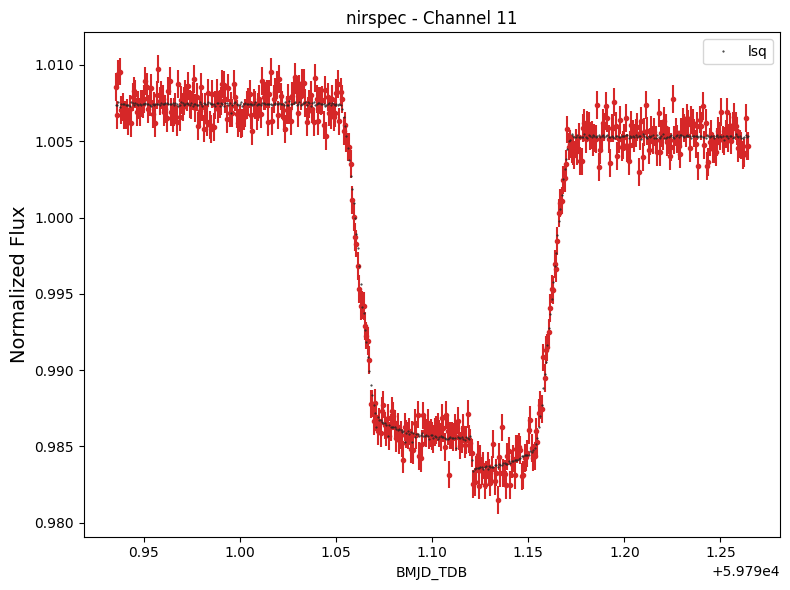

Saving results

Starting Channel 13 of 50

Starting lsq fit.
Starting lnprob: 2458.634293050891
Current lnprob =  2474.248825734306
Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2474.248825734306
       x: [ 1.462e-01  2.185e-02  8.000e-12  1.007e+00  5.108e-04
            4.523e-02 -4.282e-01  1.585e+00]
     nit: 5
   direc: [[ 1.000e+00  0.000e+00 ...  0.000e+00  0.000e+00]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 9.629e-05  8.998e-04 ... -2.147e-02 -2.480e-03]]
    nfev: 688

Ending lnprob: 2474.248825734306
Reduced Chi-squared: 1.0185063890504553

LSQ RESULTS:
rp: 0.1461746842608453
u1: 0.021845115188532164
u2: 7.999872296090026e-12
c0: 1.006626359531203
c1: 0.0005107902187919637
ypos: 0.04523168685256934
ywidth: -0.42815765318727717
scatter_mult: 1.5849622351252335; 949.024246532079 ppm



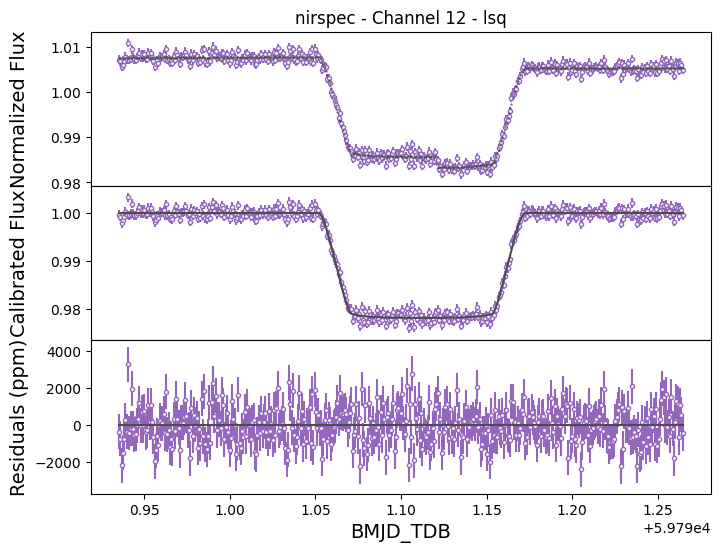

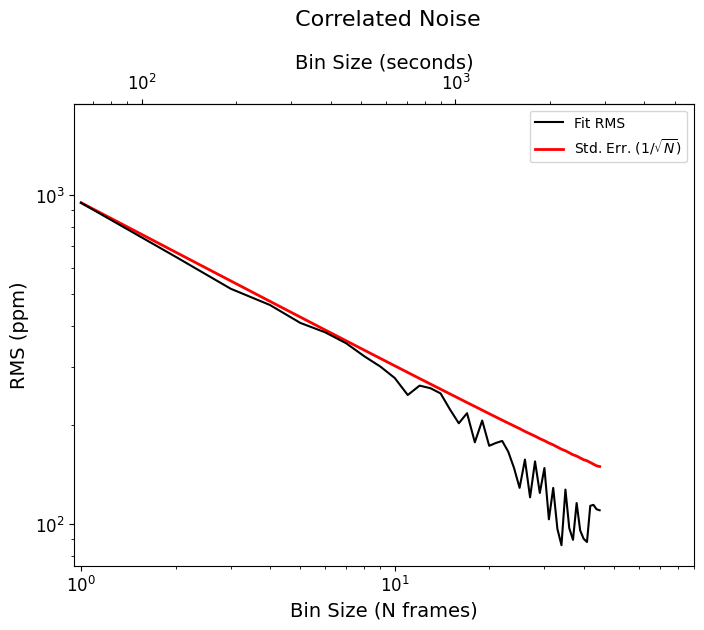

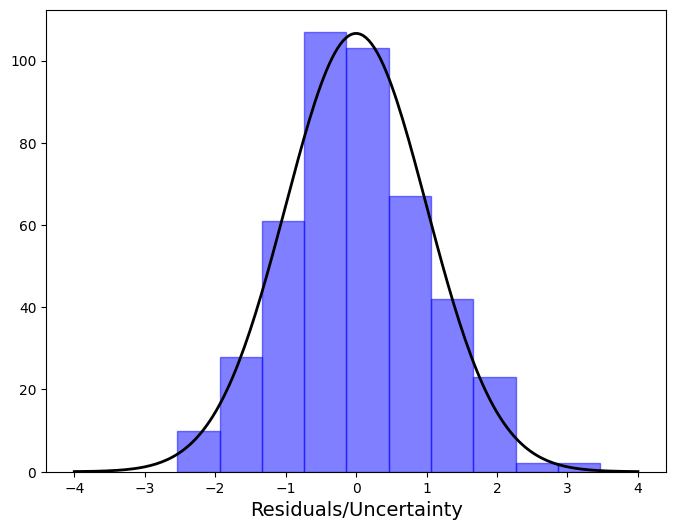

Completed lsq fit.
-------------------------


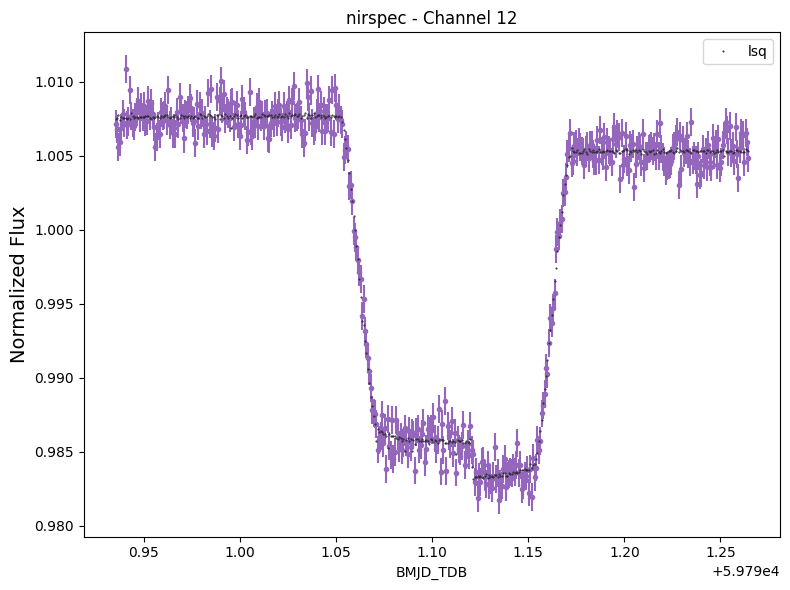

Saving results

Starting Channel 14 of 50

Starting lsq fit.
Starting lnprob: 2463.6311900364813

Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2509.2334000825044
       x: [ 1.476e-01  4.039e-02  1.232e-01  1.007e+00  2.852e-05
            1.714e-02 -3.036e-01  1.455e+00]
     nit: 7
   direc: [[ 3.668e-04 -1.467e-02 ...  4.620e-02 -2.180e-02]
           [-2.297e-04  2.677e-03 ...  1.150e-02  1.607e-03]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [-1.656e-05  2.315e-03 ...  6.860e-04 -1.248e-04]]
    nfev: 748

Ending lnprob: 2509.2334000825044
Reduced Chi-squared: 1.0183597977134666

LSQ RESULTS:
rp: 0.14755050309440557
u1: 0.04038889911025401
u2: 0.12319912493910647
c0: 1.0067649277436703
c1: 2.8515244757925055e-05
ypos: 0.017140695783108027
ywidth: -0.30358752843623826
scatter_mult: 1.4548694918112255; 877.6467525887408 ppm



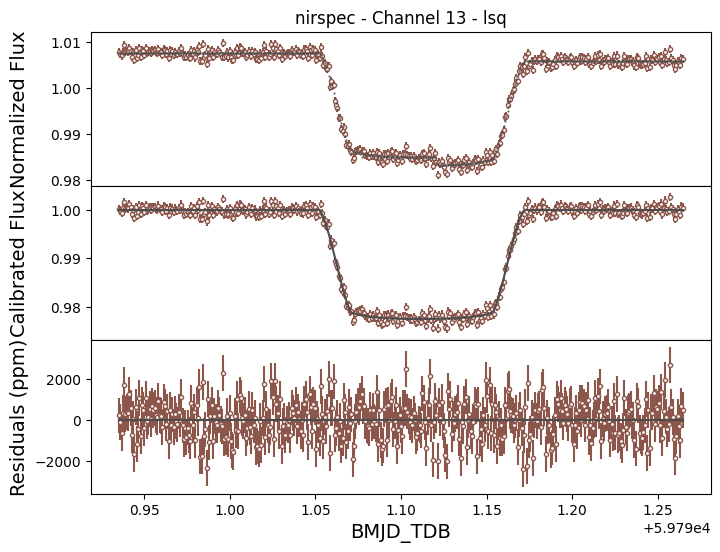

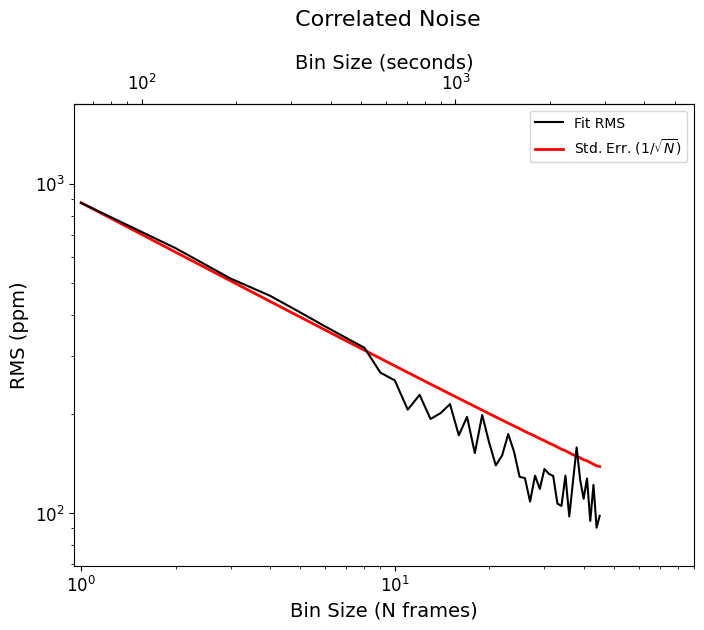

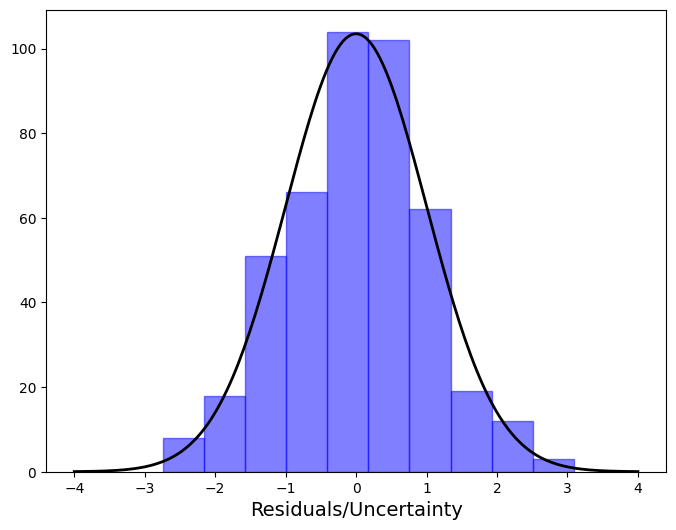

Completed lsq fit.
-------------------------


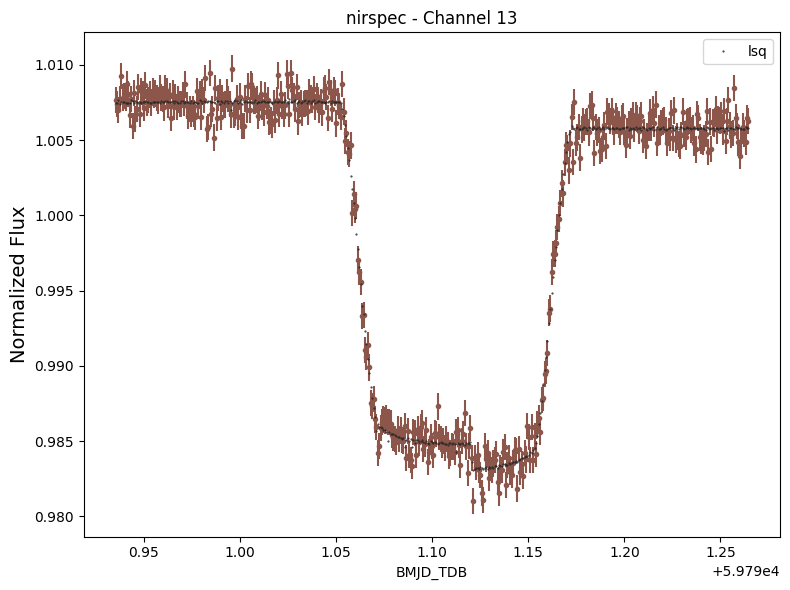

Saving results

Starting Channel 15 of 50

Starting lsq fit.
Starting lnprob: 2474.51219541039
Current lnprob =  2480.669223095484
Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2480.669223095484
       x: [ 1.484e-01  3.224e-02  4.874e-12  1.007e+00  5.843e-04
            6.256e-02 -3.120e-01  1.517e+00]
     nit: 5
   direc: [[ 1.000e+00  0.000e+00 ...  0.000e+00  0.000e+00]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 4.088e-05 -9.755e-05 ... -2.044e-03 -6.244e-05]]
    nfev: 647

Ending lnprob: 2480.669223095484
Reduced Chi-squared: 1.0184189860113555

LSQ RESULTS:
rp: 0.14843281817447462
u1: 0.03223799713162177
u2: 4.873693972606342e-12
c0: 1.0068412841671852
c1: 0.0005842541589778539
ypos: 0.06255534430614598
ywidth: -0.3120120727545894
scatter_mult: 1.5174018099761493; 935.4234529456636 ppm



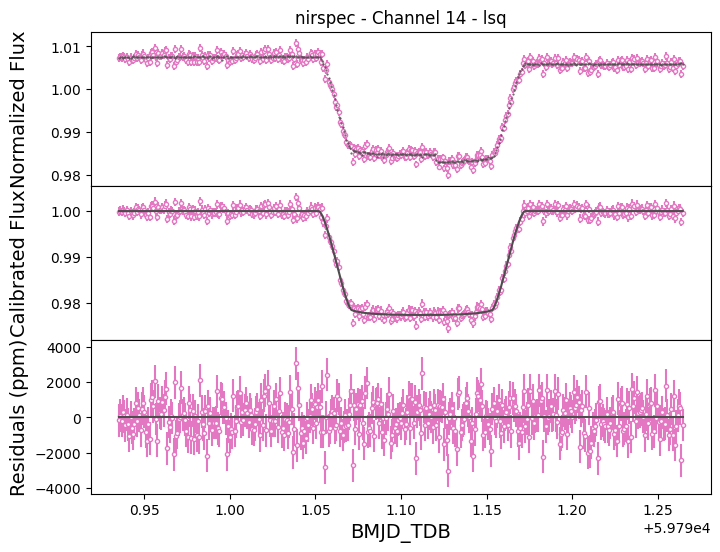

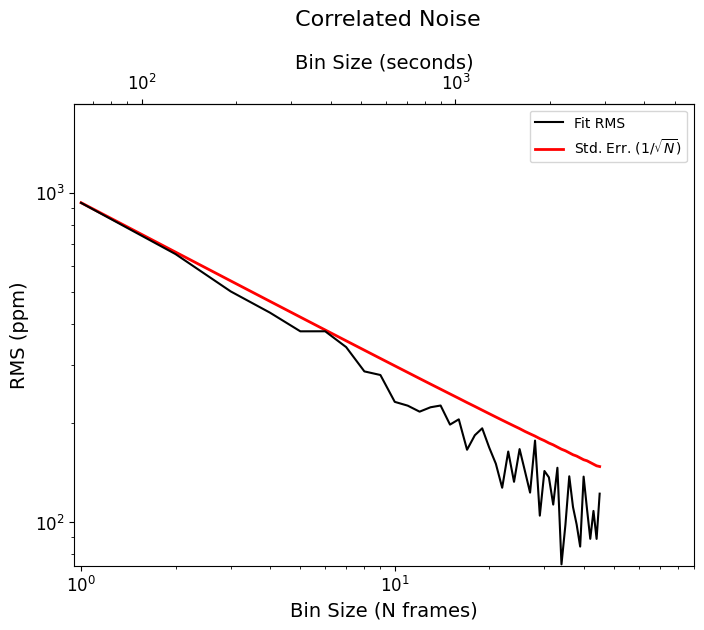

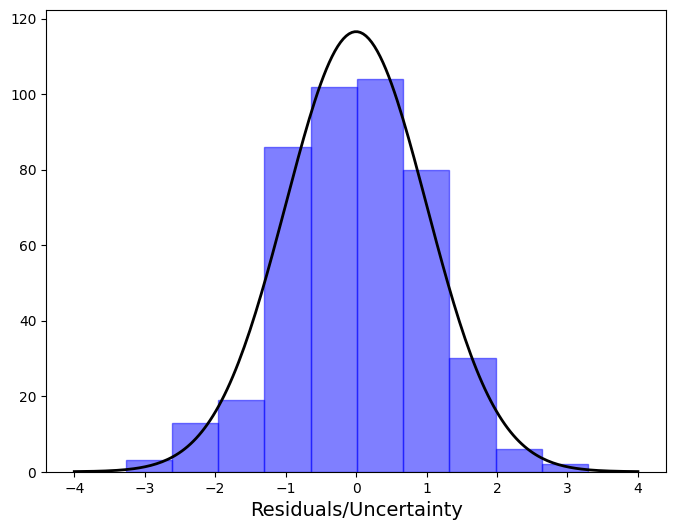

Completed lsq fit.
-------------------------


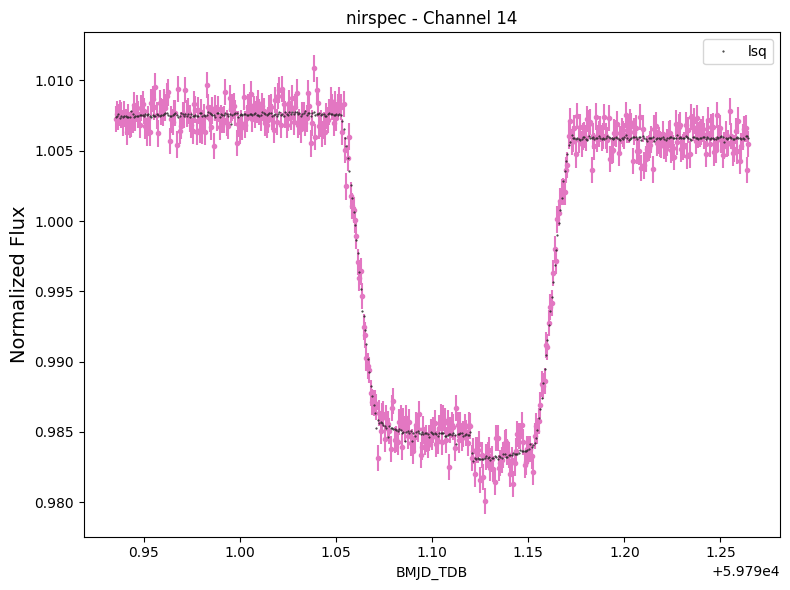

Saving results

Starting Channel 16 of 50

Starting lsq fit.
Starting lnprob: 2441.774035991564

Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2478.052343169772
       x: [ 1.497e-01  1.610e-02  1.000e+00  1.007e+00 -1.117e-03
           -1.065e-02 -3.716e-01  1.500e+00]
     nit: 9
   direc: [[ 1.000e+00  0.000e+00 ...  0.000e+00  0.000e+00]
           [ 0.000e+00  0.000e+00 ...  0.000e+00  1.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 1.999e-05  5.921e-13 ... -1.913e-03 -4.570e-05]]
    nfev: 1205

Ending lnprob: 2478.052343169772
Reduced Chi-squared: 1.0183987995312345

LSQ RESULTS:
rp: 0.14965560113826268
u1: 0.016096633094443213
u2: 0.9999999999976609
c0: 1.0069362481836157
c1: -0.001116755006805272
ypos: -0.01064898061336699
ywidth: -0.37158332525951177
scatter_mult: 1.4997926733497535; 941.1466840199209 ppm



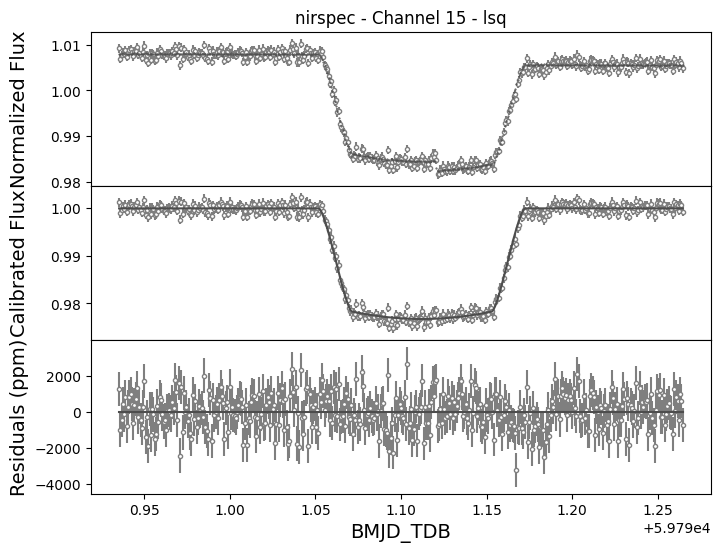

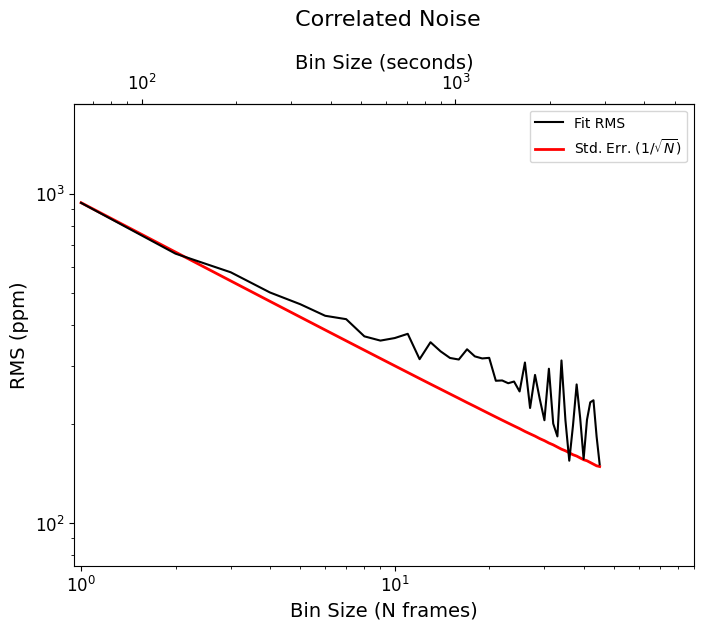

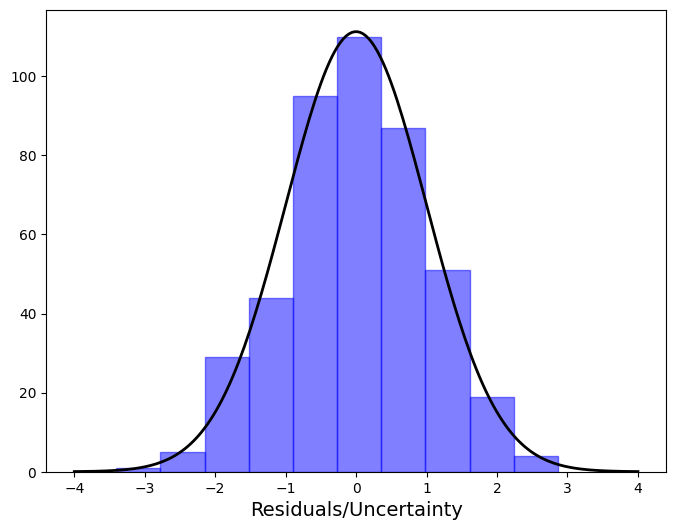

Completed lsq fit.
-------------------------


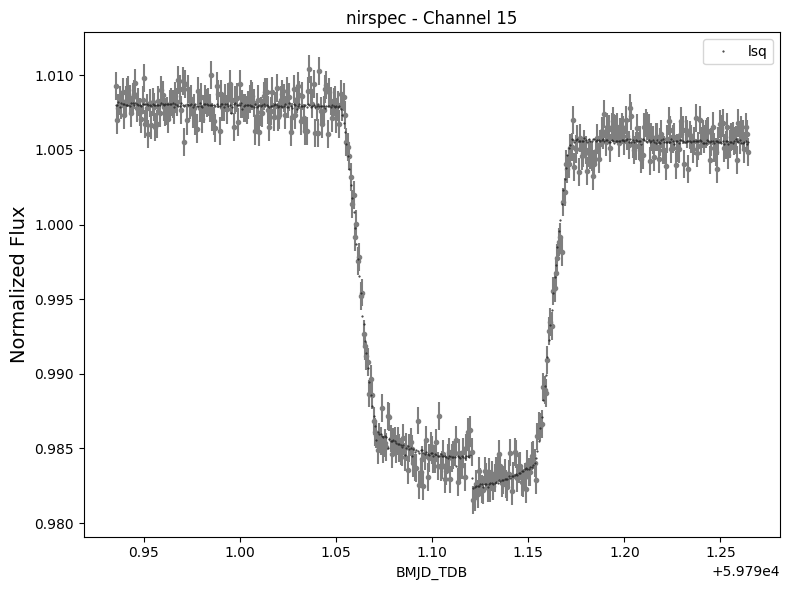

Saving results

Starting Channel 17 of 50

Starting lsq fit.
Starting lnprob: 2470.2686164851916

Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2479.1999912425817
       x: [ 1.500e-01  3.987e-02  1.386e-02  1.007e+00  6.387e-04
            3.716e-02 -4.254e-01  1.412e+00]
     nit: 8
   direc: [[ 1.000e+00  0.000e+00 ...  0.000e+00  0.000e+00]
           [ 0.000e+00  0.000e+00 ...  0.000e+00  1.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [-7.695e-05  5.050e-03 ...  6.448e-03 -1.393e-03]]
    nfev: 773

Ending lnprob: 2479.1999912425817
Reduced Chi-squared: 1.0183477845803262

LSQ RESULTS:
rp: 0.14995599243752525
u1: 0.03987120207402773
u2: 0.013860741515631481
c0: 1.0069881551888702
c1: 0.0006387089982709744
ypos: 0.037157693501070316
ywidth: -0.42535963217145145
scatter_mult: 1.4119953234140021; 938.5859978593759 ppm



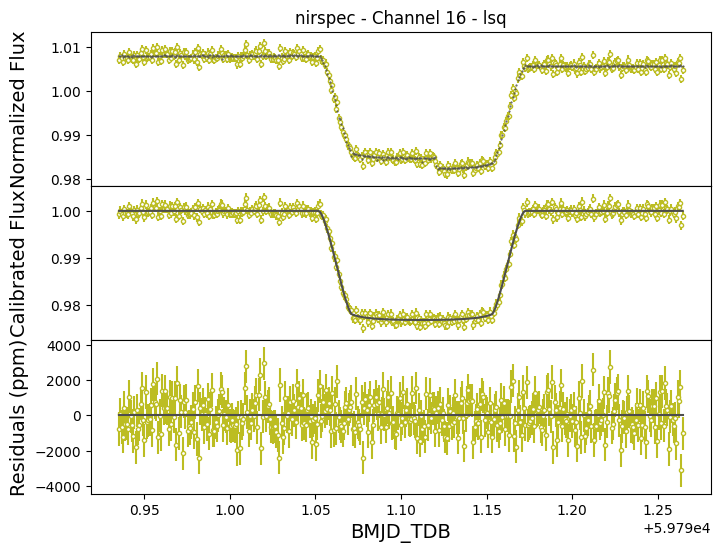

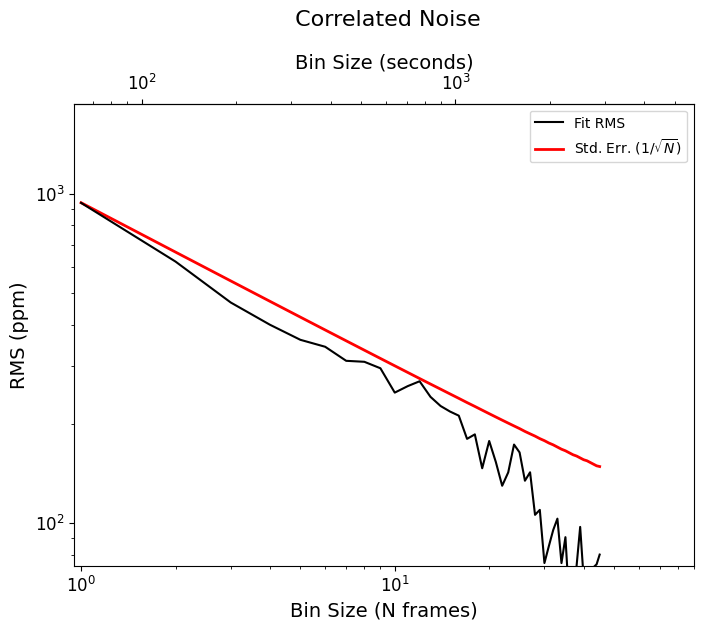

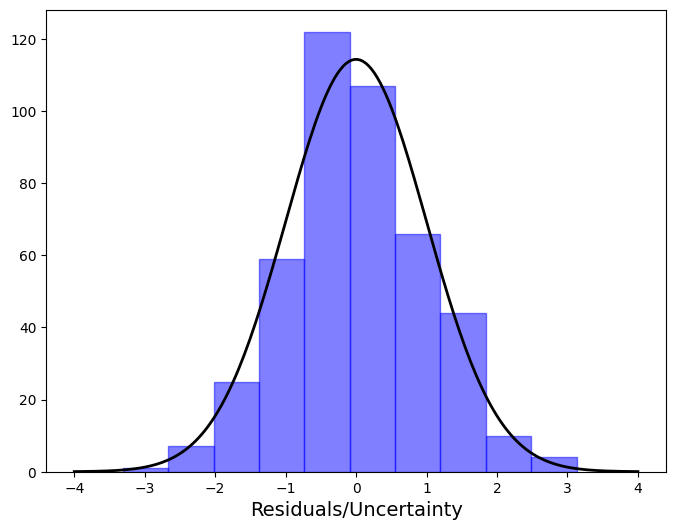

Completed lsq fit.
-------------------------


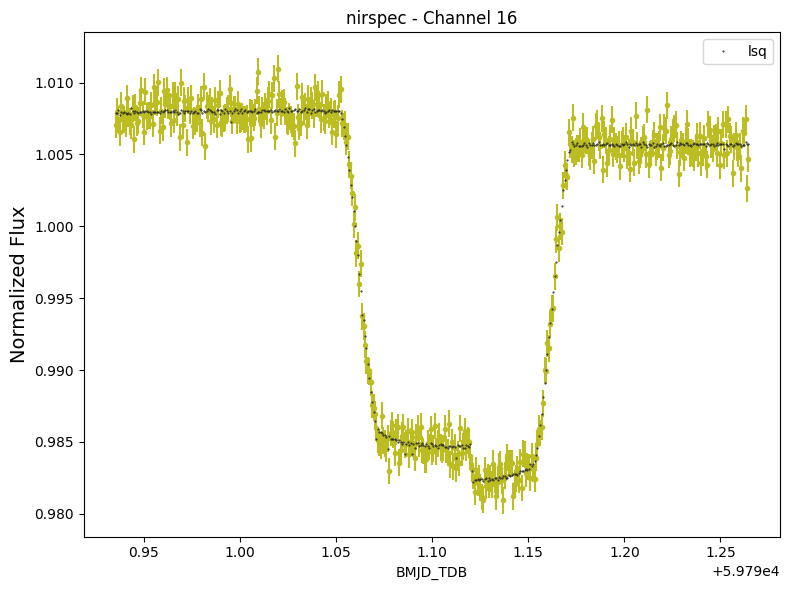

Saving results

Starting Channel 18 of 50

Starting lsq fit.
Starting lnprob: 2414.3031806913214
Current lnprob =  2428.9624086949843
Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2428.9624086949843
       x: [ 1.497e-01  4.507e-02  9.429e-02  1.007e+00  3.096e-04
            8.110e-02 -3.558e-01  1.561e+00]
     nit: 7
   direc: [[ 1.375e-05  1.399e-03 ...  2.104e-03  1.242e-04]
           [-7.625e-05 -9.133e-03 ...  3.362e-02 -6.478e-03]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [-5.405e-05  1.893e-03 ...  1.013e-03 -1.250e-04]]
    nfev: 714

Ending lnprob: 2428.9624086949843
Reduced Chi-squared: 1.013876229638227

LSQ RESULTS:
rp: 0.14973913706536326
u1: 0.045071646805520664
u2: 0.09429489995884326
c0: 1.0070005738940189
c1: 0.0003095793361563316
ypos: 0.08109785288906089
ywidth: -0.35581757032348277
scatter_mult: 1.5607427562944753; 1024.6188334014932 ppm



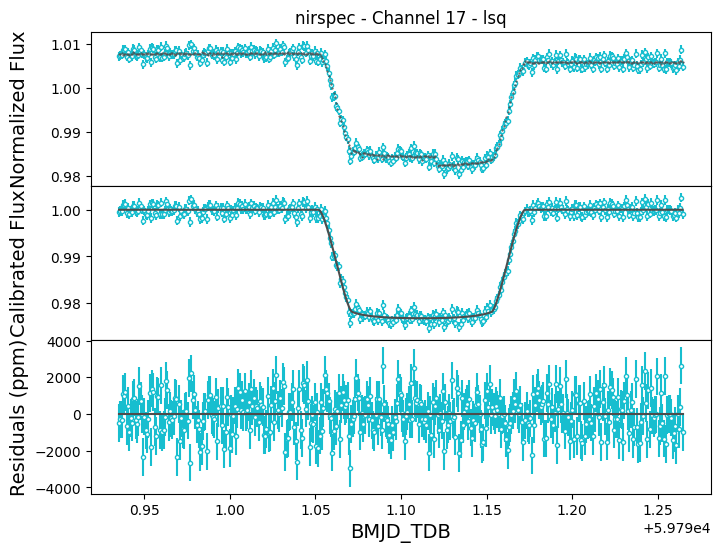

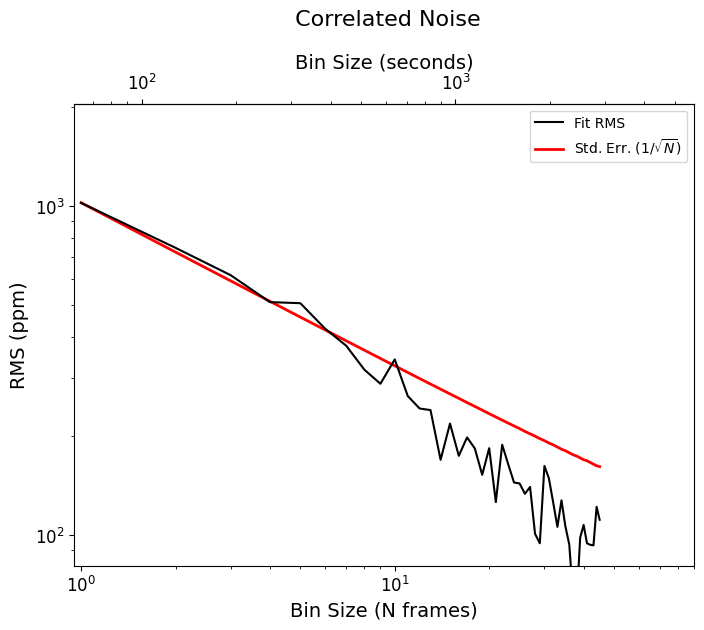

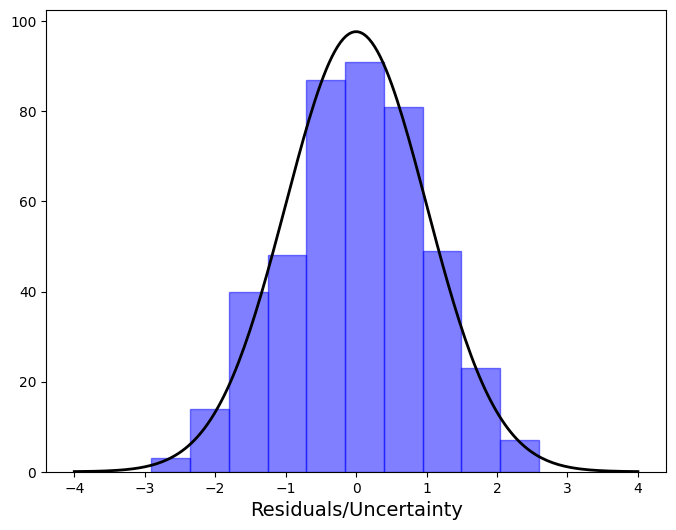

Completed lsq fit.
-------------------------


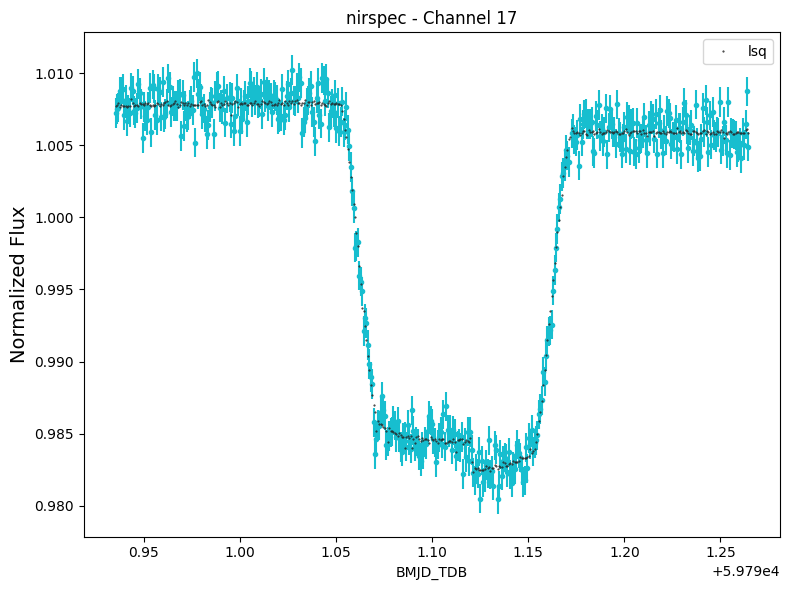

Saving results

Starting Channel 19 of 50

Starting lsq fit.
Starting lnprob: 2451.498666610818

Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2456.1506431115986
       x: [ 1.507e-01  2.072e-02  4.355e-01  1.007e+00  4.385e-04
            2.620e-02 -3.497e-01  1.474e+00]
     nit: 5
   direc: [[ 0.000e+00  0.000e+00 ...  0.000e+00  1.000e+00]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 2.330e-05 -1.925e-03 ... -1.569e-03  3.766e-04]]
    nfev: 490

Ending lnprob: 2456.1506431115986
Reduced Chi-squared: 1.0182549387004702

LSQ RESULTS:
rp: 0.15066695691556575
u1: 0.020720263732035865
u2: 0.4355147248207464
c0: 1.007037520558854
c1: 0.0004385102927084192
ypos: 0.026199894864501663
ywidth: -0.34971641422083233
scatter_mult: 1.4739738182995967; 988.6411521304992 ppm



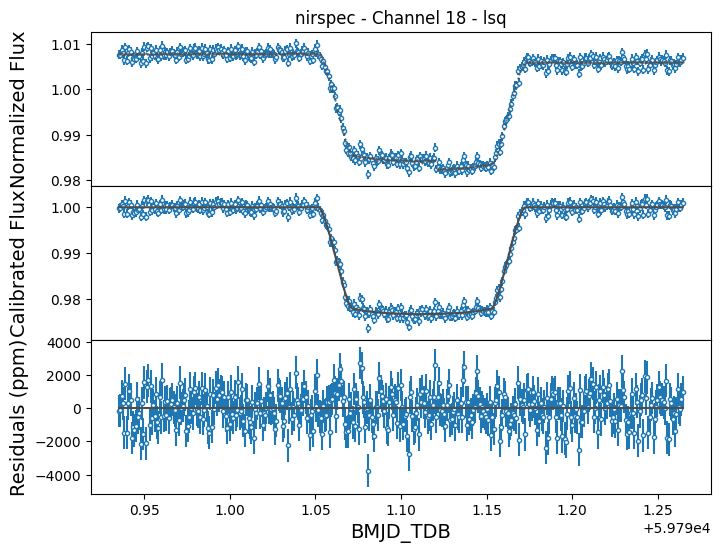

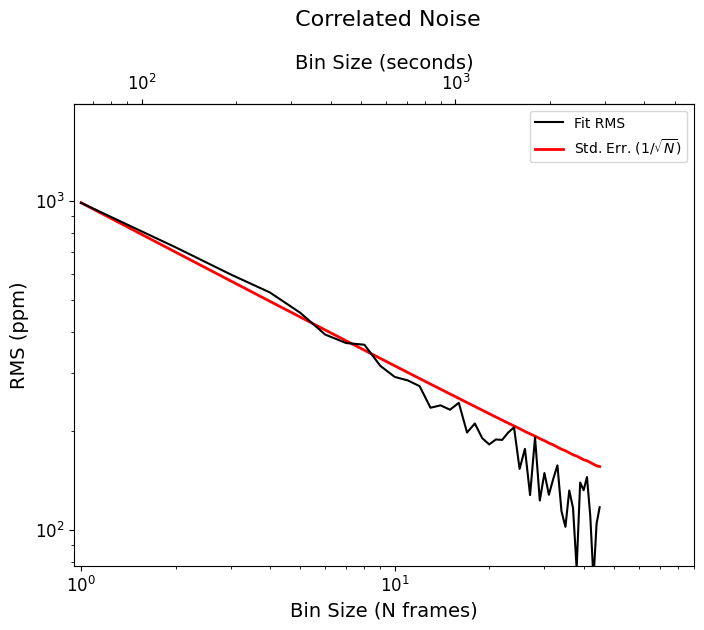

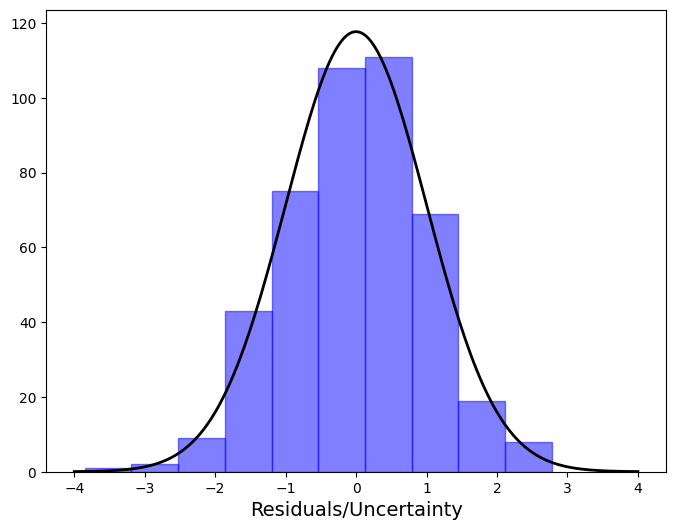

Completed lsq fit.
-------------------------


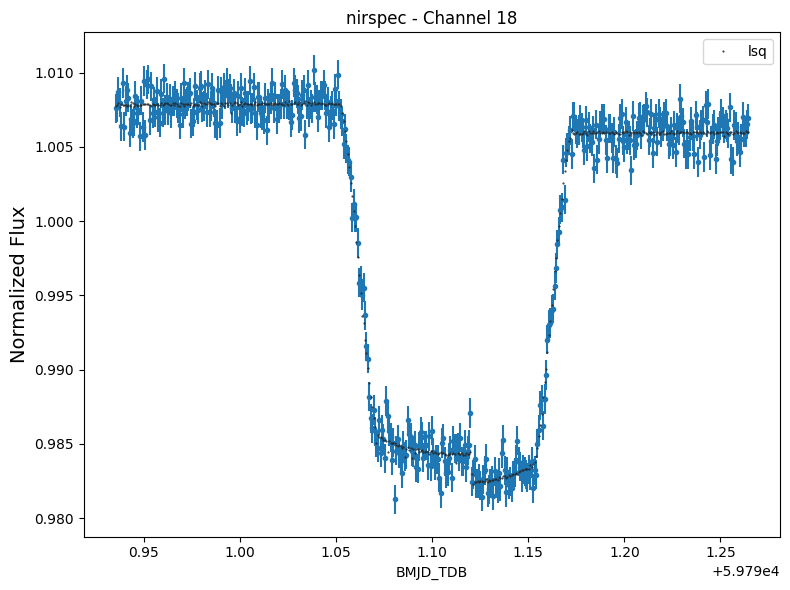

Saving results

Starting Channel 20 of 50

Starting lsq fit.
Starting lnprob: 2419.610249119236

Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2428.210531909196
       x: [ 1.498e-01  3.190e-02  5.503e-12  1.007e+00  2.617e-04
           -4.264e-02 -3.791e-01  1.523e+00]
     nit: 9
   direc: [[ 1.000e+00  0.000e+00 ...  0.000e+00  0.000e+00]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [-9.760e-06  2.970e-04 ... -2.607e-03 -3.358e-05]]
    nfev: 1168

Ending lnprob: 2428.210531909196
Reduced Chi-squared: 1.0161274908523996

LSQ RESULTS:
rp: 0.14978062509417958
u1: 0.031897946497806494
u2: 5.502504184845035e-12
c0: 1.0069788362972778
c1: 0.0002617336162989774
ypos: -0.04264310377168218
ywidth: -0.3791007380223451
scatter_mult: 1.5226011185952937; 1039.660613573167 ppm



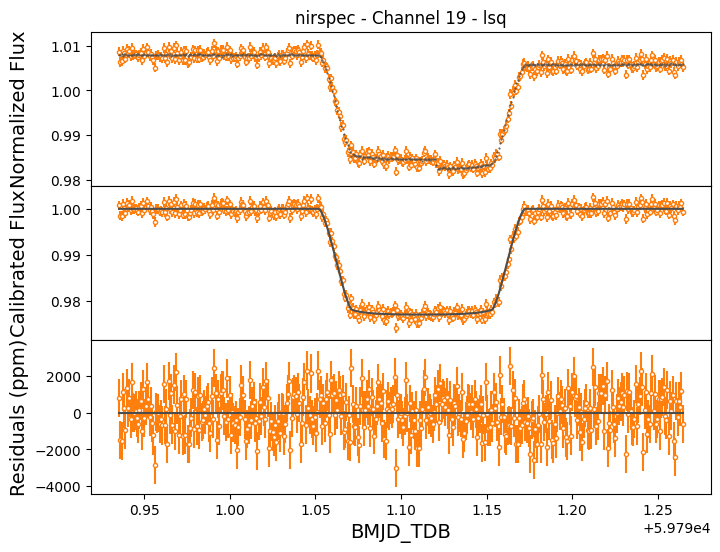

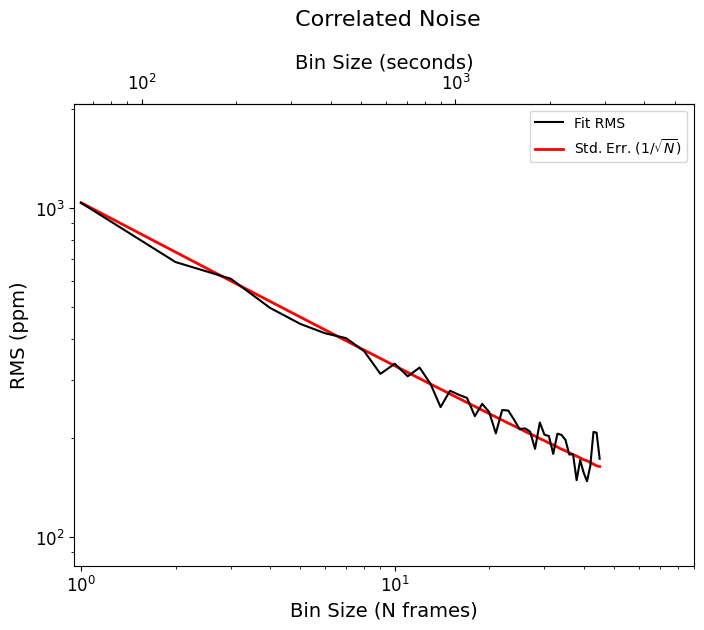

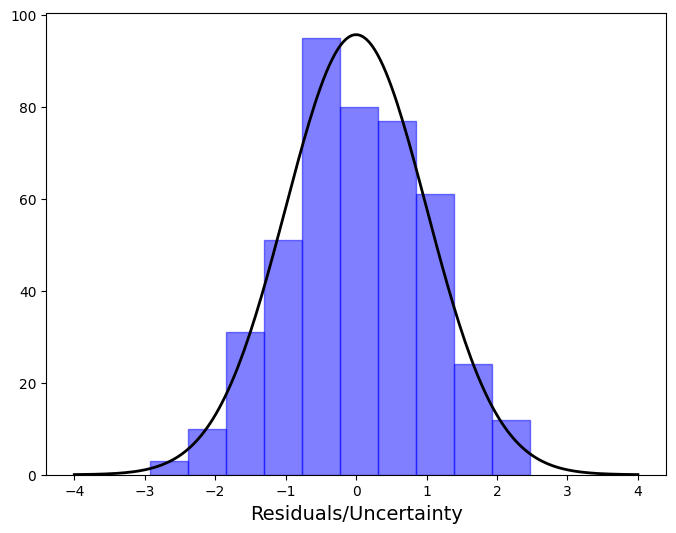

Completed lsq fit.
-------------------------


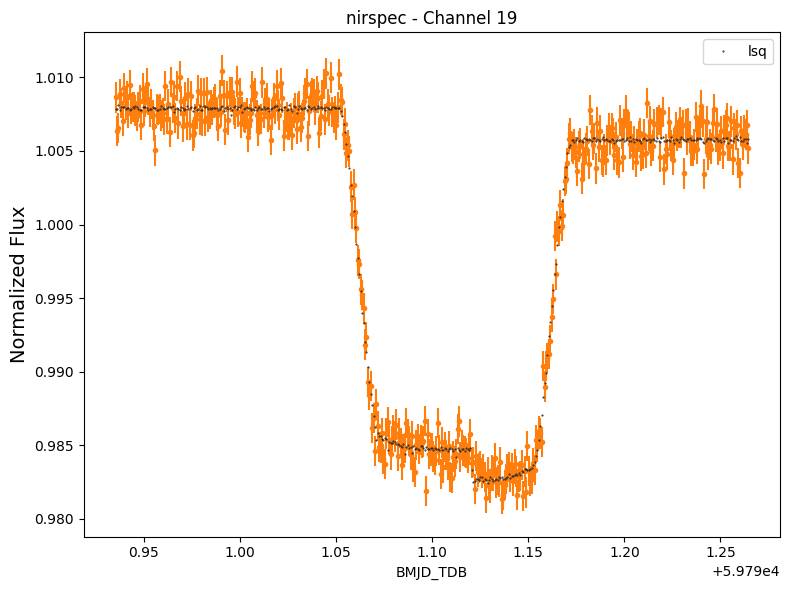

Saving results

Starting Channel 21 of 50

Starting lsq fit.
Starting lnprob: 2396.931495079818

Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2403.8315489768165
       x: [ 1.498e-01  3.681e-02  3.557e-01  1.007e+00  1.297e-03
            1.012e-02 -3.792e-01  1.605e+00]
     nit: 6
   direc: [[-3.274e-05 -2.157e-03 ...  4.596e-04 -1.770e-04]
           [ 0.000e+00  0.000e+00 ...  0.000e+00  1.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 7.844e-05 -3.072e-03 ...  1.009e-03 -1.168e-04]]
    nfev: 593

Ending lnprob: 2403.8315489768165
Reduced Chi-squared: 1.0184965316950718

LSQ RESULTS:
rp: 0.14979024004612107
u1: 0.03680952789232251
u2: 0.35567021369667395
c0: 1.0069683659789506
c1: 0.001296728231650857
ypos: 0.010118355434492568
ywidth: -0.37920294590645015
scatter_mult: 1.604663829542435; 1111.9392769551303 ppm



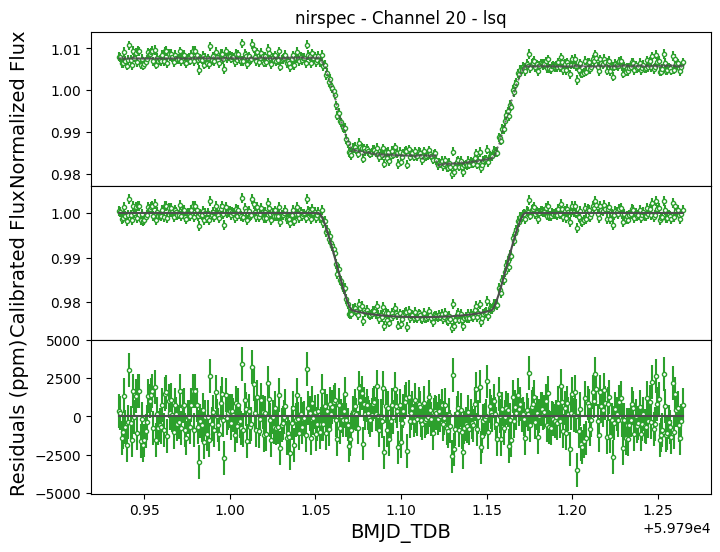

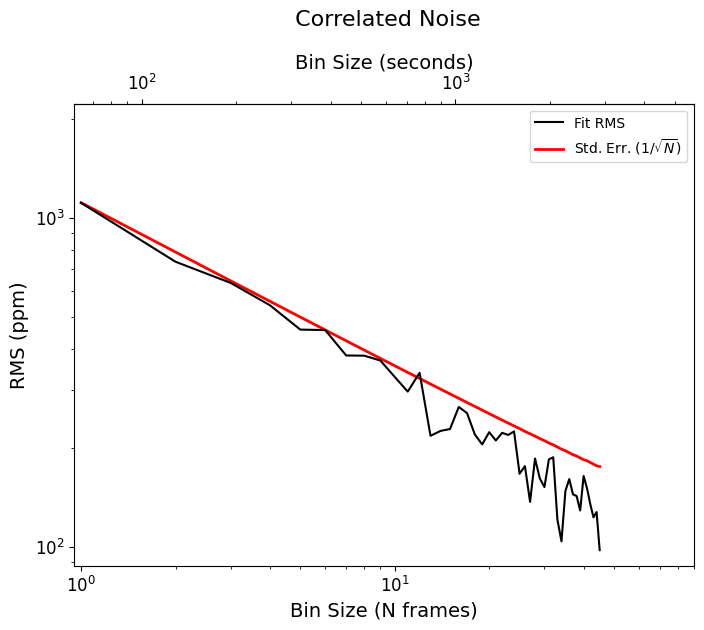

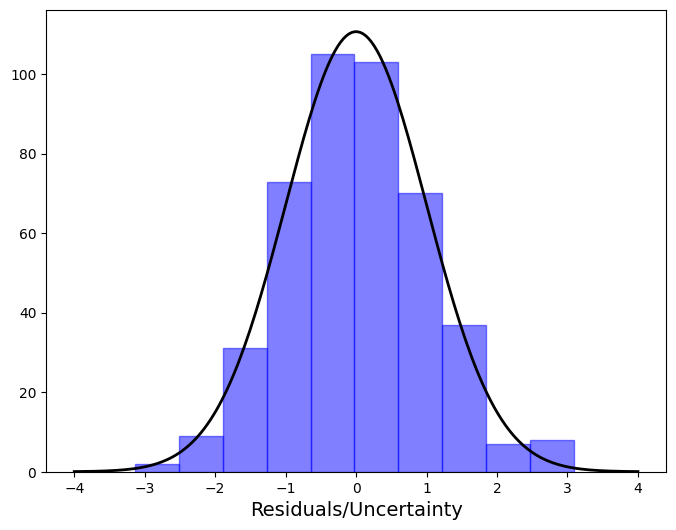

Completed lsq fit.
-------------------------


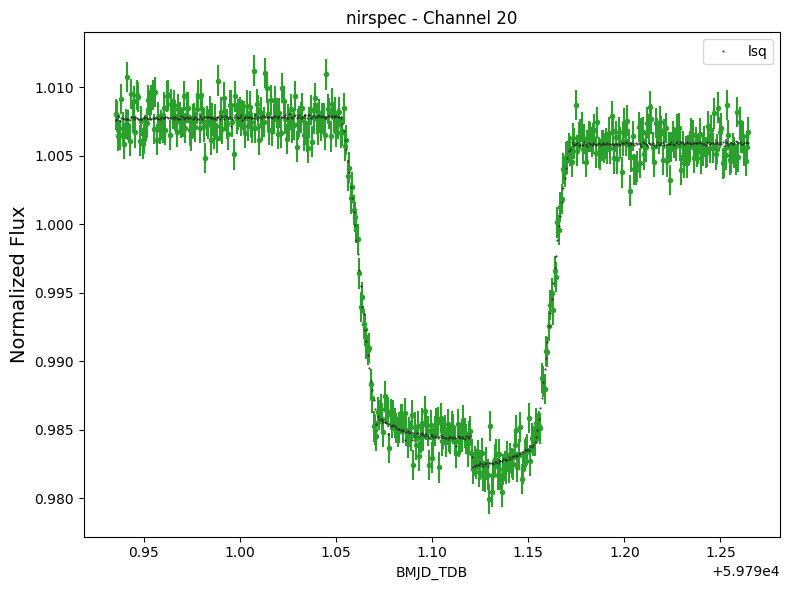

Saving results

Starting Channel 22 of 50

Starting lsq fit.
Starting lnprob: 2440.786514384378
Current lnprob =  2453.1388665463414
Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2453.1786543907288
       x: [ 1.498e-01  1.544e-02  8.522e-01  1.007e+00  7.916e-04
            3.543e-02 -4.142e-01  1.406e+00]
     nit: 5
   direc: [[-3.321e-05 -3.734e-03 ... -1.324e-02 -1.544e-03]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 1.170e-04 -1.790e-03 ... -3.394e-03 -1.075e-04]]
    nfev: 500

Ending lnprob: 2453.1786543907288
Reduced Chi-squared: 1.0183207837361061

LSQ RESULTS:
rp: 0.14978146670149842
u1: 0.015442128811448883
u2: 0.852213221034108
c0: 1.0069482205454012
c1: 0.0007915709642607816
ypos: 0.03543109693364836
ywidth: -0.41419363860783526
scatter_mult: 1.405559372797954; 995.1028396070831 ppm



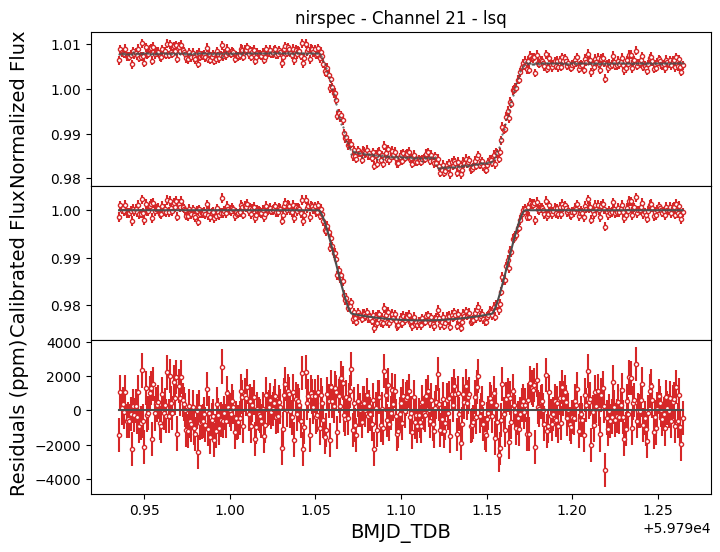

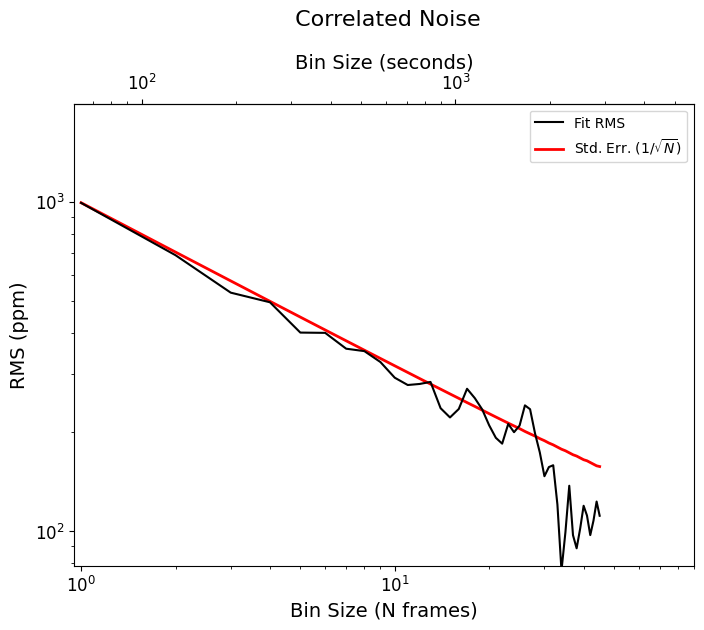

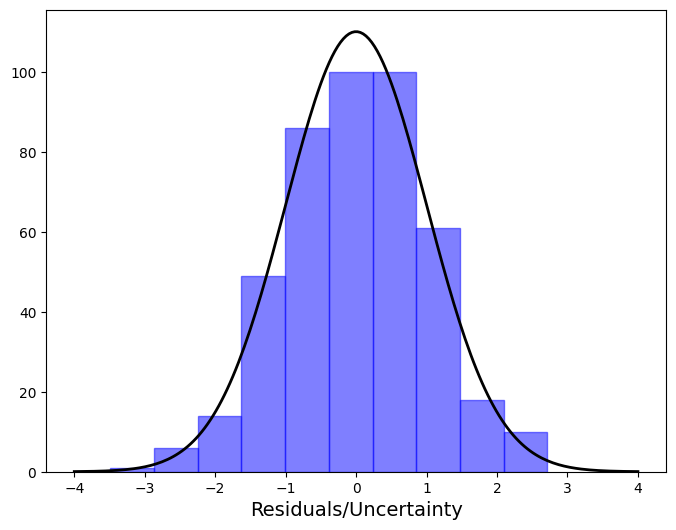

Completed lsq fit.
-------------------------


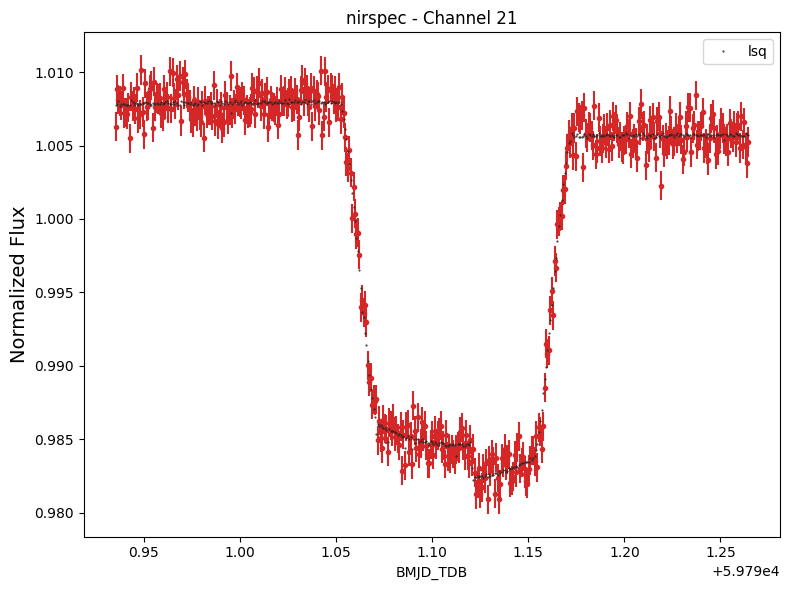

Saving results

Starting Channel 23 of 50

Starting lsq fit.
Starting lnprob: 2387.6650601298793
Current lnprob =  2421.7836695748583
Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2421.7836695748583
       x: [ 1.493e-01  4.820e-02  1.163e-12  1.007e+00  2.264e-03
           -6.506e-02 -3.337e-01  1.491e+00]
     nit: 6
   direc: [[ 2.105e-04  6.041e-03 ...  3.085e-02 -1.119e-02]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [-9.564e-05  1.187e-03 ... -2.368e-05 -2.234e-04]]
    nfev: 936

Ending lnprob: 2421.7836695748583
Reduced Chi-squared: 1.0183831232022578

LSQ RESULTS:
rp: 0.14930106292861509
u1: 0.04820439635629799
u2: 1.1628486988655013e-12
c0: 1.0069324823158667
c1: 0.0022637894301976227
ypos: -0.06506140513503912
ywidth: -0.3336604411471436
scatter_mult: 1.4914458729686557; 1067.577235384581 ppm



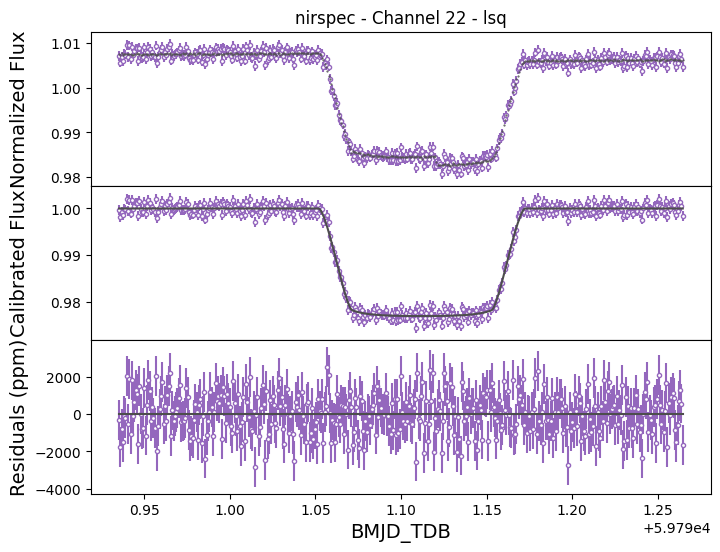

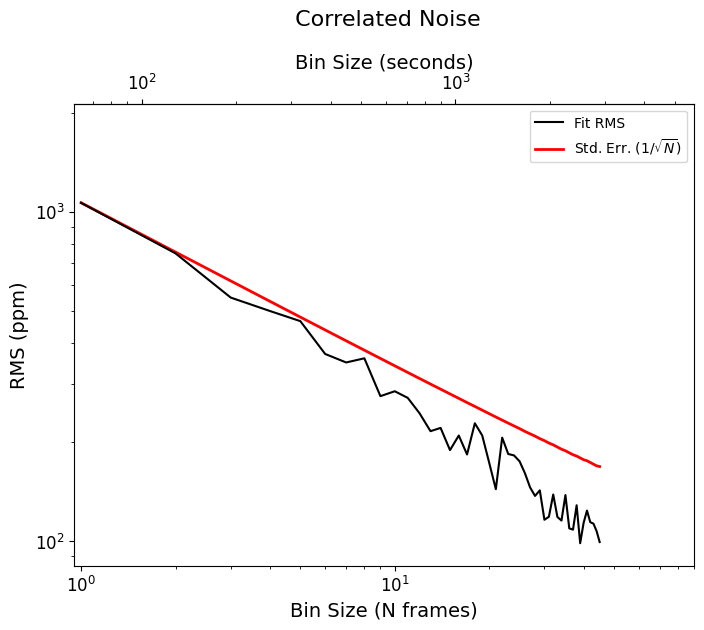

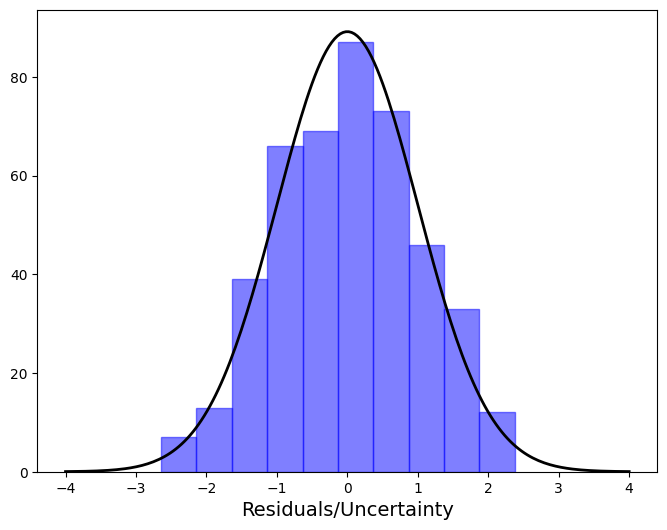

Completed lsq fit.
-------------------------


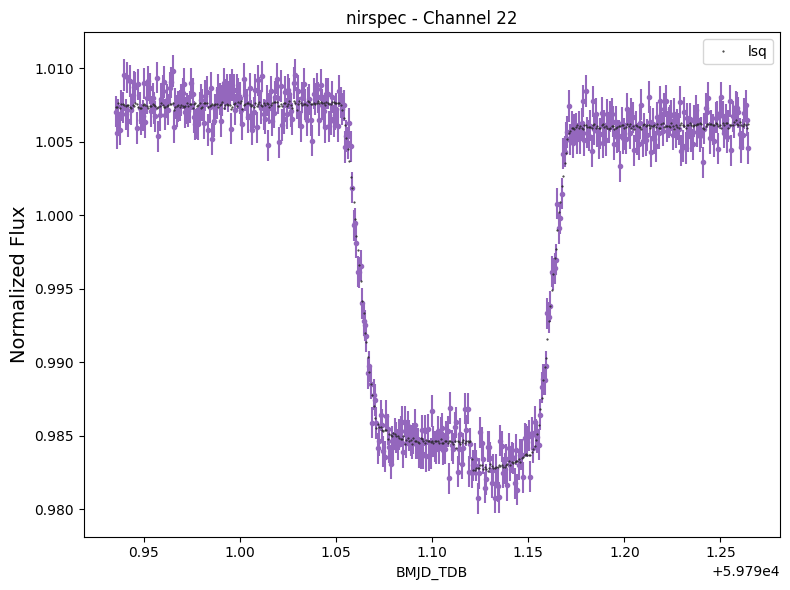

Saving results

Starting Channel 24 of 50

Starting lsq fit.
Starting lnprob: 2391.3135221523908

Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2409.9655348660535
       x: [ 1.489e-01  2.872e-02  1.163e-12  1.007e+00  6.514e-04
           -7.534e-03 -3.830e-01  1.512e+00]
     nit: 5
   direc: [[-9.141e-05 -1.126e-03 ... -1.037e-02 -1.244e-03]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 6.079e-05  9.830e-04 ... -6.421e-03  3.621e-05]]
    nfev: 728

Ending lnprob: 2409.9655348660535
Reduced Chi-squared: 1.0184006284808398

LSQ RESULTS:
rp: 0.1488913821741142
u1: 0.02872046853275194
u2: 1.1628486988655013e-12
c0: 1.0068809328697514
c1: 0.0006513729954285475
ypos: -0.007534272029733038
ywidth: -0.3830482279327117
scatter_mult: 1.5115662630393008; 1096.8393392204002 ppm



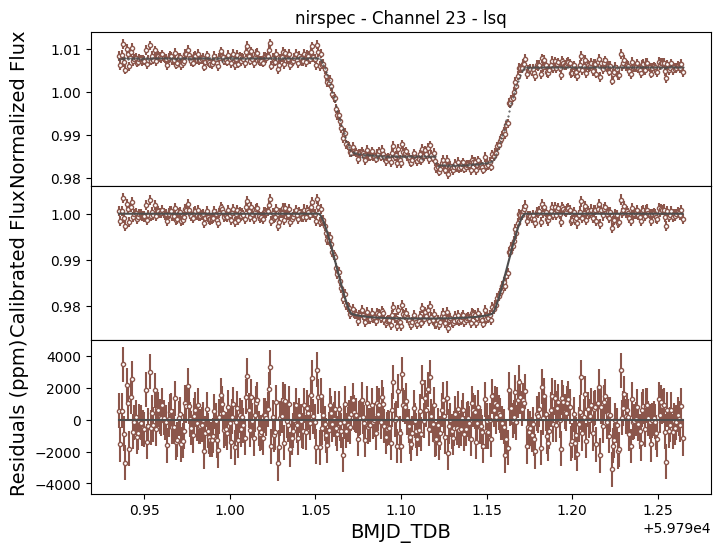

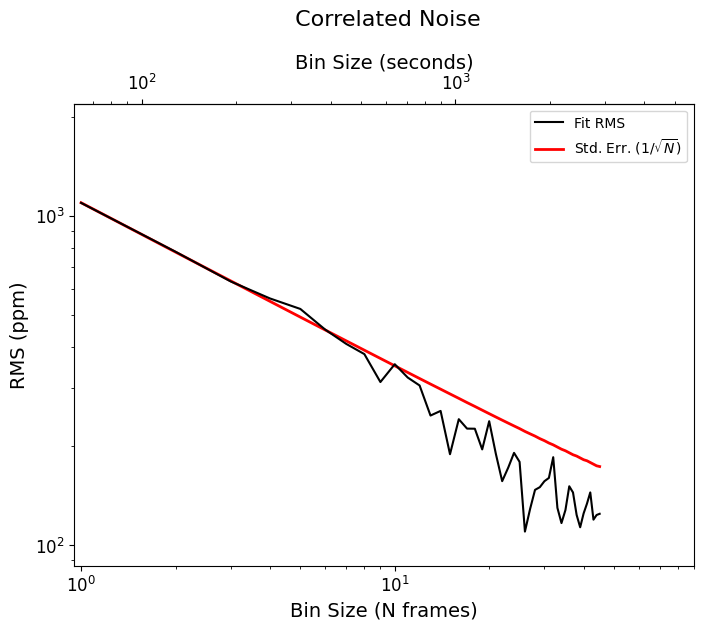

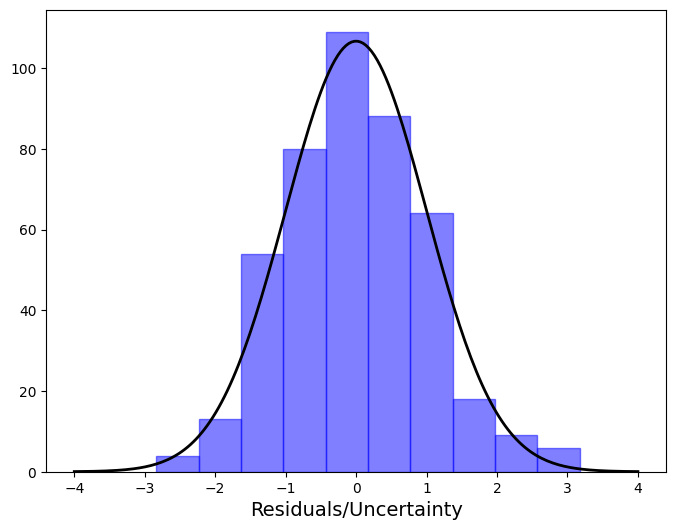

Completed lsq fit.
-------------------------


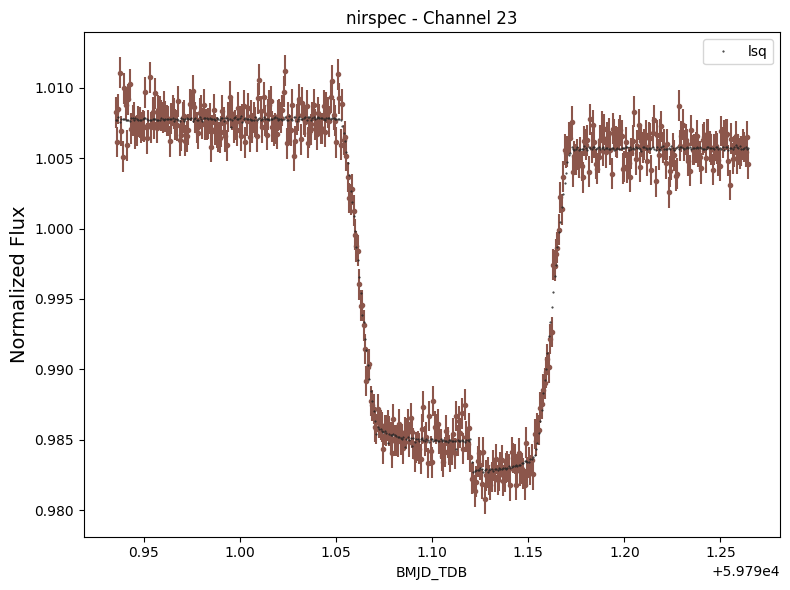

Saving results

Starting Channel 25 of 50

Starting lsq fit.
Starting lnprob: 2393.0338362705006

Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2397.149040610768
       x: [ 1.483e-01  3.837e-02  1.163e-12  1.007e+00  1.101e-03
           -6.353e-02 -4.254e-01  1.551e+00]
     nit: 5
   direc: [[-2.020e-04  2.625e-03 ... -1.077e-02 -1.695e-03]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 1.013e-04 -1.334e-04 ... -9.295e-03 -1.243e-05]]
    nfev: 735

Ending lnprob: 2397.149040610768
Reduced Chi-squared: 1.0184417459471657

LSQ RESULTS:
rp: 0.14829505281457434
u1: 0.03836921499395101
u2: 1.1628486988655013e-12
c0: 1.0068327463051923
c1: 0.0011014686433219736
ypos: -0.06353289628611411
ywidth: -0.4254168929417641
scatter_mult: 1.5509427162178326; 1128.2674235338327 ppm



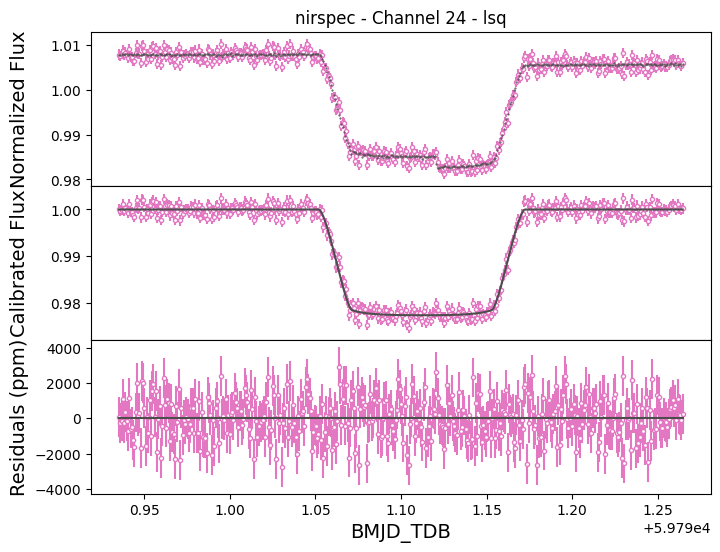

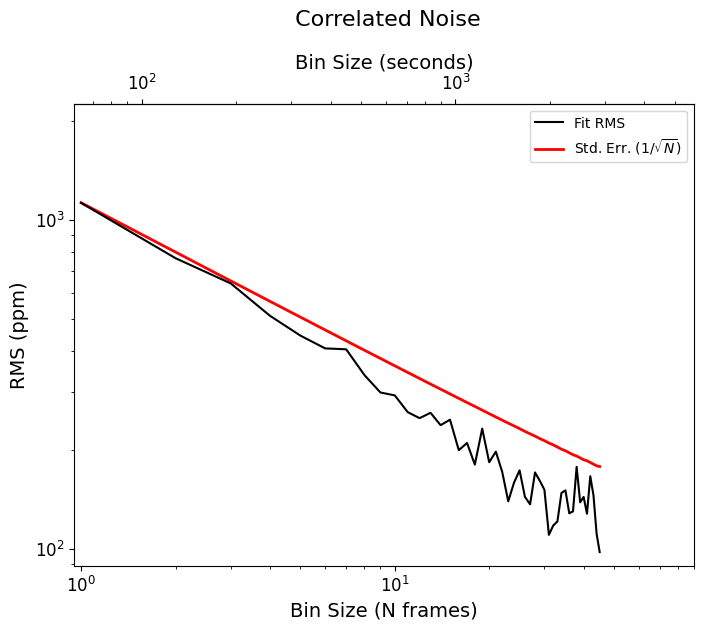

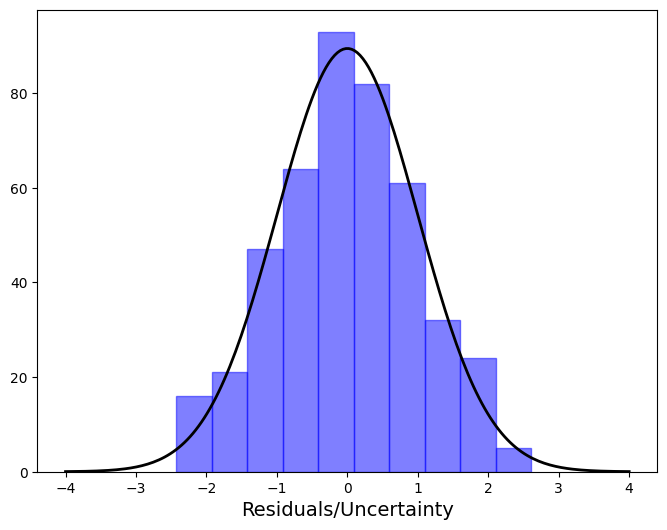

Completed lsq fit.
-------------------------


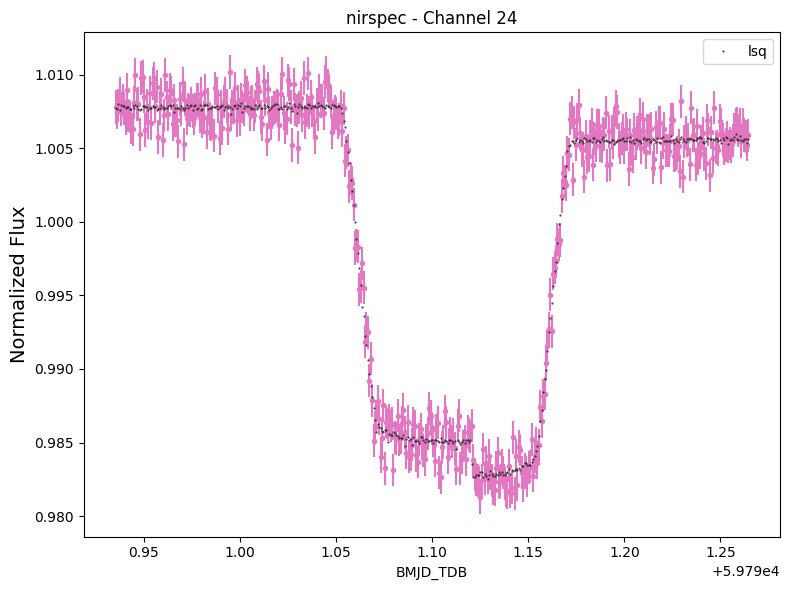

Saving results

Starting Channel 26 of 50

Starting lsq fit.
Starting lnprob: 2377.1821823902055
Current lnprob =  2387.7366599971515
Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2387.7366599971515
       x: [ 1.479e-01  1.111e-02  1.000e+00  1.007e+00  7.765e-04
            2.066e-02 -3.639e-01  1.542e+00]
     nit: 9
   direc: [[ 1.000e+00  0.000e+00 ...  0.000e+00  0.000e+00]
           [ 0.000e+00  0.000e+00 ...  0.000e+00  1.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 8.723e-07 -3.810e-04 ... -5.955e-04 -9.913e-05]]
    nfev: 1339

Ending lnprob: 2387.7366599971515
Reduced Chi-squared: 1.0184302706979507

LSQ RESULTS:
rp: 0.1479394500483852
u1: 0.011114919822398065
u2: 1.0
c0: 1.0067726609470249
c1: 0.0007765344492446271
ypos: 0.0206613780140399
ywidth: -0.3639405534710537
scatter_mult: 1.5416472450659289; 1152.9237996179636 ppm



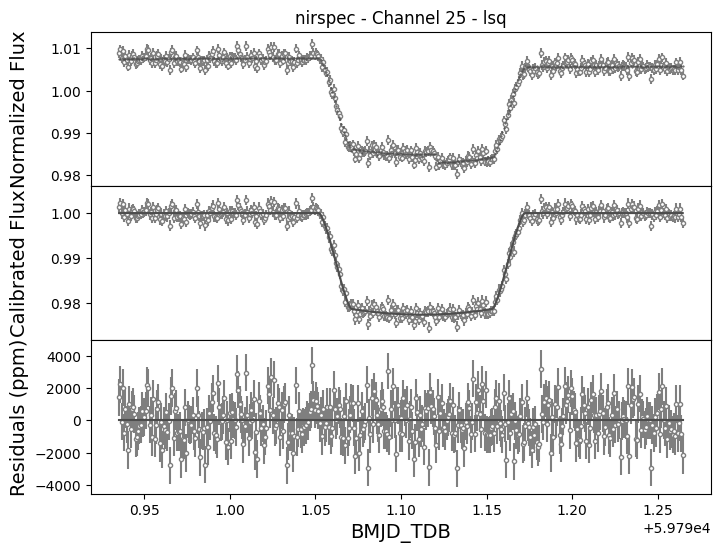

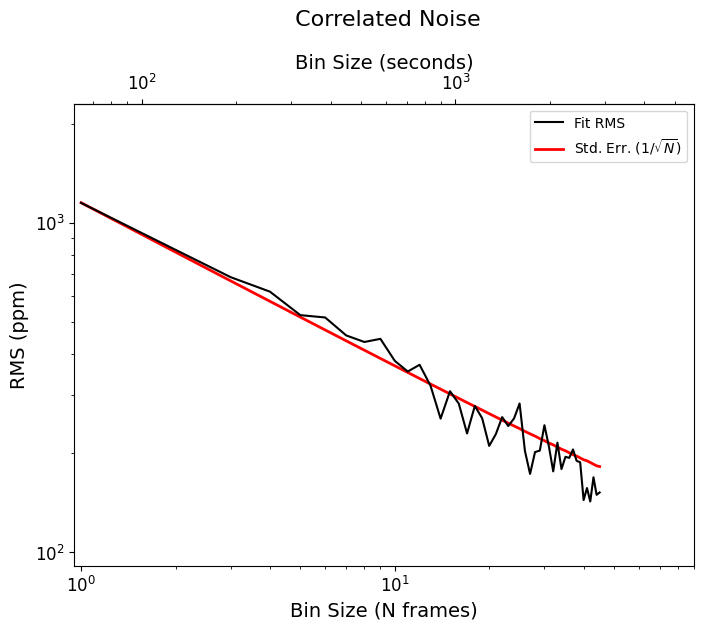

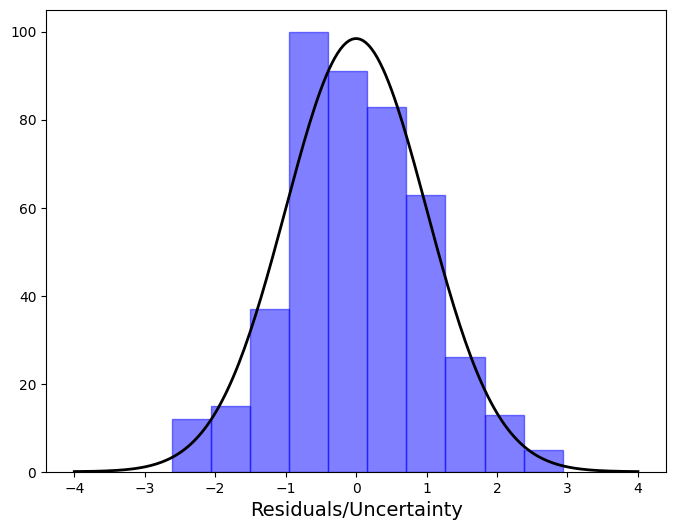

Completed lsq fit.
-------------------------


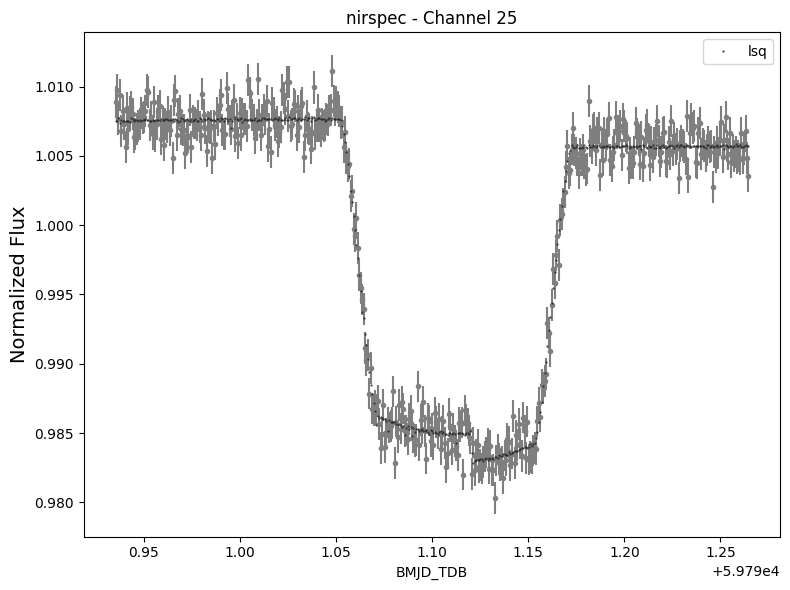

Saving results

Starting Channel 27 of 50

Starting lsq fit.
Starting lnprob: 2363.7184763982623

Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2369.878788282596
       x: [ 1.470e-01  3.004e-02  8.408e-14  1.007e+00 -2.443e-03
            5.329e-02 -2.702e-01  1.578e+00]
     nit: 5
   direc: [[-2.740e-04  6.205e-03 ...  5.361e-02 -1.240e-02]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [-1.252e-04  1.745e-03 ... -1.119e-04 -3.732e-04]]
    nfev: 743

Ending lnprob: 2369.878788282596
Reduced Chi-squared: 1.0184706046930194

LSQ RESULTS:
rp: 0.14702830956972046
u1: 0.030035171312970194
u2: 8.407618812409889e-14
c0: 1.006709420022632
c1: -0.0024427761540976633
ypos: 0.05329338892149197
ywidth: -0.2702147788493252
scatter_mult: 1.5784848622583438; 1199.7432755461737 ppm



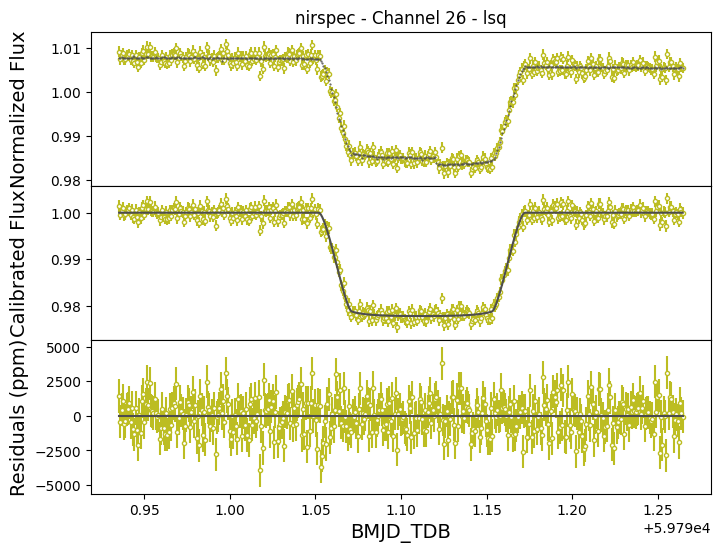

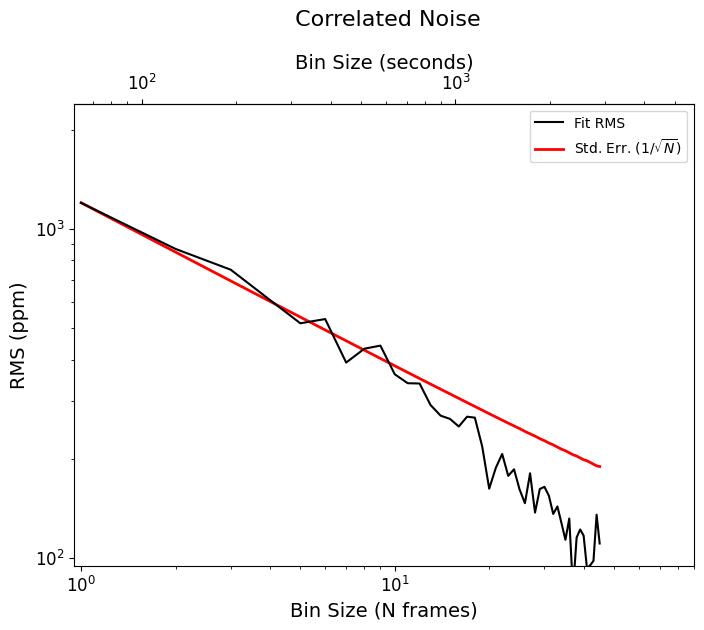

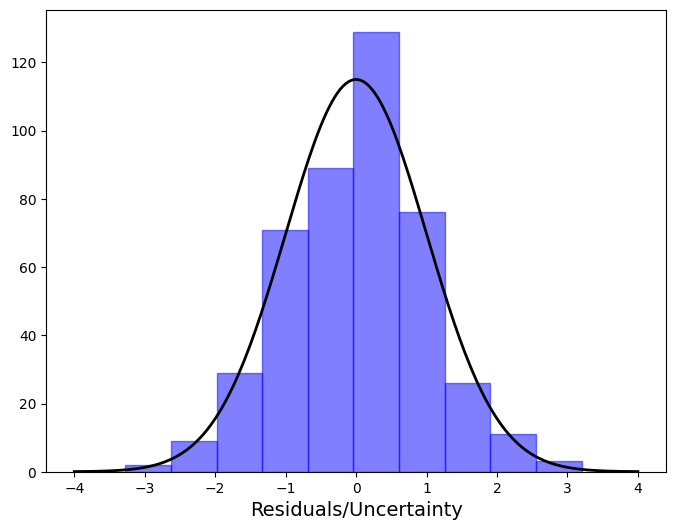

Completed lsq fit.
-------------------------


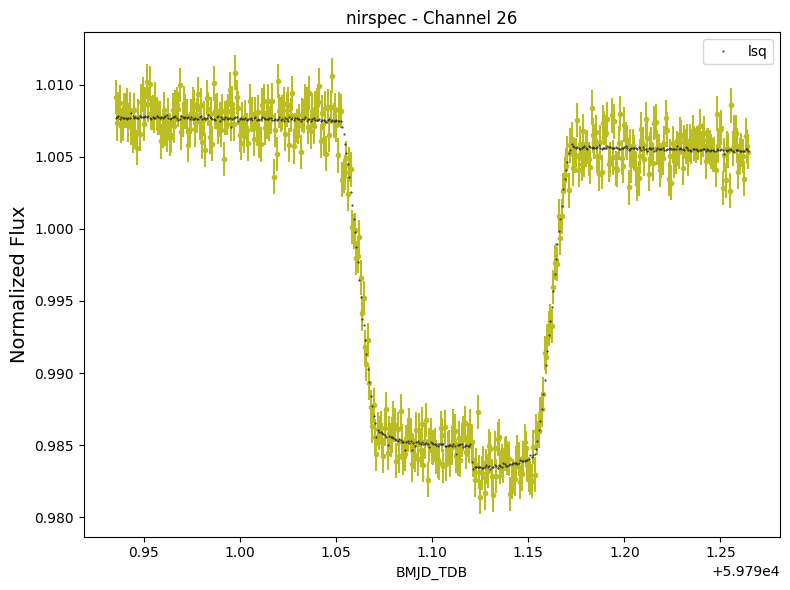

Saving results

Starting Channel 28 of 50

Starting lsq fit.
Starting lnprob: 2357.2682445821515
Current lnprob =  2367.594144674384
Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2367.594144674384
       x: [ 1.479e-01  4.981e-02  3.052e-01  1.007e+00  1.820e-03
            3.509e-04 -3.916e-01  1.519e+00]
     nit: 6
   direc: [[-8.493e-05  7.210e-04 ... -6.086e-02 -1.280e-02]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 1.861e-04 -6.235e-03 ... -4.394e-03  1.424e-03]]
    nfev: 614

Ending lnprob: 2367.594144674384
Reduced Chi-squared: 1.0184285603064944

LSQ RESULTS:
rp: 0.1478671458410417
u1: 0.049806252488659386
u2: 0.3052148238325816
c0: 1.0067983883003562
c1: 0.001819784459316602
ypos: 0.00035087716088769437
ywidth: -0.39155528238687626
scatter_mult: 1.5192775033968047; 1206.3896885282006 ppm



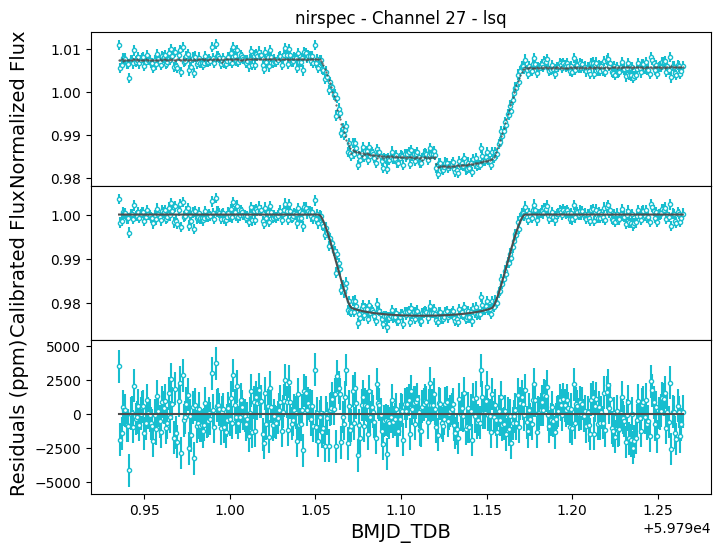

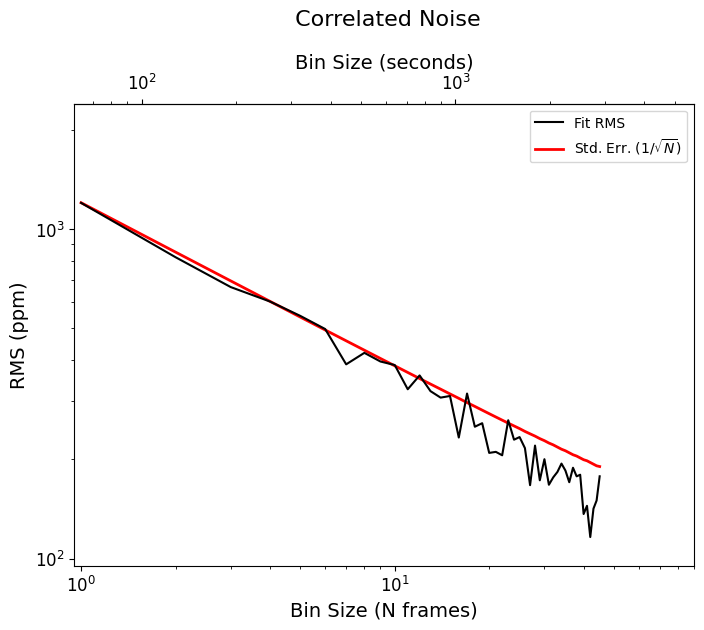

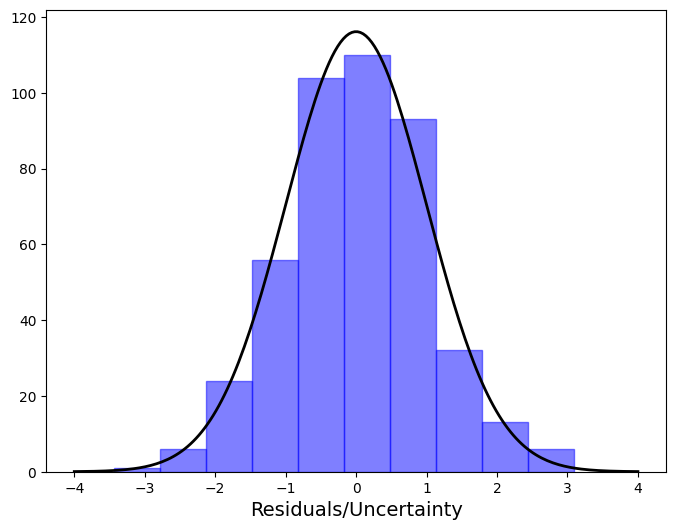

Completed lsq fit.
-------------------------


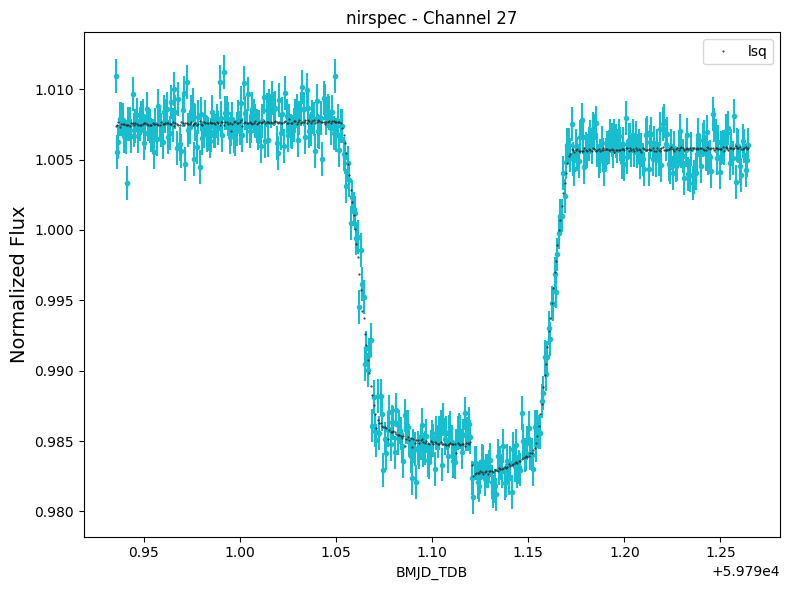

Saving results

Starting Channel 29 of 50

Starting lsq fit.
Starting lnprob: 2126.774283801398

Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2304.587718387188
       x: [ 1.413e-01  5.171e-03  1.000e+00  1.006e+00 -1.434e-03
           -4.377e-02 -3.633e-01  1.578e+00]
     nit: 7
   direc: [[ 0.000e+00  0.000e+00 ...  0.000e+00  1.000e+00]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 1.295e-05 -3.907e-04 ...  9.628e-03 -4.691e-04]]
    nfev: 1019

Ending lnprob: 2304.587718387188
Reduced Chi-squared: 0.9932962554474292

LSQ RESULTS:
rp: 0.14131838684051967
u1: 0.005170692235409601
u2: 0.9999999999990302
c0: 1.0058156548573622
c1: -0.001434074544314715
ypos: -0.043774807888321346
ywidth: -0.36333573302546135
scatter_mult: 1.5776226909853421; 1218.4531762225138 ppm



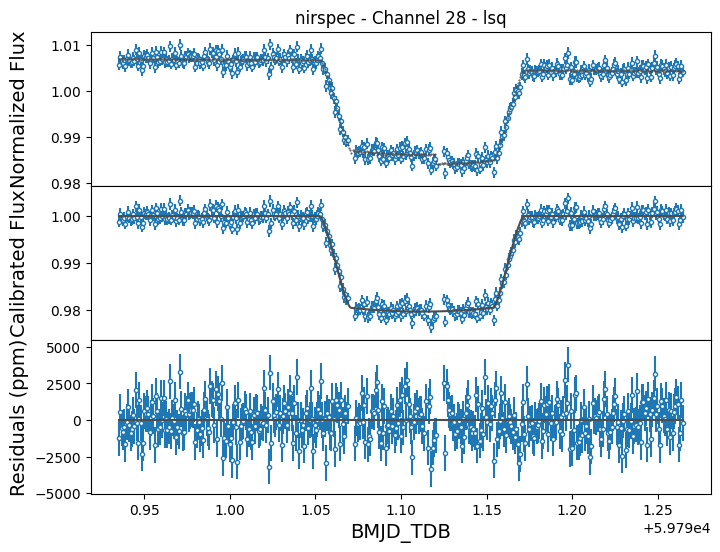

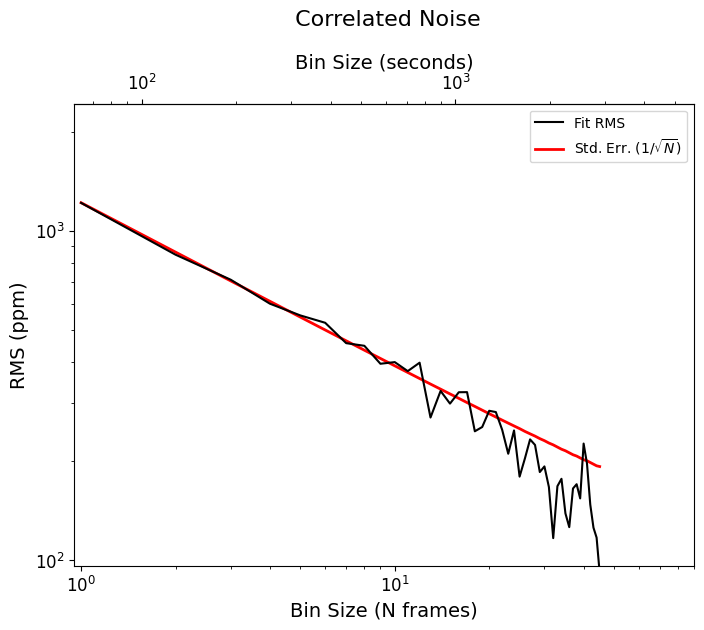

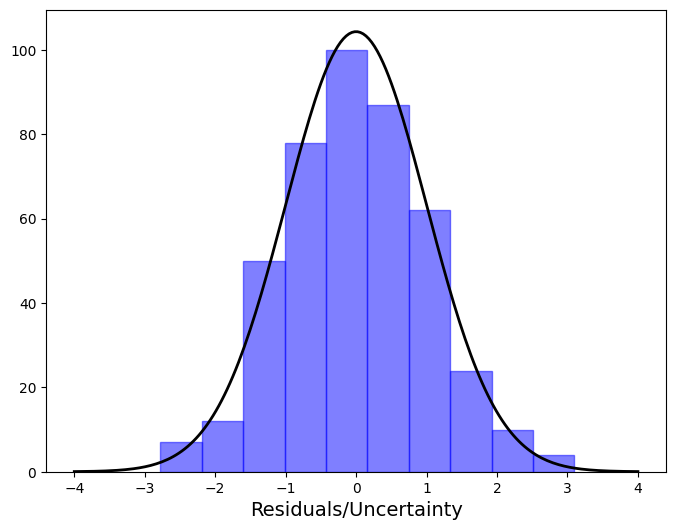

Completed lsq fit.
-------------------------


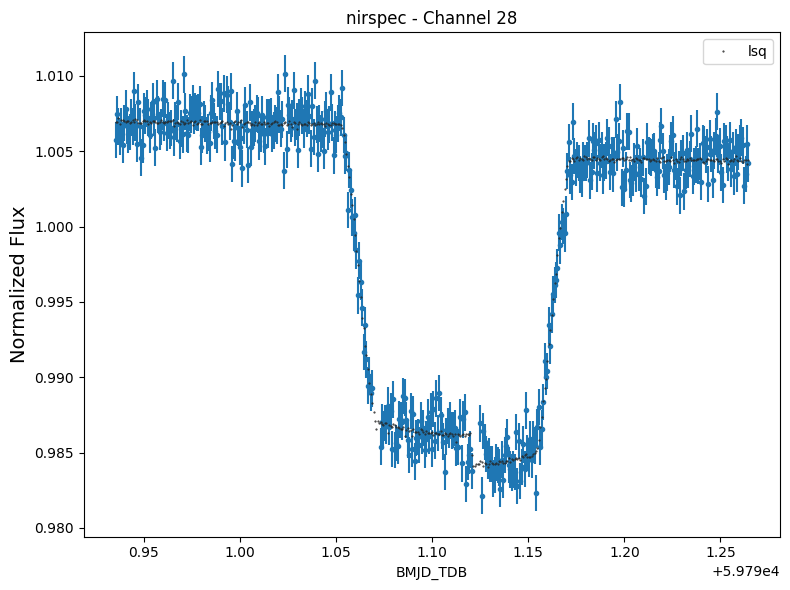

Saving results

Starting Channel 30 of 50

Starting lsq fit.
Starting lnprob: 2264.9193120614045
Current lnprob =  2351.9795878556474
Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2351.9795878556474
       x: [ 1.463e-01  1.712e-02  6.323e-01  1.007e+00 -3.336e-04
           -3.642e-02 -3.653e-01  1.597e+00]
     nit: 6
   direc: [[ 1.000e+00  0.000e+00 ...  0.000e+00  0.000e+00]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 2.808e-05  8.636e-04 ... -7.645e-03 -8.151e-04]]
    nfev: 616

Ending lnprob: 2351.9795878556474
Reduced Chi-squared: 1.0185466452223582

LSQ RESULTS:
rp: 0.14625411766994972
u1: 0.01711857082769862
u2: 0.6322735099646861
c0: 1.0066256632513784
c1: -0.0003336216605479736
ypos: -0.036418943981214404
ywidth: -0.36529895297906373
scatter_mult: 1.597491889886313; 1249.2071787362543 ppm



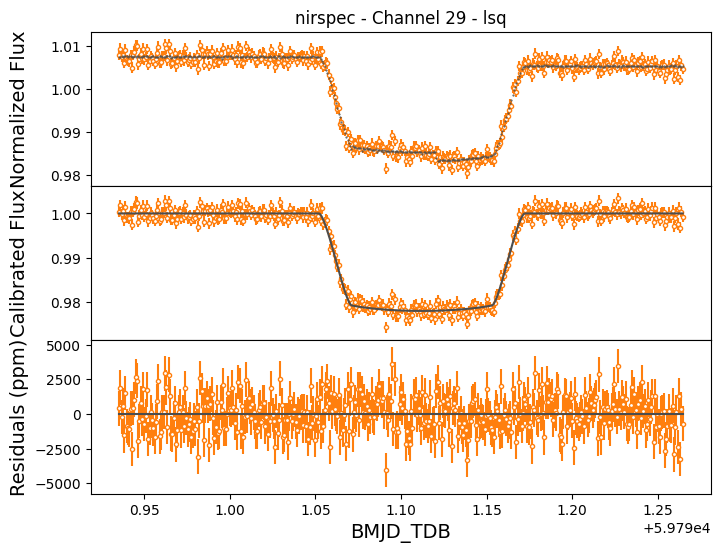

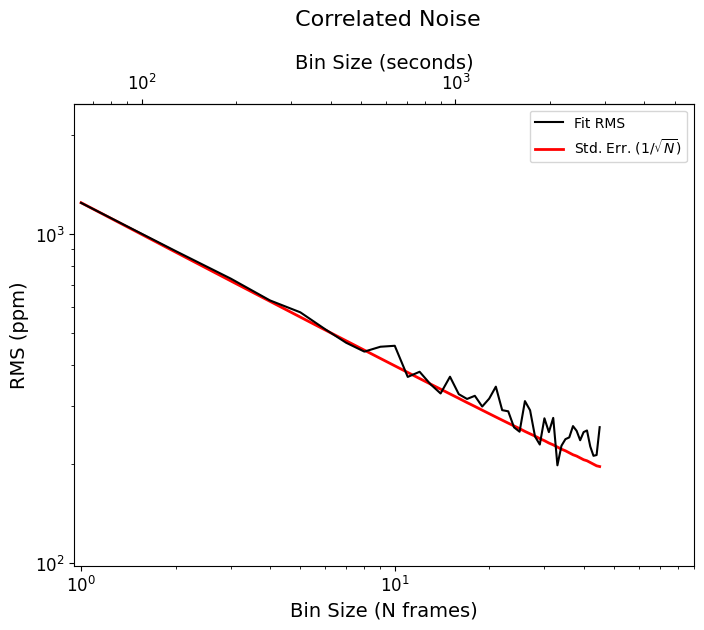

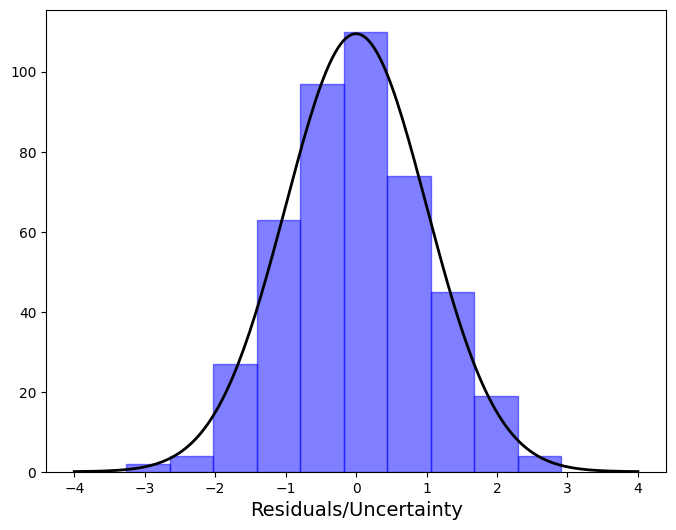

Completed lsq fit.
-------------------------


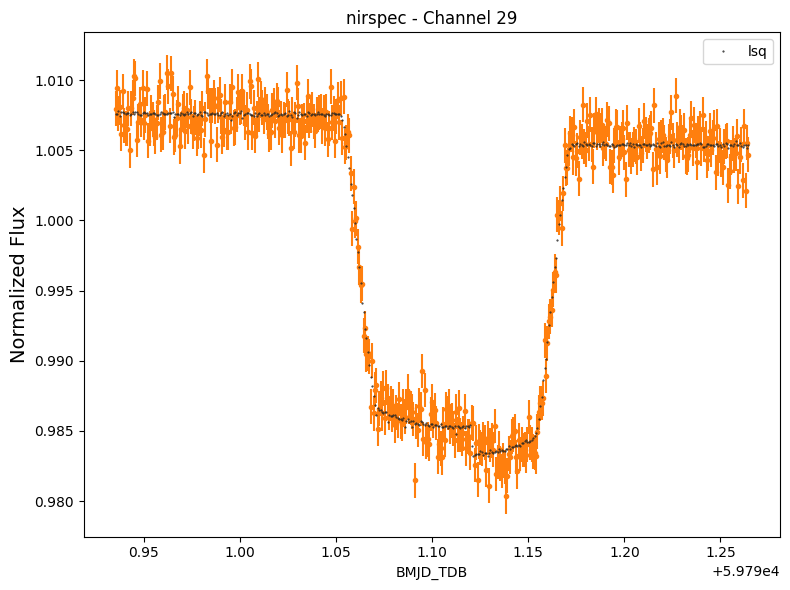

Saving results

Starting Channel 31 of 50

Starting lsq fit.
Starting lnprob: 2380.7133947075986
Current lnprob =  2389.7093005029733
Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2389.7093005029733
       x: [ 1.467e-01  2.327e-02  4.372e-01  1.007e+00 -2.766e-03
           -6.170e-03 -3.166e-01  1.431e+00]
     nit: 6
   direc: [[ 1.072e-04 -4.325e-05 ...  1.878e-02 -1.809e-03]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [-1.065e-04  1.296e-03 ...  4.498e-03  1.531e-04]]
    nfev: 677

Ending lnprob: 2389.7093005029733
Reduced Chi-squared: 1.0183273010228246

LSQ RESULTS:
rp: 0.14671188476772107
u1: 0.023269615224765325
u2: 0.4371999770110226
c0: 1.006673335327739
c1: -0.0027659214771812548
ypos: -0.006170011741824042
ywidth: -0.3166188799972721
scatter_mult: 1.4305872808870814; 1147.8888448438108 ppm



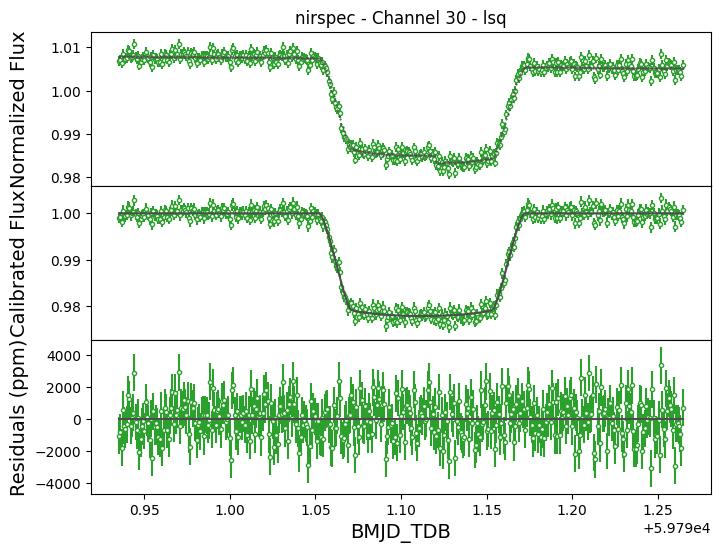

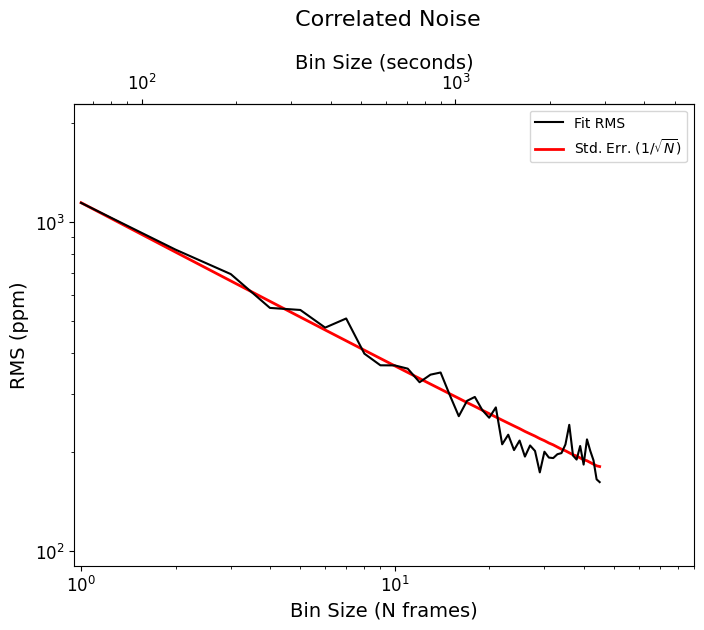

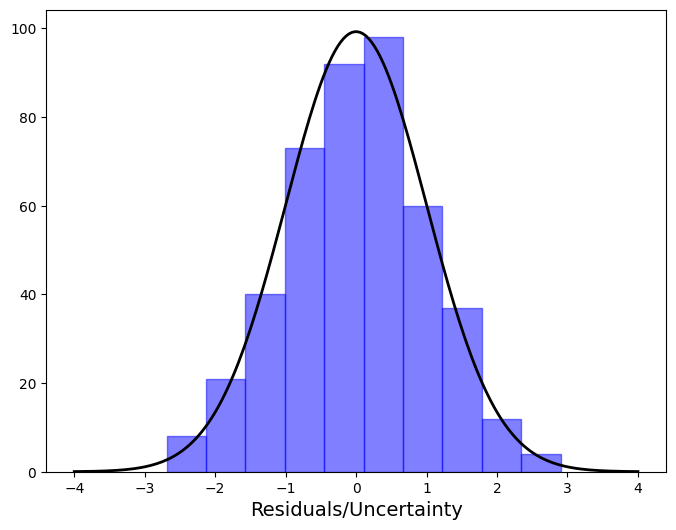

Completed lsq fit.
-------------------------


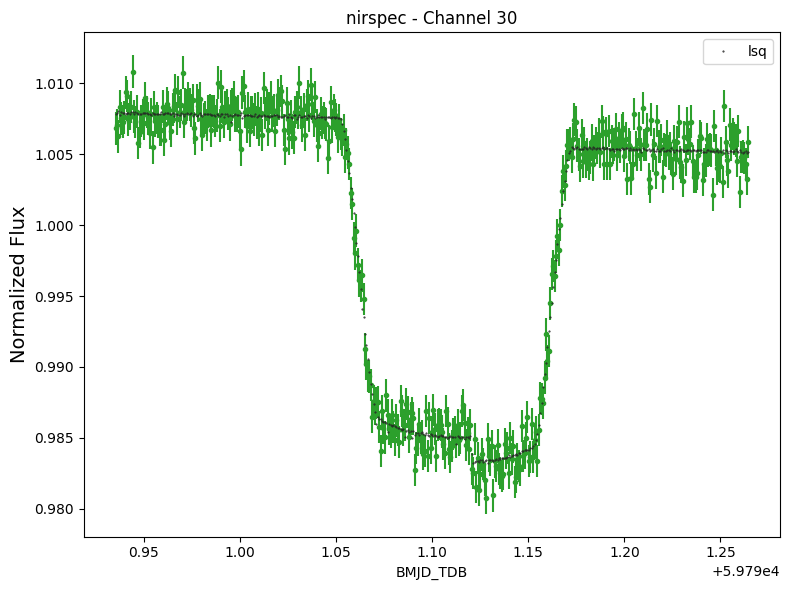

Saving results

Starting Channel 32 of 50

Starting lsq fit.
Starting lnprob: 2303.7686098159957

Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2328.4241214198646
       x: [ 1.468e-01  1.692e-02  1.852e-12  1.007e+00  2.246e-04
           -3.483e-02 -3.065e-01  1.597e+00]
     nit: 4
   direc: [[ 1.000e+00  0.000e+00 ...  0.000e+00  0.000e+00]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 0.000e+00  0.000e+00 ...  0.000e+00  1.000e+00]]
    nfev: 525

Ending lnprob: 2328.4241214198646
Reduced Chi-squared: 1.0184863526285273

LSQ RESULTS:
rp: 0.14678036213719398
u1: 0.016922358818306657
u2: 1.8516742767356737e-12
c0: 1.0066760877955714
c1: 0.00022458154677417277
ypos: -0.034830257103069036
ywidth: -0.3065295409373693
scatter_mult: 1.5967224847600272; 1317.188085151713 ppm



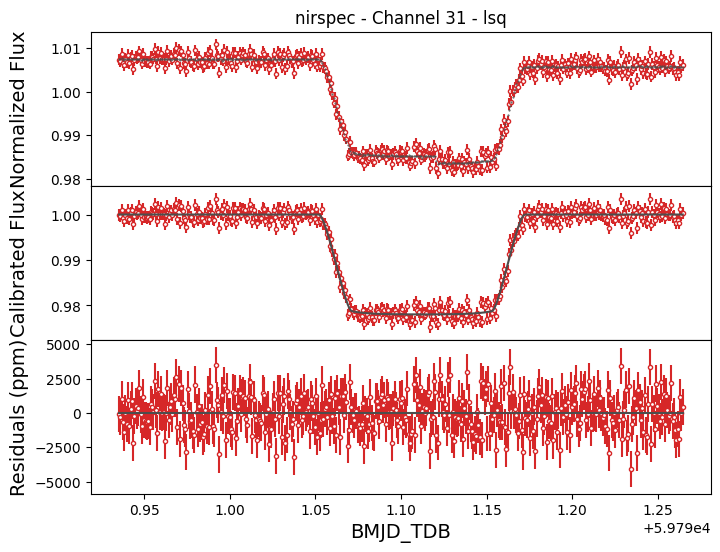

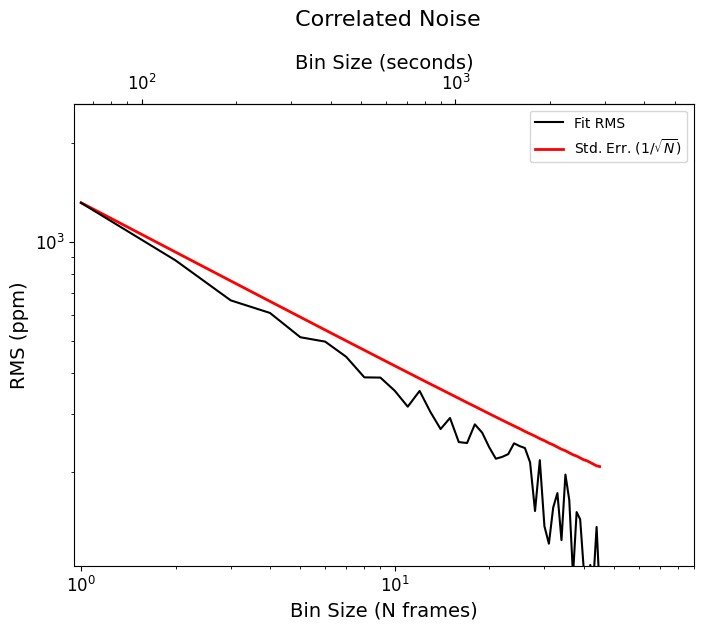

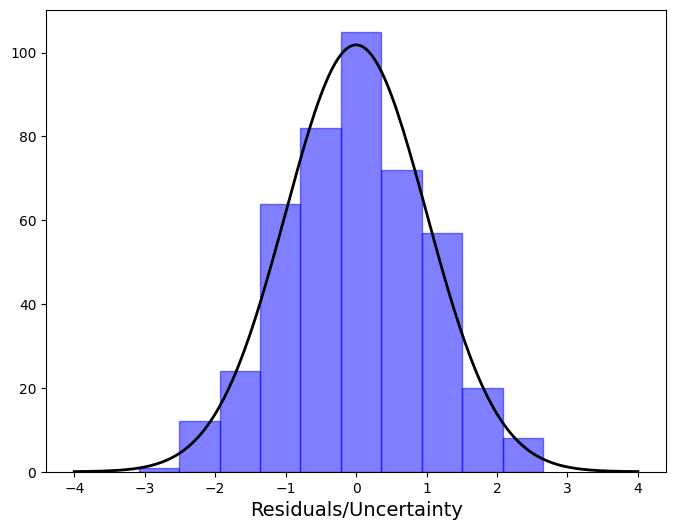

Completed lsq fit.
-------------------------


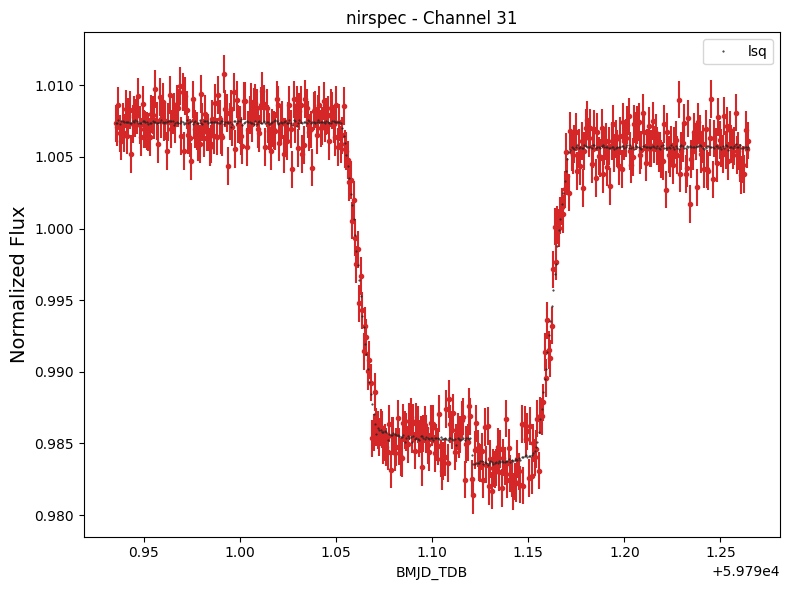

Saving results

Starting Channel 33 of 50

Starting lsq fit.
Starting lnprob: 2339.3625891236793

Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2349.771256979738
       x: [ 1.466e-01  3.899e-02  6.692e-02  1.007e+00 -1.569e-03
           -3.868e-02 -3.373e-01  1.526e+00]
     nit: 6
   direc: [[ 0.000e+00  0.000e+00 ...  0.000e+00  1.000e+00]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 2.179e-05  1.532e-03 ... -5.633e-03 -1.438e-04]]
    nfev: 624

Ending lnprob: 2349.771256979738
Reduced Chi-squared: 1.0183870316159744

LSQ RESULTS:
rp: 0.14659816246090934
u1: 0.038991409615835866
u2: 0.06692059672752425
c0: 1.0066759932852694
c1: -0.0015686179438264007
ypos: -0.03868279945206748
ywidth: -0.3372546721713563
scatter_mult: 1.5261792876277425; 1255.3811181792746 ppm



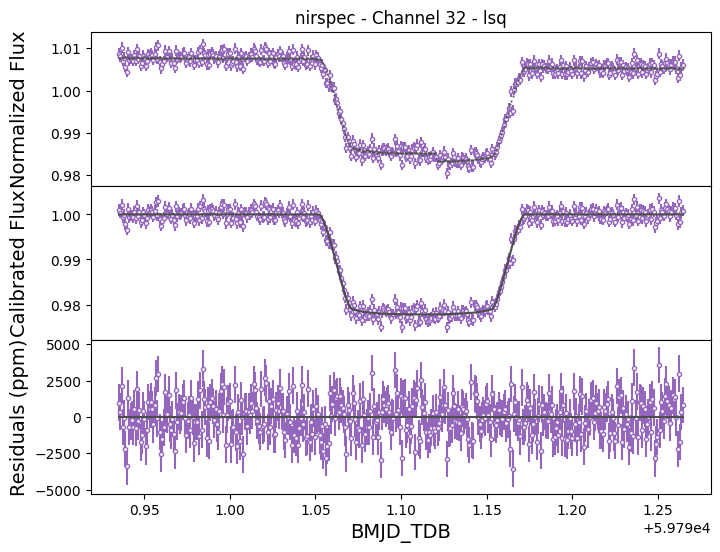

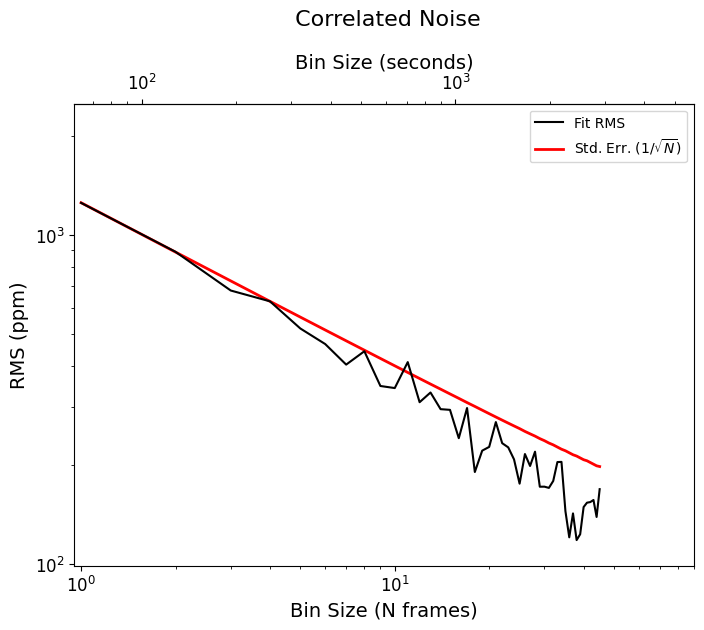

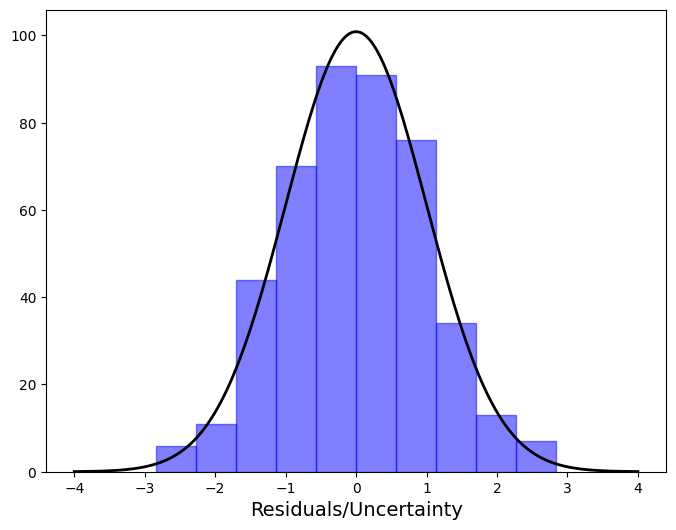

Completed lsq fit.
-------------------------


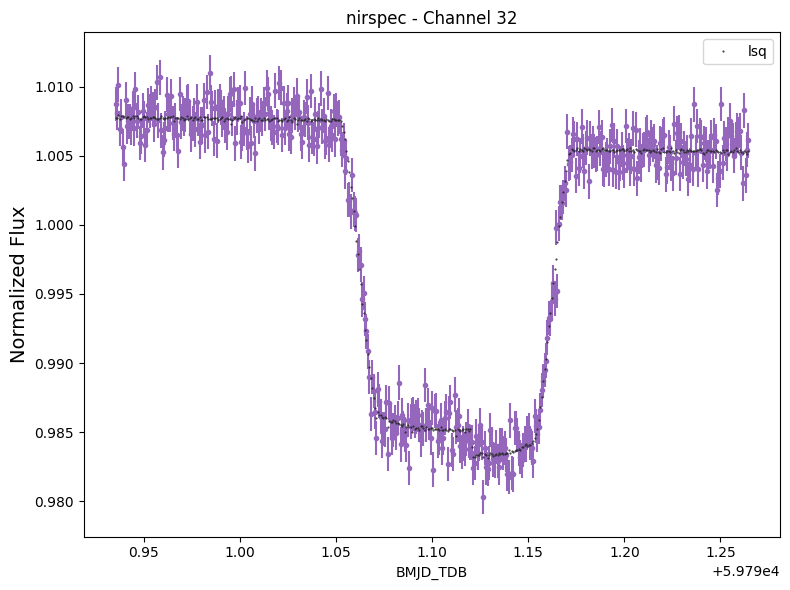

Saving results

Starting Channel 34 of 50

Starting lsq fit.
Starting lnprob: 2370.1326268368043
Current lnprob =  2374.4294081569064
Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2374.4294081569064
       x: [ 1.471e-01  1.198e-02  8.769e-01  1.007e+00 -4.534e-04
           -7.513e-02 -3.358e-01  1.441e+00]
     nit: 6
   direc: [[ 1.000e+00  0.000e+00 ...  0.000e+00  0.000e+00]
           [ 0.000e+00  0.000e+00 ...  0.000e+00  1.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 7.360e-05 -1.582e-03 ... -1.379e-03 -1.304e-04]]
    nfev: 587

Ending lnprob: 2374.4294081569064
Reduced Chi-squared: 1.018339893936063

LSQ RESULTS:
rp: 0.14709128632333748
u1: 0.01197848981319588
u2: 0.8768830481271417
c0: 1.006696240578323
c1: -0.00045338933725089735
ypos: -0.07513267769778897
ywidth: -0.33581002932220855
scatter_mult: 1.4410987551154846; 1187.237531557615 ppm



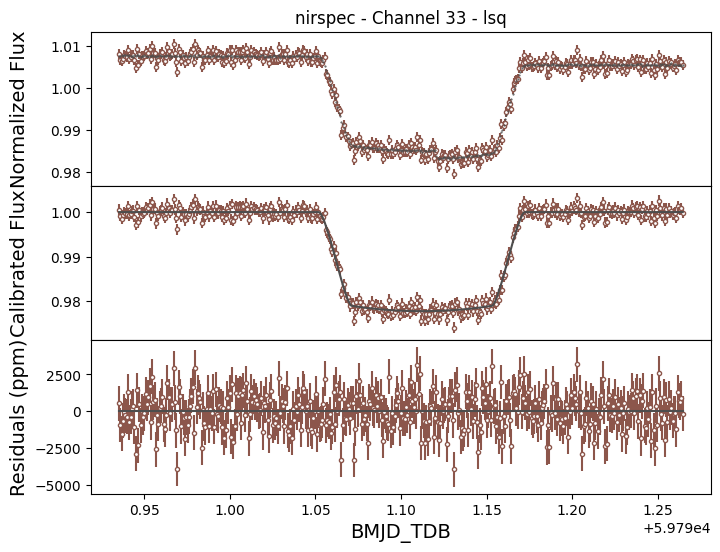

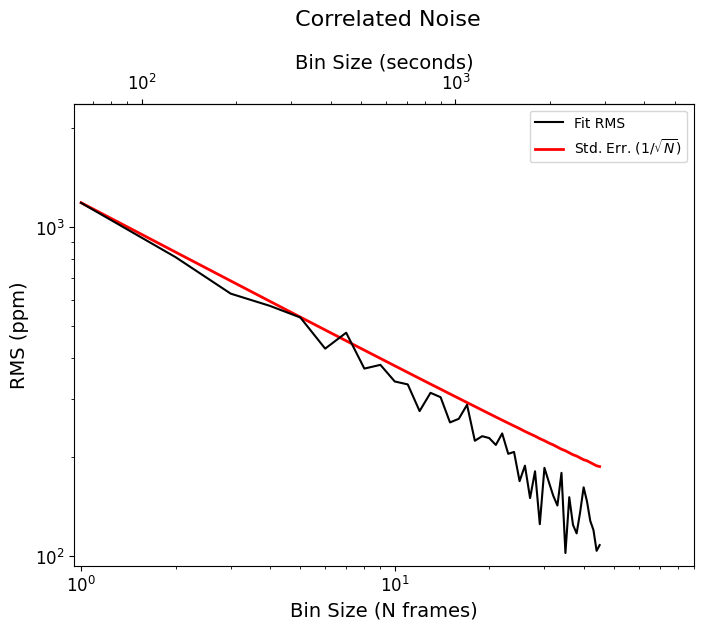

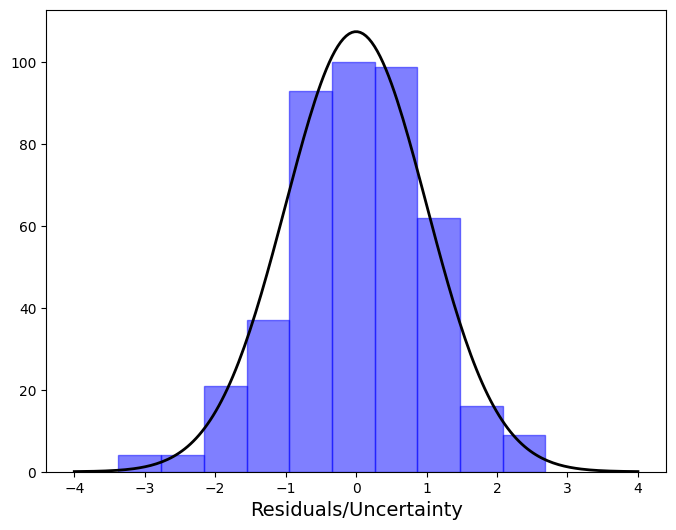

Completed lsq fit.
-------------------------


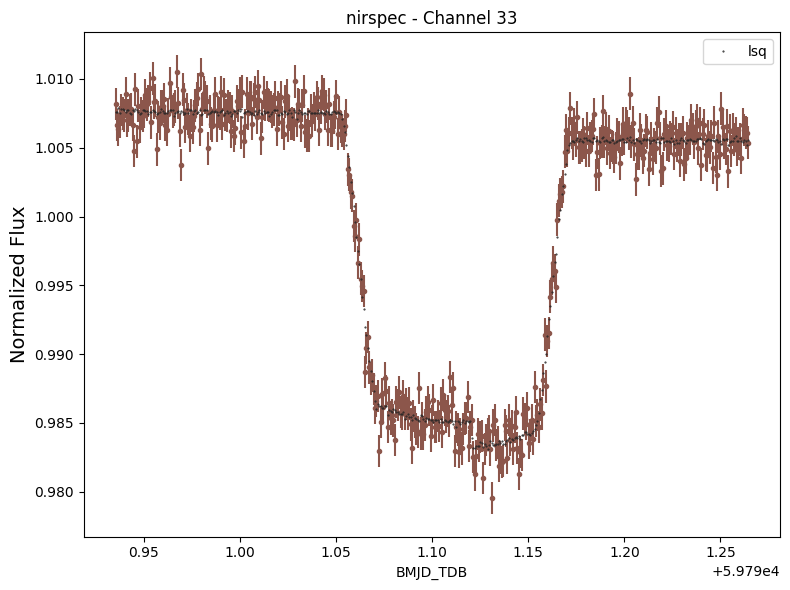

Saving results

Starting Channel 35 of 50

Starting lsq fit.
Starting lnprob: 2317.7468072572065
Current lnprob =  2324.8703652630834
Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2324.8705746581763
       x: [ 1.465e-01  4.238e-02  2.451e-01  1.007e+00 -7.797e-04
           -3.076e-02 -3.628e-01  1.570e+00]
     nit: 8
   direc: [[-3.491e-04  6.876e-03 ... -1.108e-02 -2.559e-03]
           [ 0.000e+00  0.000e+00 ...  0.000e+00  1.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [-1.283e-04  5.024e-03 ...  5.977e-03 -2.496e-04]]
    nfev: 775

Ending lnprob: 2324.8705746581763
Reduced Chi-squared: 1.0184744159750623

LSQ RESULTS:
rp: 0.14648232123211297
u1: 0.04237910860383938
u2: 0.24513450655673072
c0: 1.0066665013215326
c1: -0.0007796518763150115
ypos: -0.030759130922132498
ywidth: -0.3627861350739063
scatter_mult: 1.5704364562789679; 1327.7354099033234 ppm



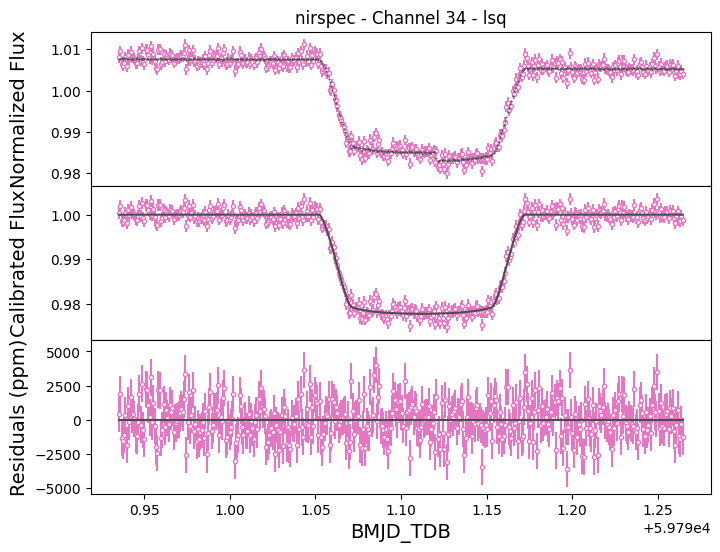

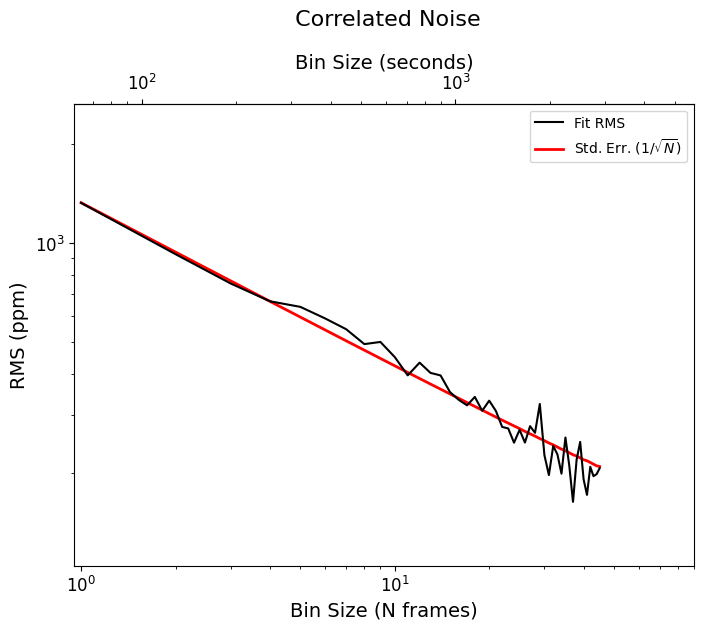

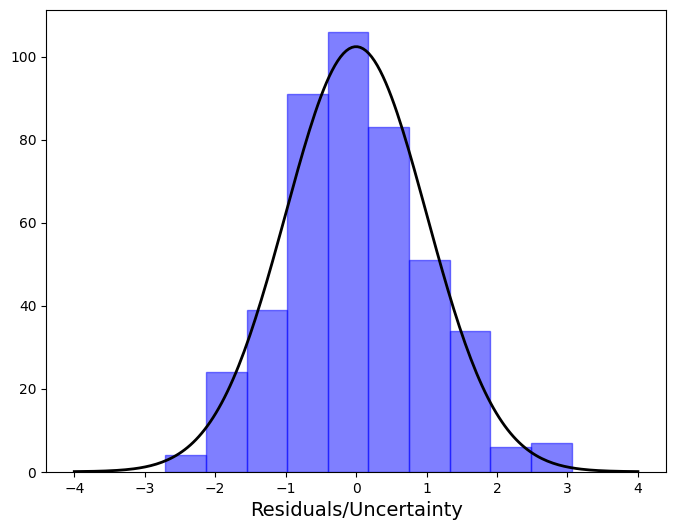

Completed lsq fit.
-------------------------


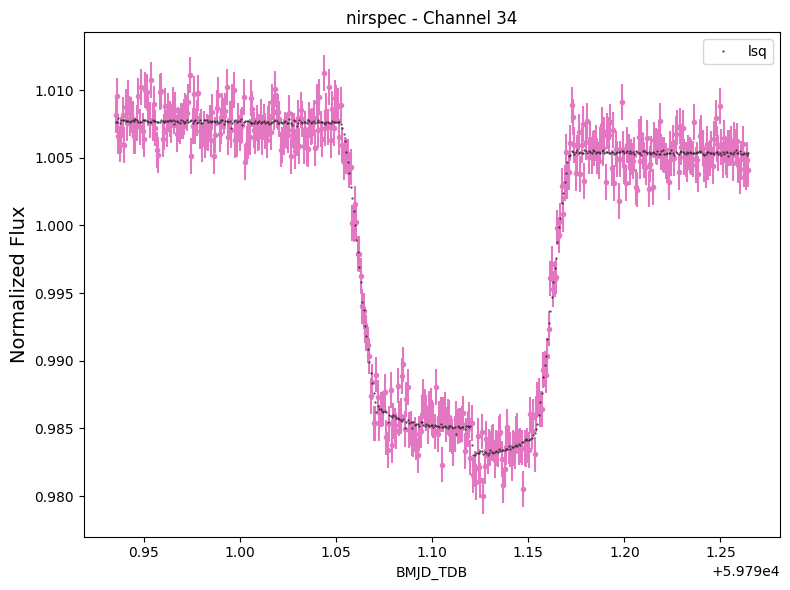

Saving results

Starting Channel 36 of 50

Starting lsq fit.
Starting lnprob: 2309.5219094496138

Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2312.8654866827333
       x: [ 1.459e-01  5.541e-02  3.359e-12  1.007e+00 -1.239e-03
            4.200e-02 -3.172e-01  1.583e+00]
     nit: 8
   direc: [[-1.273e-04  6.976e-04 ...  9.326e-03 -4.162e-04]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 2.289e-05 -4.309e-04 ...  1.584e-03  1.163e-05]]
    nfev: 1085

Ending lnprob: 2312.8654866827333
Reduced Chi-squared: 1.0184717120115907

LSQ RESULTS:
rp: 0.14585173814170524
u1: 0.055410564380594336
u2: 3.3592564566142565e-12
c0: 1.0066176802176943
c1: -0.0012394606217795868
ypos: 0.04199899608012022
ywidth: -0.31719289643141474
scatter_mult: 1.5825740314587424; 1363.8768539462596 ppm



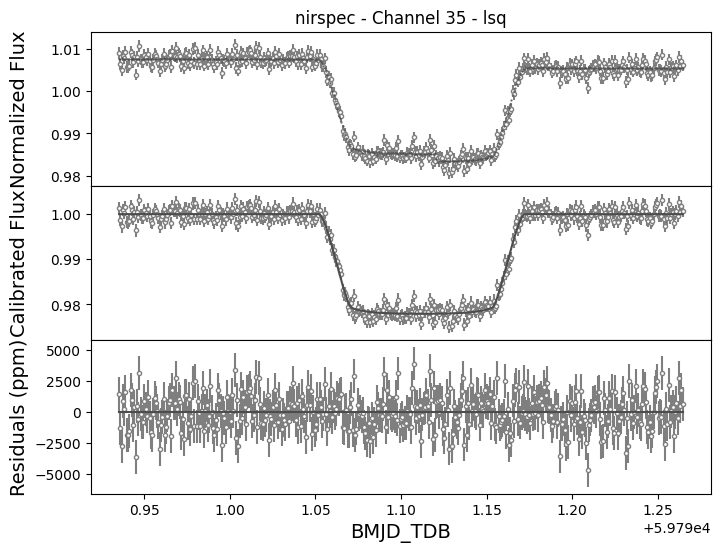

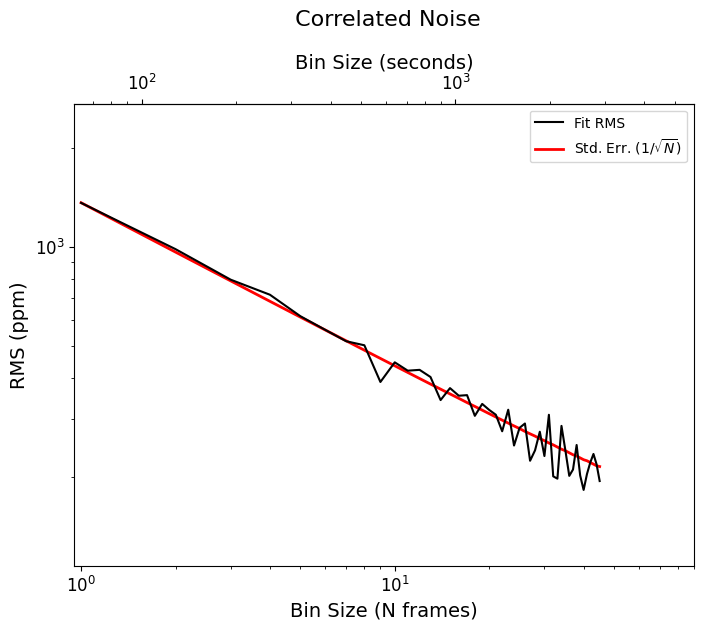

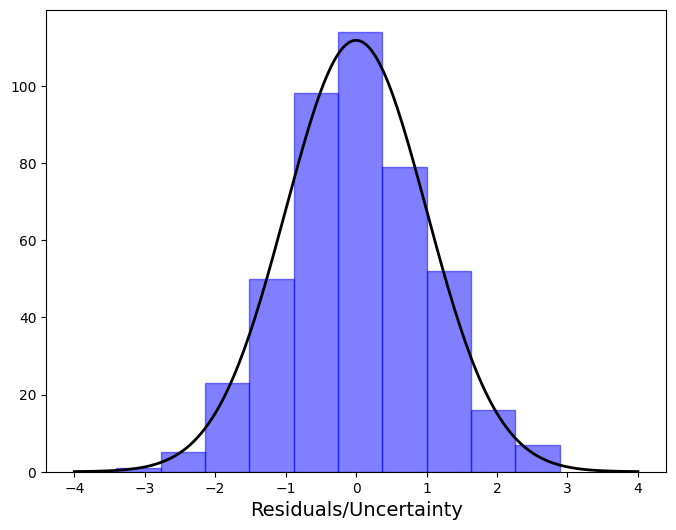

Completed lsq fit.
-------------------------


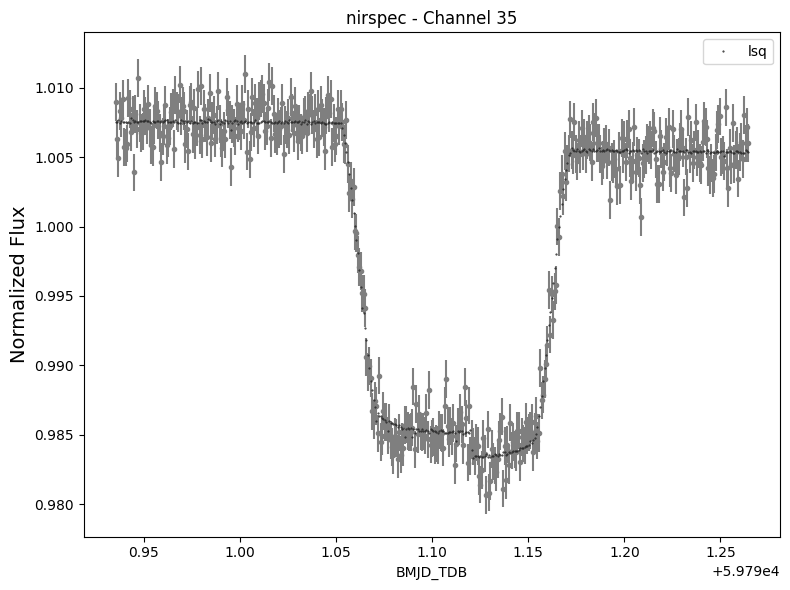

Saving results

Starting Channel 37 of 50

Starting lsq fit.
Starting lnprob: 2334.215190478015

Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2337.4692750036334
       x: [ 1.461e-01  2.935e-02  5.116e-01  1.007e+00 -2.538e-04
            5.699e-02 -3.173e-01  1.493e+00]
     nit: 5
   direc: [[ 8.910e-06 -9.333e-03 ...  7.031e-04 -9.034e-04]
           [ 0.000e+00  0.000e+00 ...  0.000e+00  1.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 1.062e-04 -2.548e-03 ... -4.854e-04 -2.825e-05]]
    nfev: 473

Ending lnprob: 2337.4692750036334
Reduced Chi-squared: 1.0183749663320711

LSQ RESULTS:
rp: 0.14609546422614764
u1: 0.02935452762626021
u2: 0.5115729958725136
c0: 1.0066212537801449
c1: -0.00025381989050502705
ypos: 0.056987045030133236
ywidth: -0.317323573730078
scatter_mult: 1.4930852475718845; 1290.3707626679507 ppm



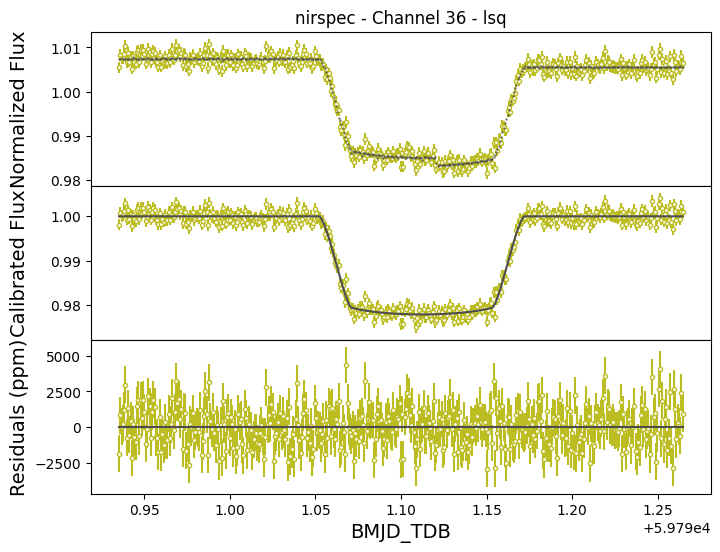

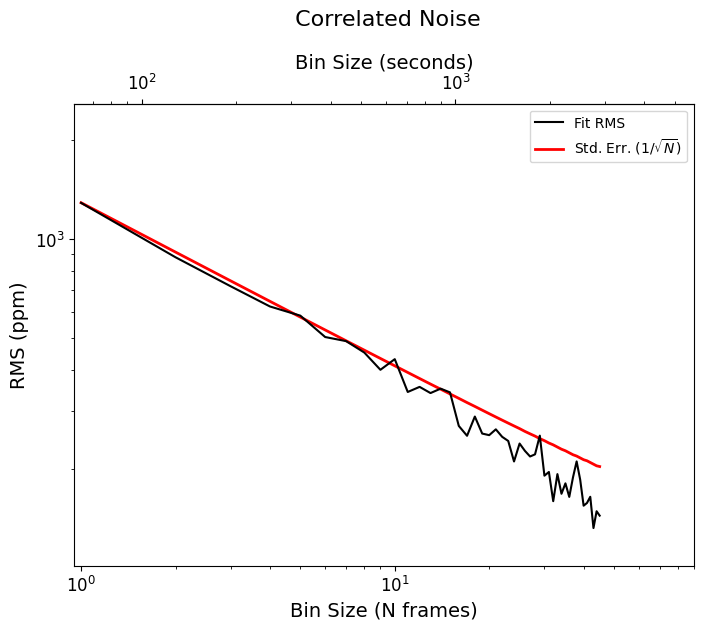

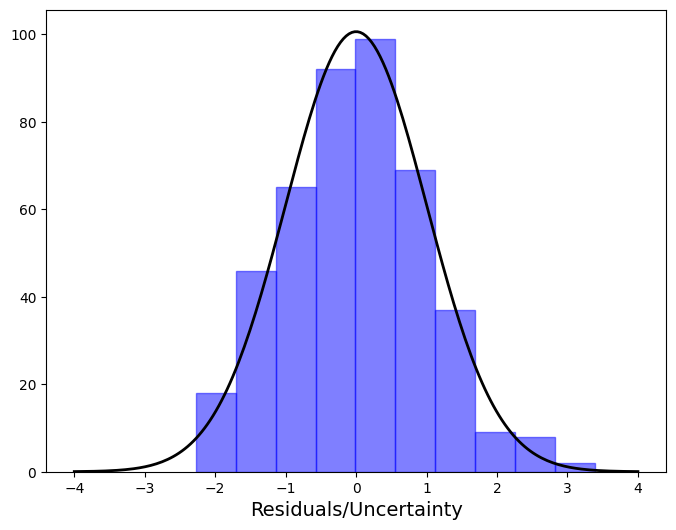

Completed lsq fit.
-------------------------


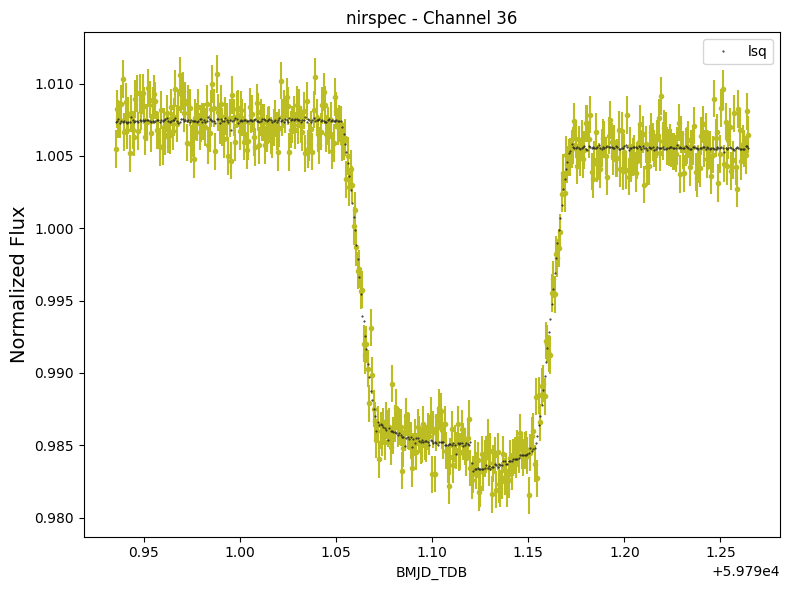

Saving results

Starting Channel 38 of 50

Starting lsq fit.
Starting lnprob: 2346.9512066812335
Current lnprob =  2358.3203657880526
Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2358.3203657880526
       x: [ 1.469e-01  2.000e-02  6.404e-13  1.007e+00  6.442e-04
            1.225e-02 -3.995e-01  1.388e+00]
     nit: 5
   direc: [[ 1.000e+00  0.000e+00 ...  0.000e+00  0.000e+00]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 6.774e-05  1.592e-03 ... -2.955e-02 -2.408e-03]]
    nfev: 678

Ending lnprob: 2358.3203657880526
Reduced Chi-squared: 1.0183115133273501

LSQ RESULTS:
rp: 0.14687641693789724
u1: 0.020004855125734328
u2: 6.40376639796462e-13
c0: 1.0066879947530771
c1: 0.0006442035465962063
ypos: 0.012245820673098422
ywidth: -0.3995332583957742
scatter_mult: 1.3878261594395165; 1231.8229685260487 ppm



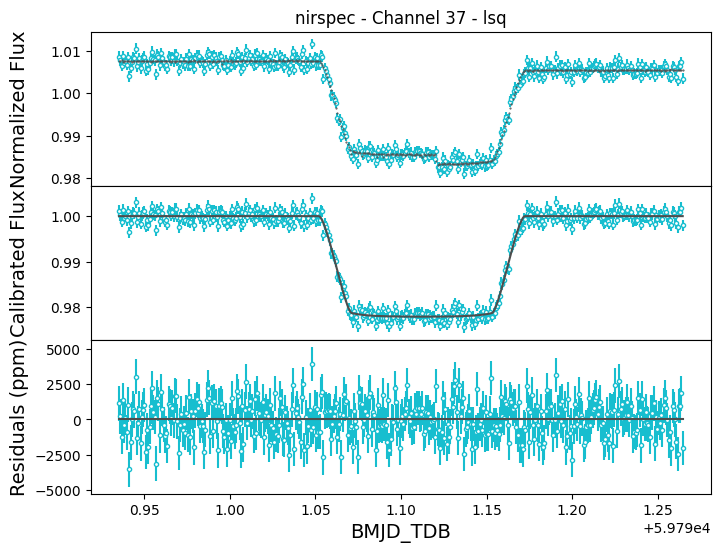

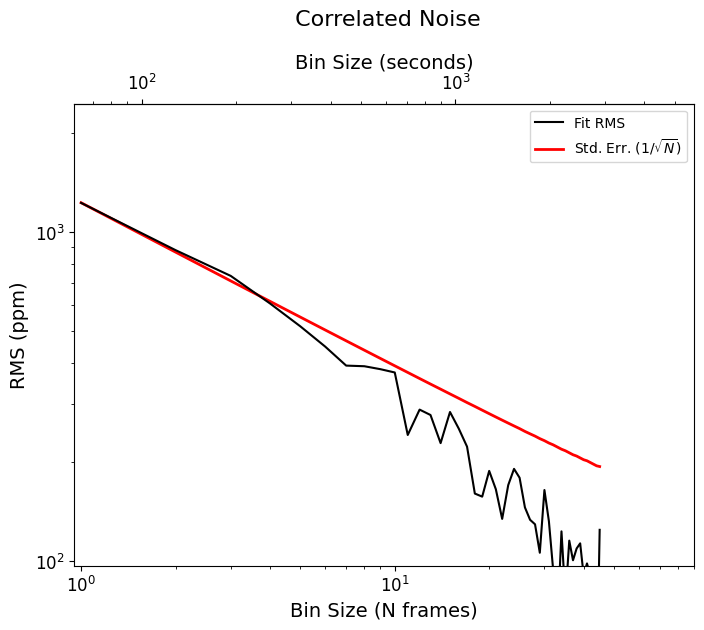

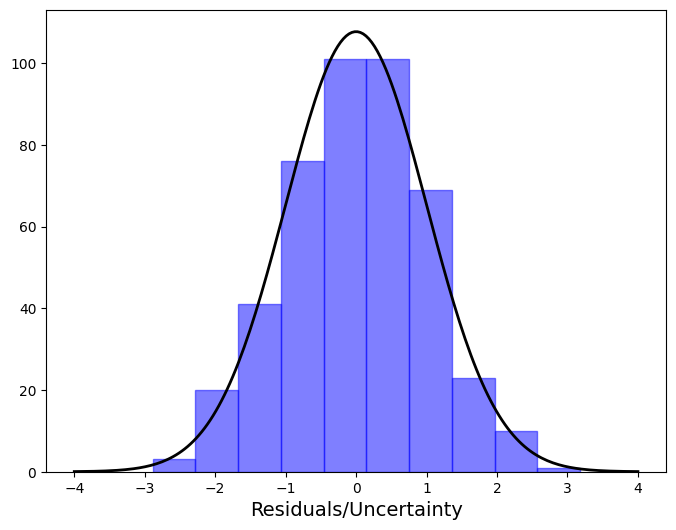

Completed lsq fit.
-------------------------


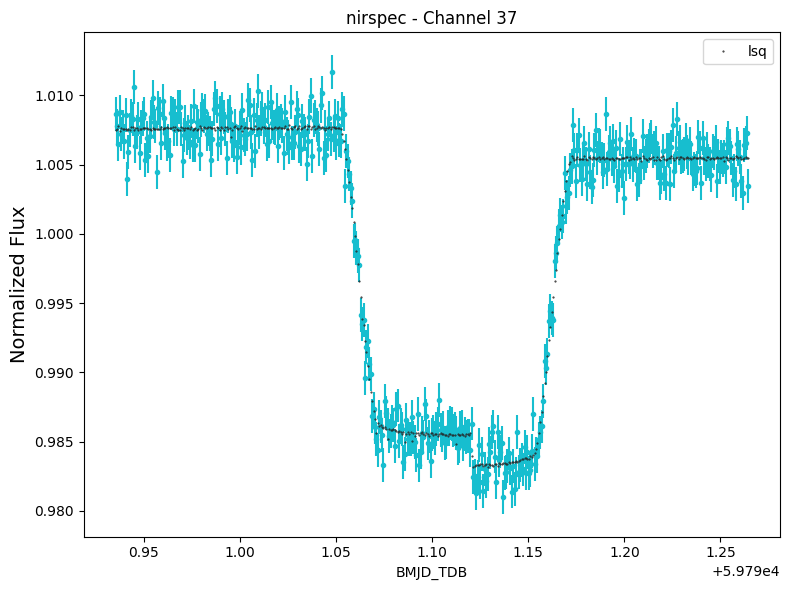

Saving results

Starting Channel 39 of 50

Starting lsq fit.
Starting lnprob: 2285.3601861099637
Current lnprob =  2301.914091478764
Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2301.9202740527458
       x: [ 1.474e-01  8.701e-03  9.645e-01  1.007e+00 -8.507e-04
           -2.852e-02 -2.899e-01  1.580e+00]
     nit: 7
   direc: [[ 6.678e-05 -7.644e-04 ...  1.105e-02  3.834e-04]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [-4.125e-05  1.151e-06 ...  2.759e-03 -1.054e-05]]
    nfev: 763

Ending lnprob: 2301.9202740527458
Reduced Chi-squared: 1.0184715422811896

LSQ RESULTS:
rp: 0.14736439760696188
u1: 0.0087012353136196
u2: 0.9645002609566673
c0: 1.0067164993368574
c1: -0.0008506683344470068
ypos: -0.028516547047426524
ywidth: -0.2899385478884924
scatter_mult: 1.5797402190858072; 1398.0225718501251 ppm



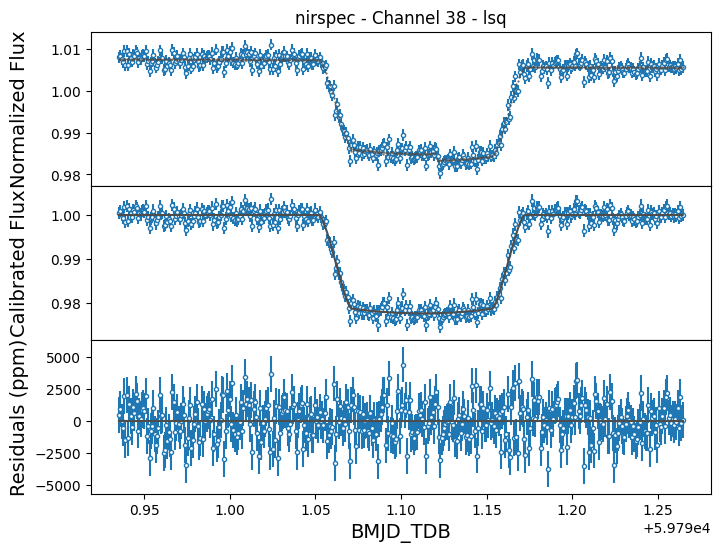

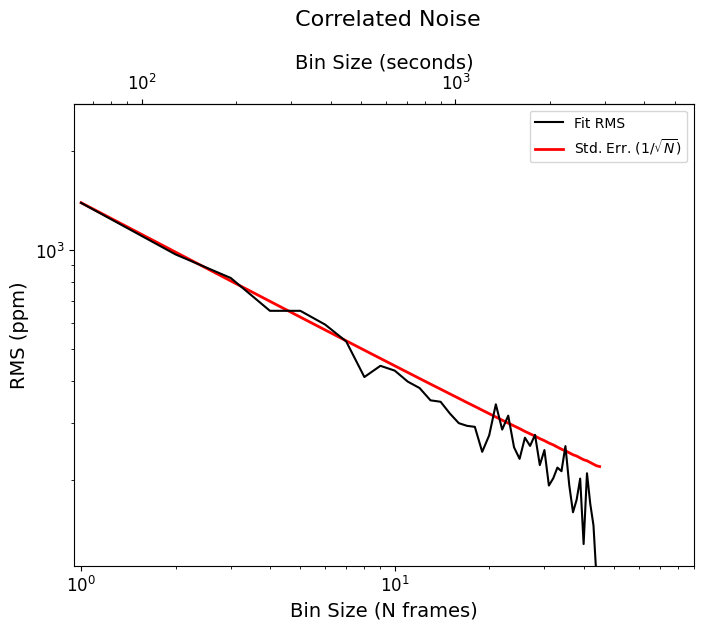

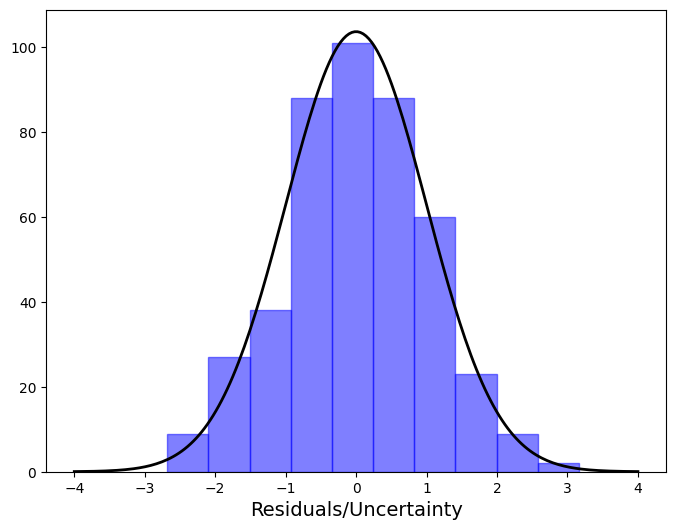

Completed lsq fit.
-------------------------


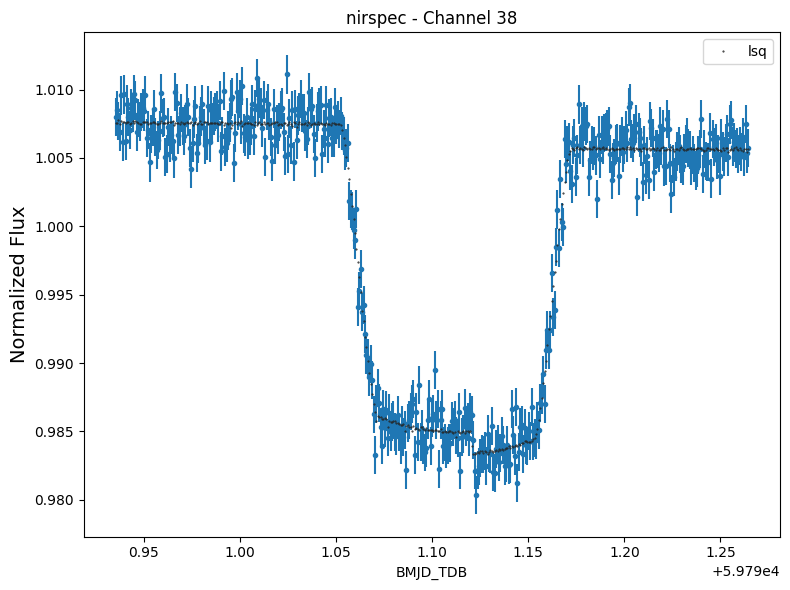

Saving results

Starting Channel 40 of 50

Starting lsq fit.
Starting lnprob: 2301.610657418913

Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2305.539508089684
       x: [ 1.471e-01  1.703e-02  6.195e-01  1.007e+00 -1.540e-03
            5.664e-02 -3.167e-01  1.530e+00]
     nit: 5
   direc: [[ 0.000e+00  0.000e+00 ...  0.000e+00  1.000e+00]
           [-1.869e-04  1.729e-03 ... -6.150e-03 -7.707e-04]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 6.239e-06  2.023e-03 ... -2.903e-03 -1.764e-05]]
    nfev: 493

Ending lnprob: 2305.539508089684
Reduced Chi-squared: 1.0184248521223045

LSQ RESULTS:
rp: 0.14706943656226487
u1: 0.01702810784700622
u2: 0.6194618412286478
c0: 1.0066992230191443
c1: -0.0015397485165604787
ypos: 0.05664351675916995
ywidth: -0.3166969209064109
scatter_mult: 1.5299788806617198; 1386.2806877466537 ppm



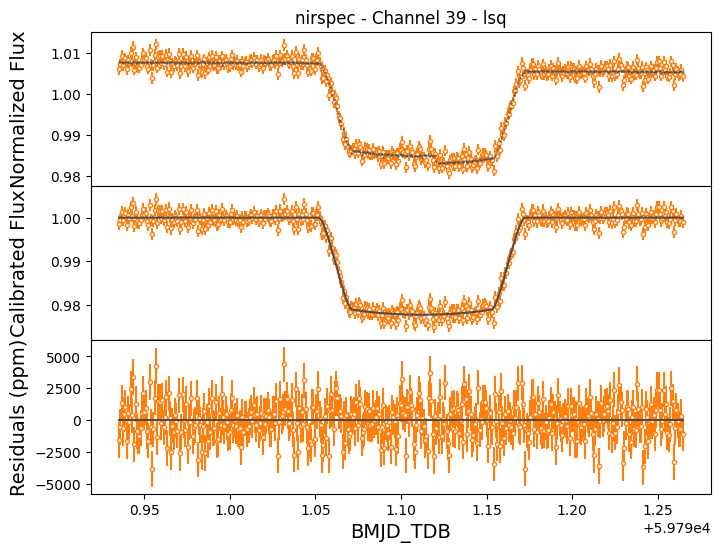

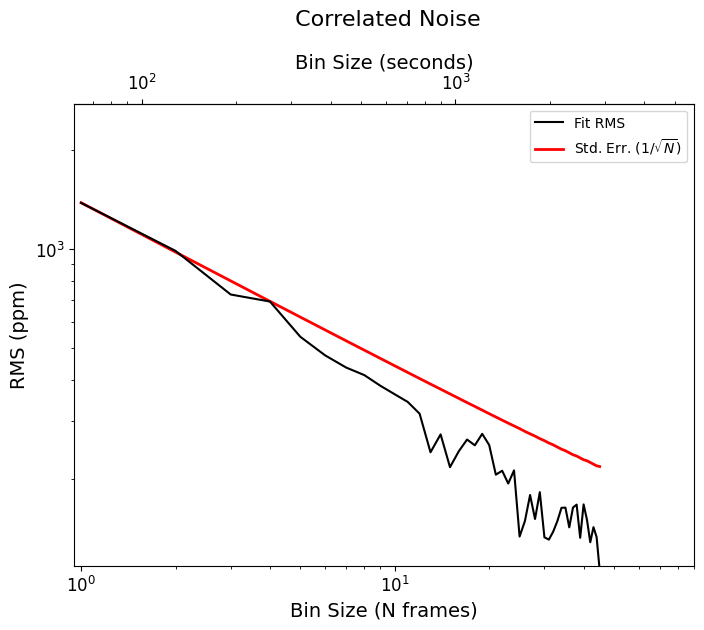

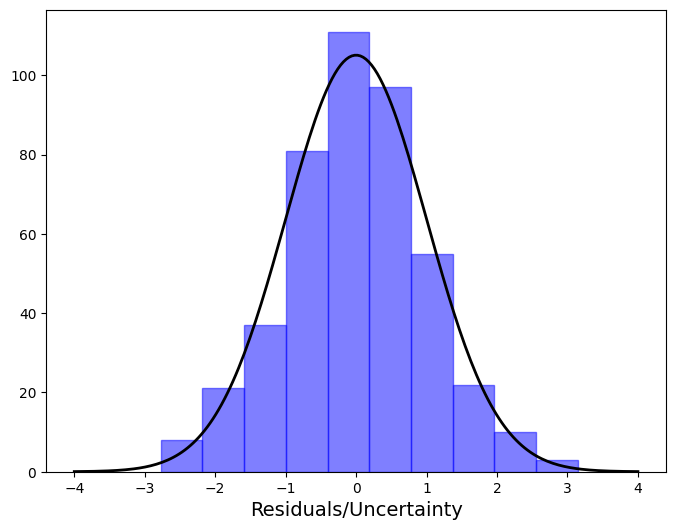

Completed lsq fit.
-------------------------


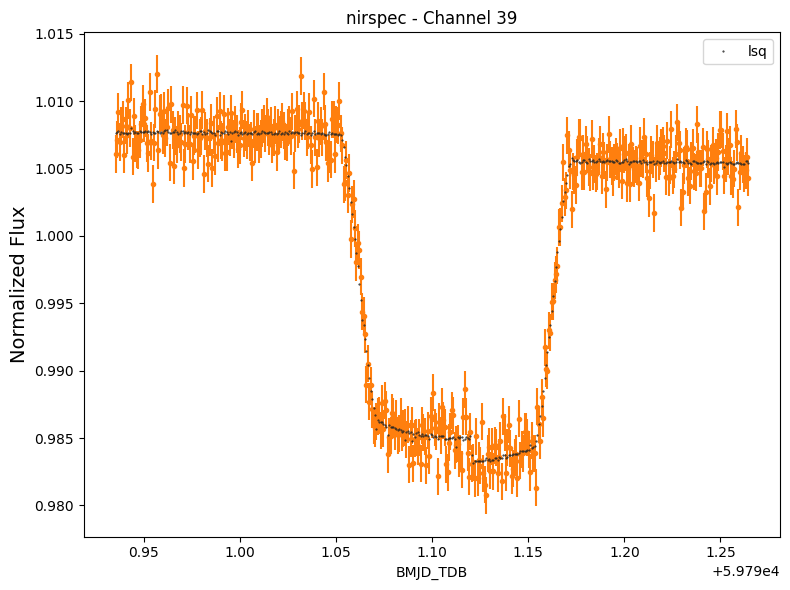

Saving results

Starting Channel 41 of 50

Starting lsq fit.
Starting lnprob: 2291.694042861486
Current lnprob =  2296.59711597687
Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2296.59711597687
       x: [ 1.460e-01  4.527e-02  6.921e-12  1.007e+00 -6.998e-04
            2.932e-03 -3.243e-01  1.531e+00]
     nit: 6
   direc: [[ 0.000e+00  0.000e+00 ...  0.000e+00  1.000e+00]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [-4.907e-05  6.391e-04 ... -6.821e-04 -4.377e-05]]
    nfev: 757

Ending lnprob: 2296.59711597687
Reduced Chi-squared: 1.0184196967005865

LSQ RESULTS:
rp: 0.1460187954479888
u1: 0.04527297947659673
u2: 6.921413570386238e-12
c0: 1.006626996796294
c1: -0.0006997581662814555
ypos: 0.002932137057255394
ywidth: -0.3242985104101763
scatter_mult: 1.5314481145120795; 1415.0090438012899 ppm



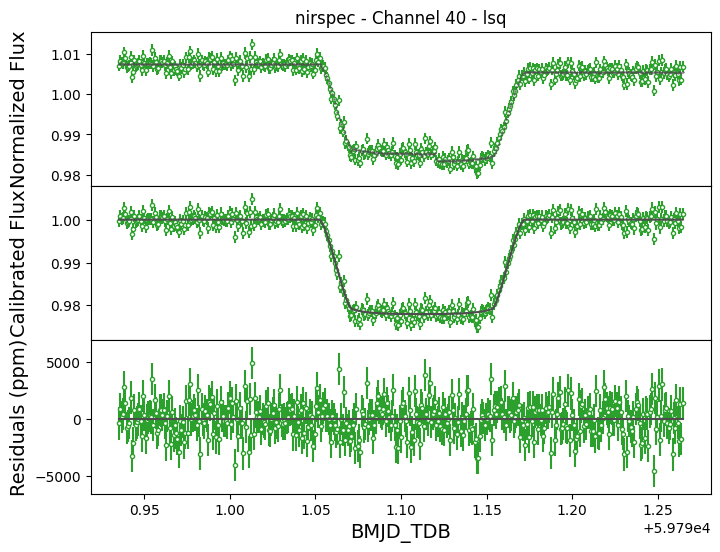

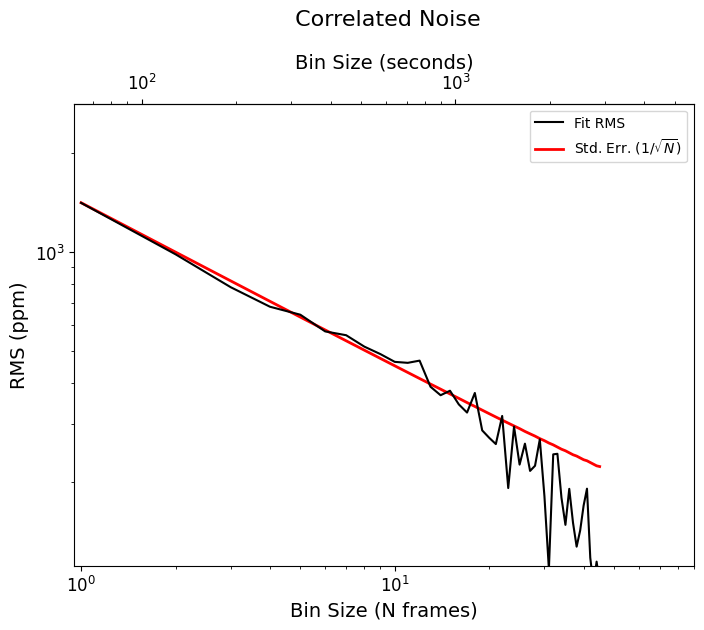

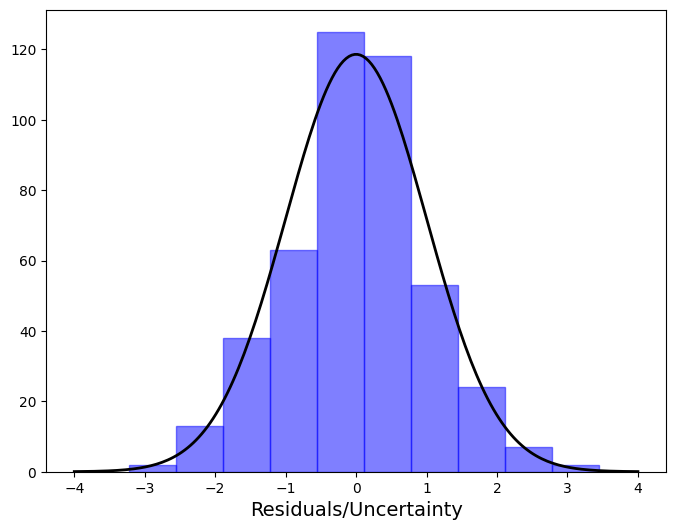

Completed lsq fit.
-------------------------


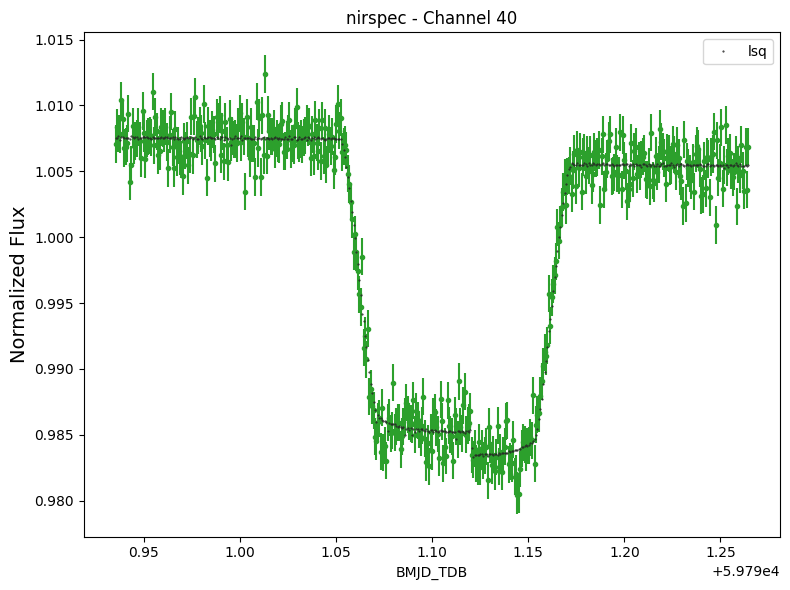

Saving results

Starting Channel 42 of 50

Starting lsq fit.
Starting lnprob: 2292.200277293595

Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2312.563099656399
       x: [ 1.468e-01  1.913e-02  7.398e-01  1.007e+00  1.912e-03
            8.016e-02 -5.389e-01  1.457e+00]
     nit: 8
   direc: [[ 2.694e-06  3.508e-03 ... -1.085e-01 -2.892e-02]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 2.028e-05 -2.547e-03 ...  1.939e-03 -4.270e-04]]
    nfev: 822

Ending lnprob: 2312.563099656399
Reduced Chi-squared: 1.0183664776206784

LSQ RESULTS:
rp: 0.14683869539705555
u1: 0.019128970260771903
u2: 0.7397600747749266
c0: 1.0066802828201926
c1: 0.0019117749717575247
ypos: 0.08015778438656976
ywidth: -0.5389067109118152
scatter_mult: 1.457248878323566; 1364.0234646738809 ppm



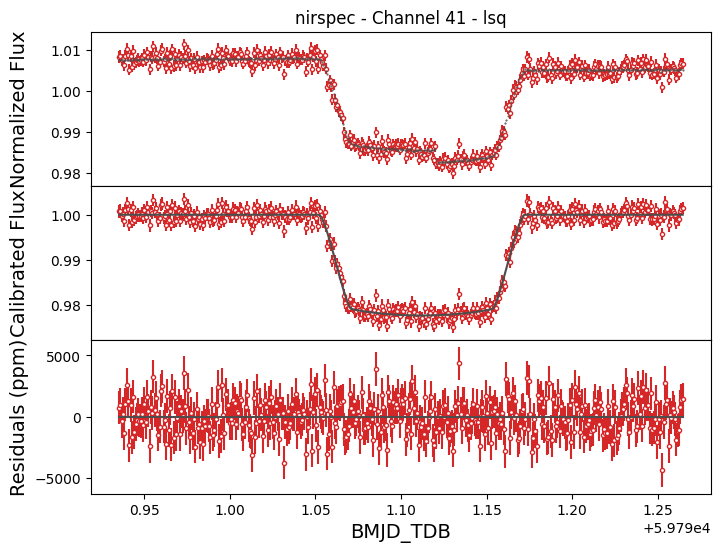

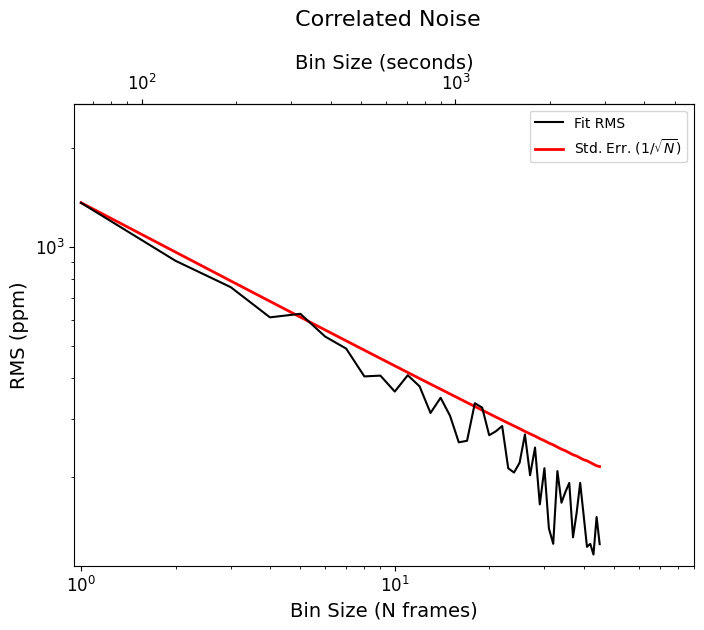

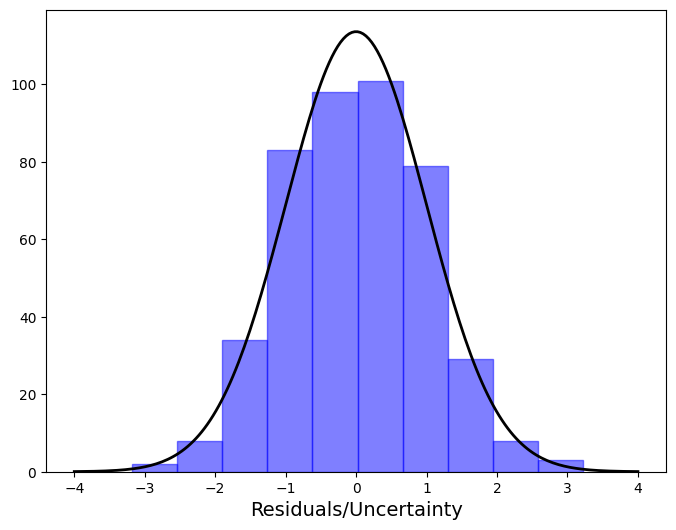

Completed lsq fit.
-------------------------


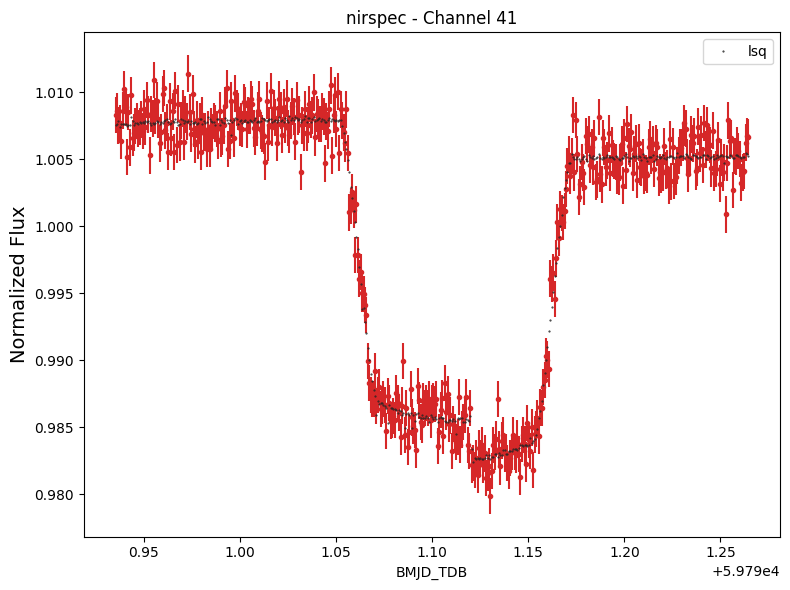

Saving results

Starting Channel 43 of 50

Starting lsq fit.
Starting lnprob: 2289.151258374903
Current lnprob =  2321.7215480822733
Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2321.7215480822733
       x: [ 1.470e-01  2.684e-02  2.052e-12  1.007e+00  2.279e-03
            2.951e-02 -3.694e-01  1.411e+00]
     nit: 9
   direc: [[ 1.000e+00  0.000e+00 ...  0.000e+00  0.000e+00]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [-1.470e-04 -4.194e-04 ...  2.281e-02 -1.289e-03]]
    nfev: 1131

Ending lnprob: 2321.7215480822733
Reduced Chi-squared: 1.0183401274675155

LSQ RESULTS:
rp: 0.14702967817992965
u1: 0.02684364697398383
u2: 2.0518401680870323e-12
c0: 1.0067076456200135
c1: 0.0022785101733195285
ypos: 0.02951069823434048
ywidth: -0.3693773237474157
scatter_mult: 1.4106035976722187; 1337.2451316960828 ppm



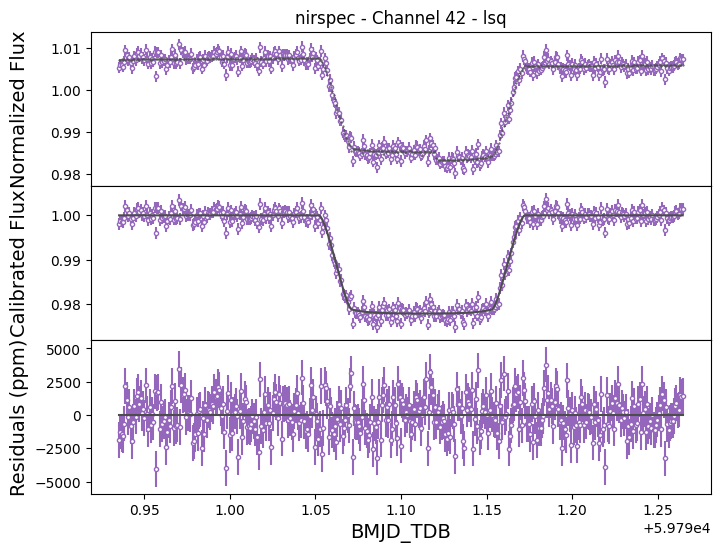

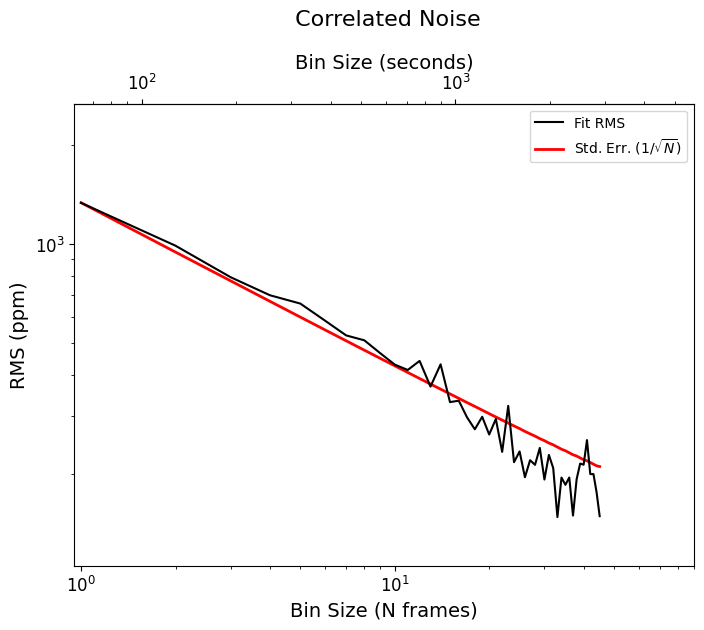

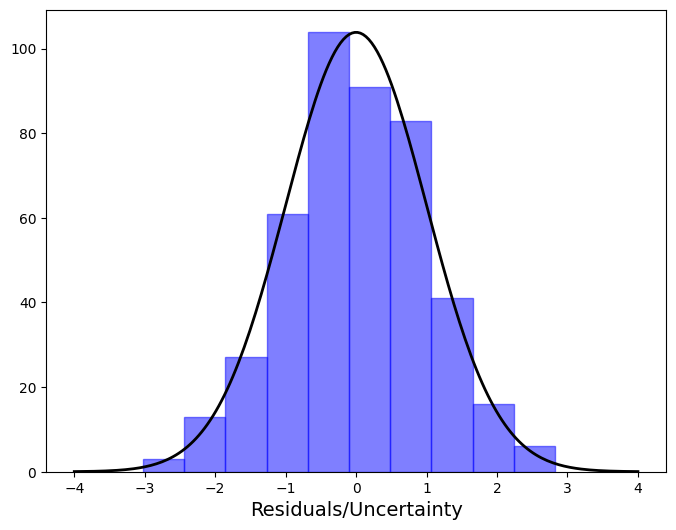

Completed lsq fit.
-------------------------


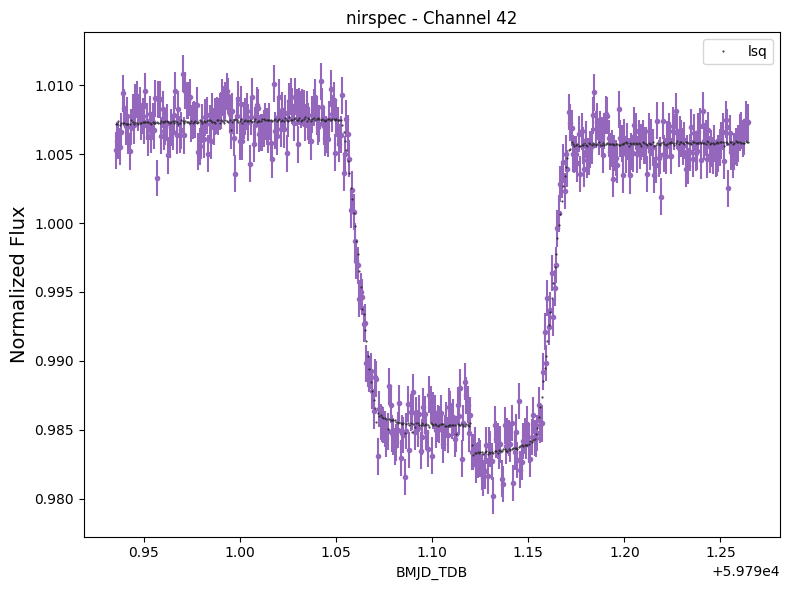

Saving results

Starting Channel 44 of 50

Starting lsq fit.
Starting lnprob: 2268.1704359035516

Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2286.083104455915
       x: [ 1.464e-01  5.249e-03  1.000e+00  1.007e+00 -2.297e-03
           -2.917e-02 -2.772e-01  1.548e+00]
     nit: 7
   direc: [[ 1.000e+00  0.000e+00 ...  0.000e+00  0.000e+00]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [-1.836e-04 -6.236e-03 ...  2.573e-02 -4.982e-03]]
    nfev: 882

Ending lnprob: 2286.083104455915
Reduced Chi-squared: 1.0184387871087404

LSQ RESULTS:
rp: 0.14636903584869998
u1: 0.00524888944322268
u2: 0.9999999999961817
c0: 1.0066208082476573
c1: -0.0022966033449935653
ypos: -0.029171451013864657
ywidth: -0.27715081053293045
scatter_mult: 1.5480320349526904; 1448.7345941939325 ppm



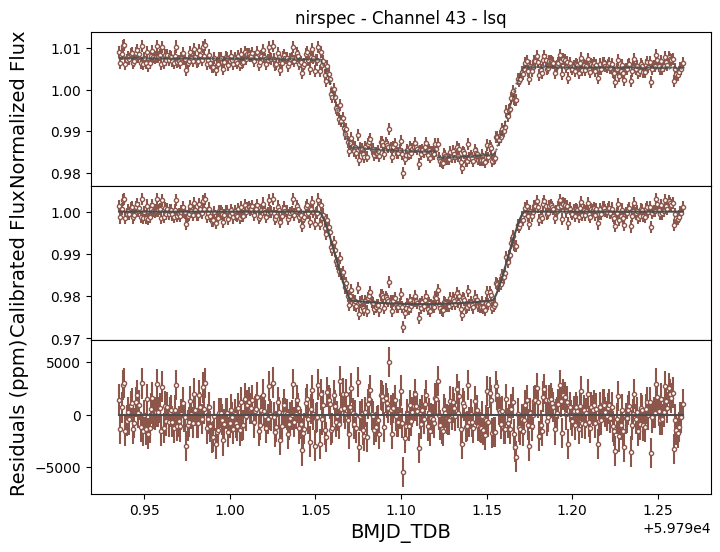

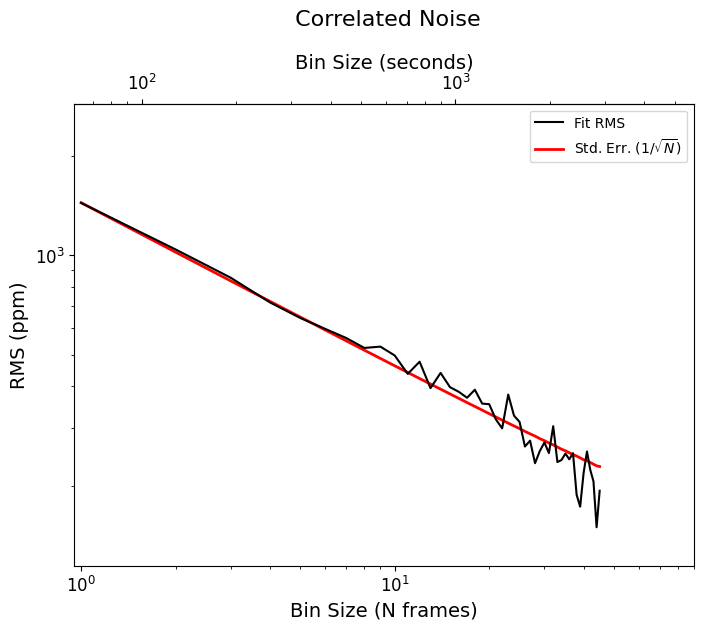

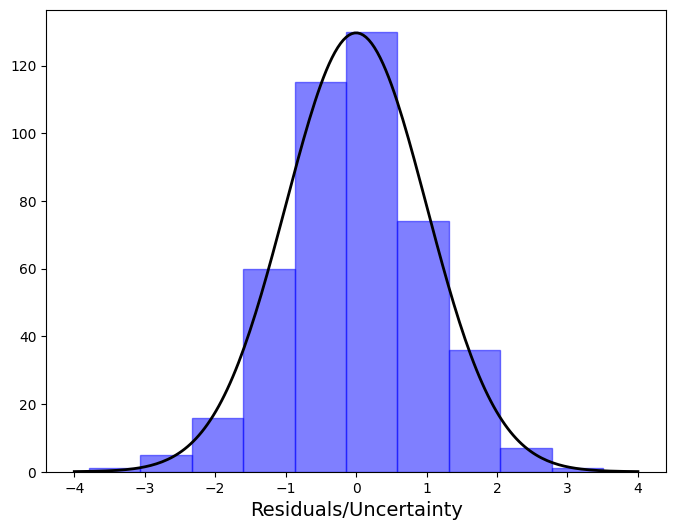

Completed lsq fit.
-------------------------


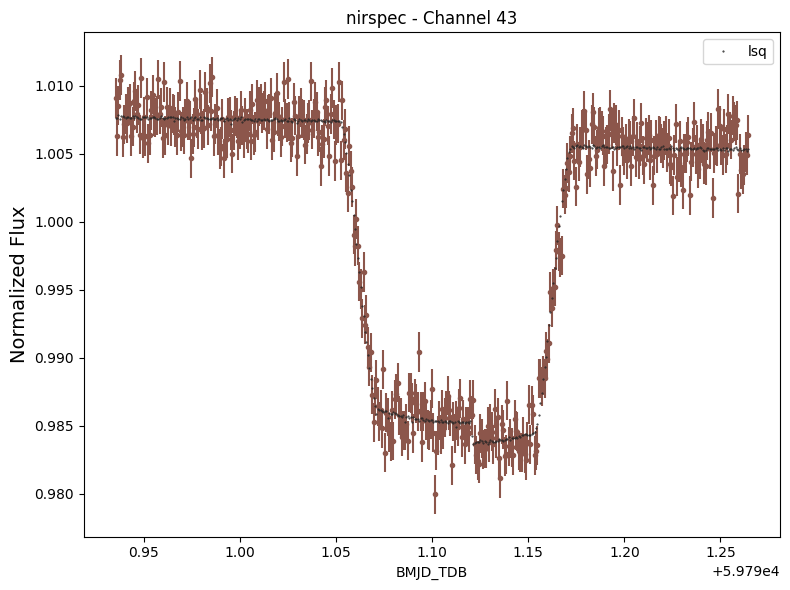

Saving results

Starting Channel 45 of 50

Starting lsq fit.
Starting lnprob: 2301.6188804145345

Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2315.5882564010153
       x: [ 1.474e-01  2.223e-02  4.322e-01  1.007e+00  2.163e-03
            3.583e-02 -3.729e-01  1.405e+00]
     nit: 7
   direc: [[ 3.708e-04  4.659e-03 ... -3.177e-02 -5.691e-03]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 5.637e-05 -2.379e-03 ... -3.805e-03 -2.504e-05]]
    nfev: 782

Ending lnprob: 2315.5882564010153
Reduced Chi-squared: 1.018311725626442

LSQ RESULTS:
rp: 0.14744498017753377
u1: 0.022228740090016356
u2: 0.43216078106741174
c0: 1.0067397720502433
c1: 0.0021633005878109873
ypos: 0.03582636848943107
ywidth: -0.3729430060667808
scatter_mult: 1.4051060904794948; 1355.7391135613377 ppm



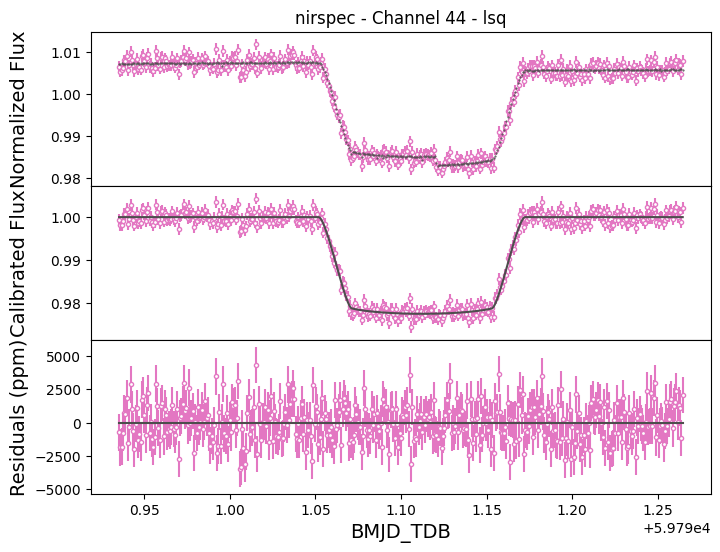

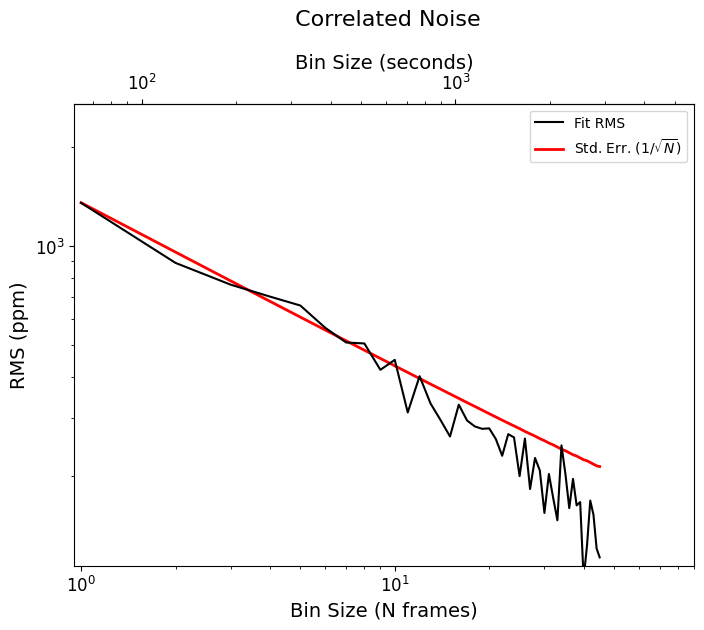

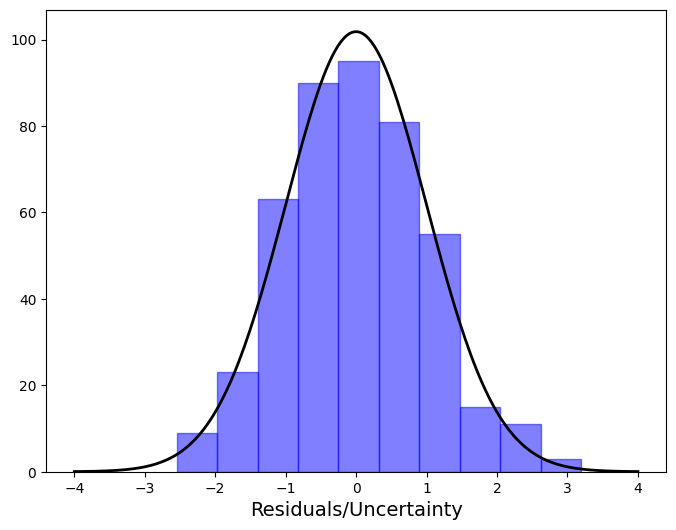

Completed lsq fit.
-------------------------


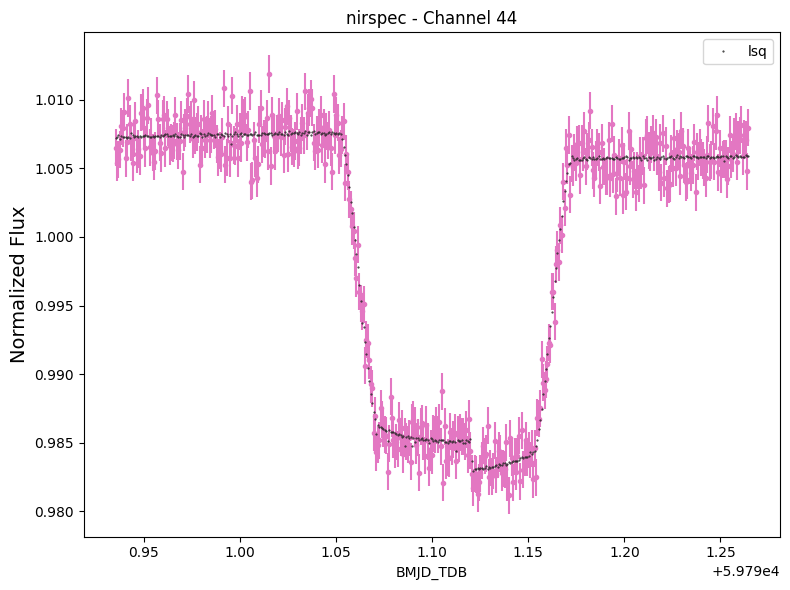

Saving results

Starting Channel 46 of 50

Starting lsq fit.
Starting lnprob: 2245.630392715739

Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2263.578251610435
       x: [ 1.455e-01  2.991e-02  6.500e-01  1.007e+00  1.324e-03
           -4.242e-03 -4.131e-01  1.570e+00]
     nit: 5
   direc: [[ 0.000e+00  0.000e+00 ...  0.000e+00  1.000e+00]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 6.371e-05 -6.640e-04 ... -1.054e-02 -2.461e-04]]
    nfev: 511

Ending lnprob: 2263.578251610435
Reduced Chi-squared: 1.018402128759255

LSQ RESULTS:
rp: 0.14552597872006112
u1: 0.0299149482600164
u2: 0.6499783682187291
c0: 1.0065689876285802
c1: 0.00132435458974681
ypos: -0.004242430931833672
ywidth: -0.41308607232237166
scatter_mult: 1.5702434298492511; 1523.921135179937 ppm



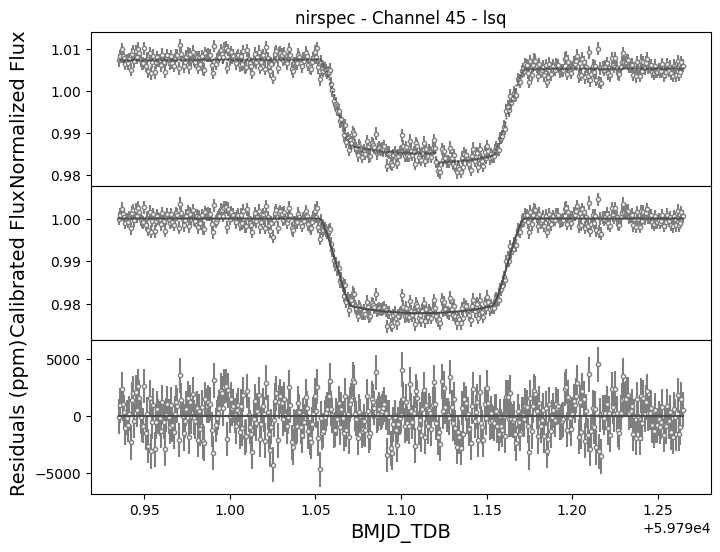

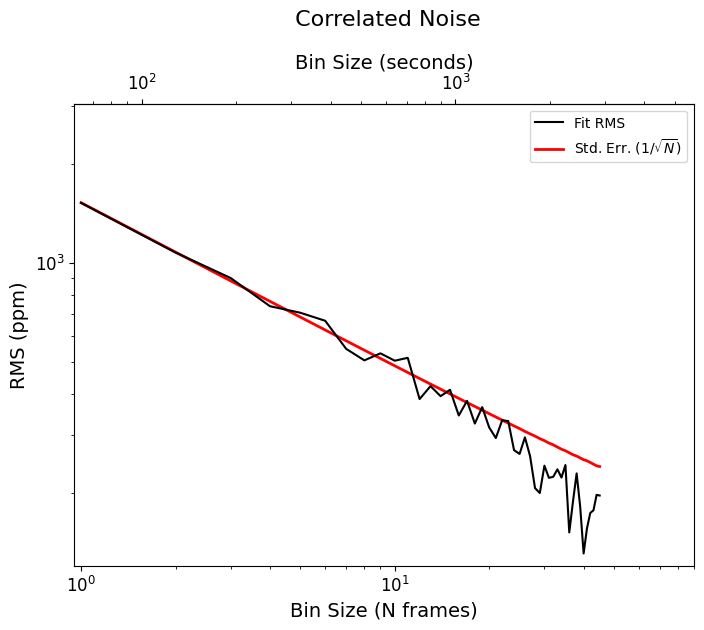

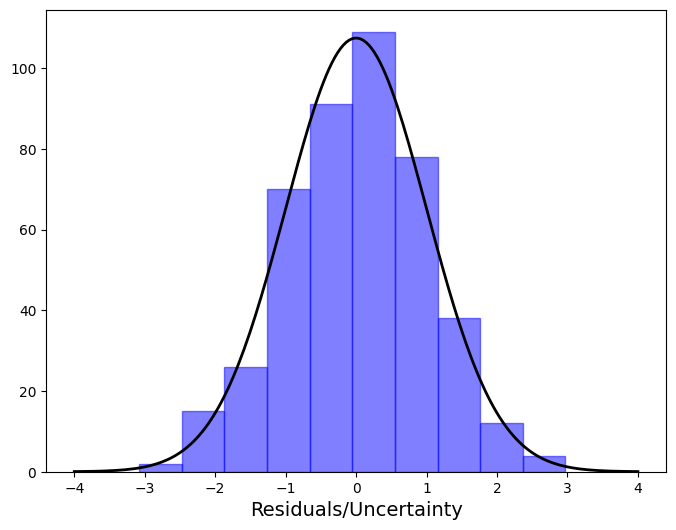

Completed lsq fit.
-------------------------


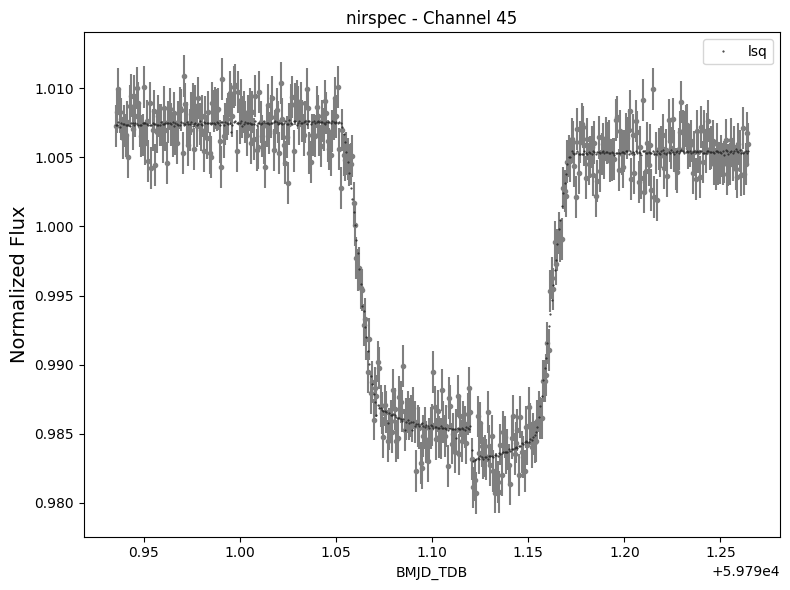

Saving results

Starting Channel 47 of 50

Starting lsq fit.
Starting lnprob: 2255.58869316247
Current lnprob =  2268.7867332550095
Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2268.7867332550095
       x: [ 1.467e-01  1.228e-02  1.000e+00  1.007e+00  1.403e-04
            3.803e-02 -2.651e-01  1.523e+00]
     nit: 8
   direc: [[ 9.315e-06 -1.336e-03 ...  3.521e-02 -2.530e-03]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [-1.861e-05  3.969e-05 ...  2.912e-04  2.231e-05]]
    nfev: 1194

Ending lnprob: 2268.7867332550095
Reduced Chi-squared: 1.0184136417430956

LSQ RESULTS:
rp: 0.146661502373592
u1: 0.012281014766963024
u2: 0.999999999997883
c0: 1.0066557115737311
c1: 0.00014030144808198524
ypos: 0.038031325022255306
ywidth: -0.2651317003771697
scatter_mult: 1.5228380919758242; 1506.1347142113136 ppm



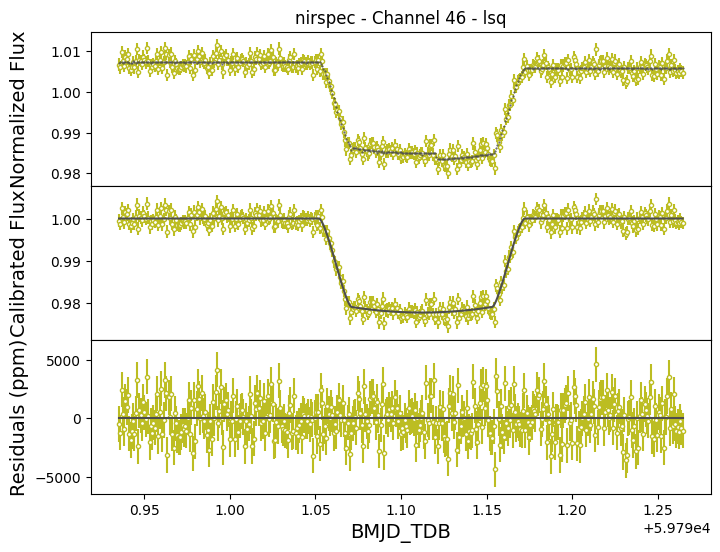

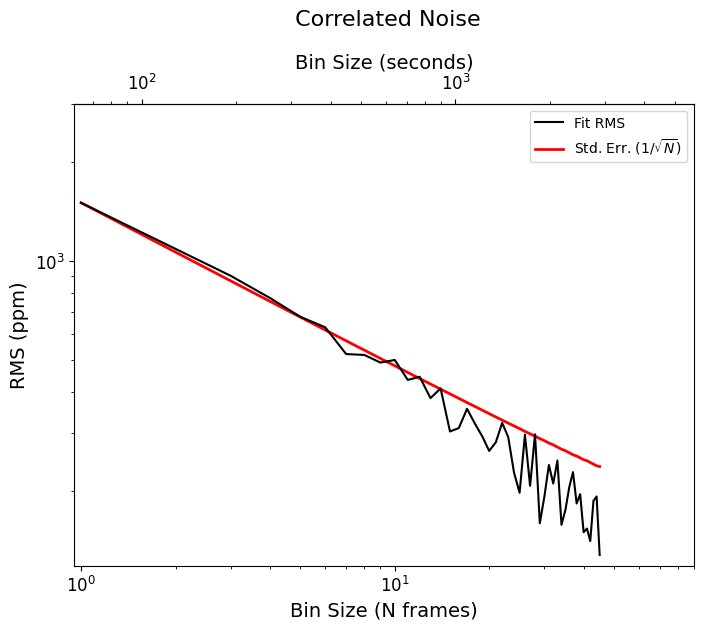

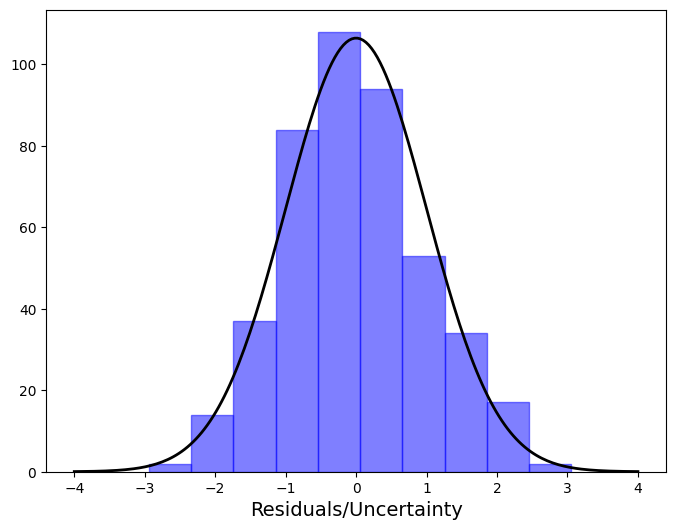

Completed lsq fit.
-------------------------


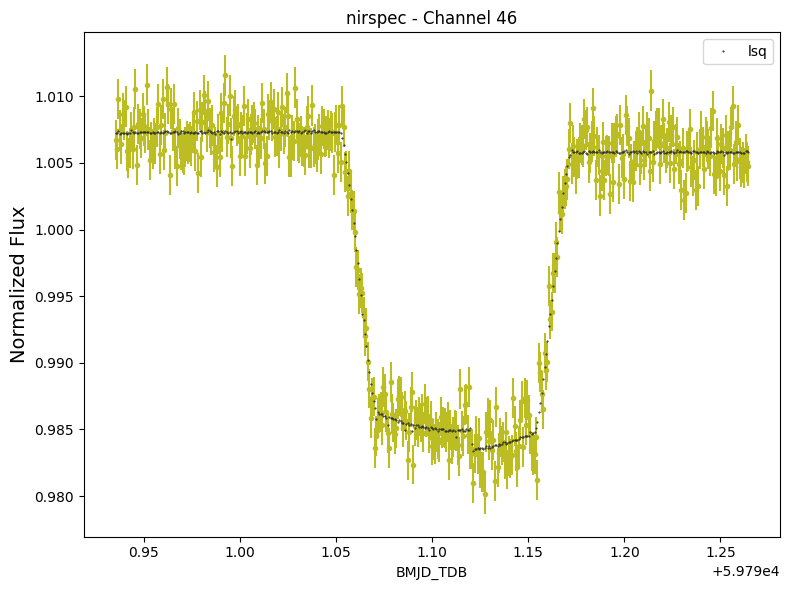

Saving results

Starting Channel 48 of 50

Starting lsq fit.
Starting lnprob: 2248.7505555884327

Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2271.361474219103
       x: [ 1.450e-01  4.409e-02  2.847e-01  1.007e+00  4.764e-04
            2.413e-02 -4.314e-01  1.493e+00]
     nit: 9
   direc: [[-8.635e-06 -1.296e-03 ... -3.754e-03  1.226e-04]
           [ 6.401e-05  6.457e-03 ... -9.740e-03  1.420e-03]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 8.632e-05 -3.180e-03 ... -1.353e-03 -1.119e-04]]
    nfev: 935

Ending lnprob: 2271.361474219103
Reduced Chi-squared: 1.0183885597263629

LSQ RESULTS:
rp: 0.14502931617999734
u1: 0.0440890952855778
u2: 0.28466588163504375
c0: 1.0065350045946804
c1: 0.0004764496507477799
ypos: 0.024131686816673666
ywidth: -0.4313694771301564
scatter_mult: 1.4928145779076043; 1497.261969448608 ppm



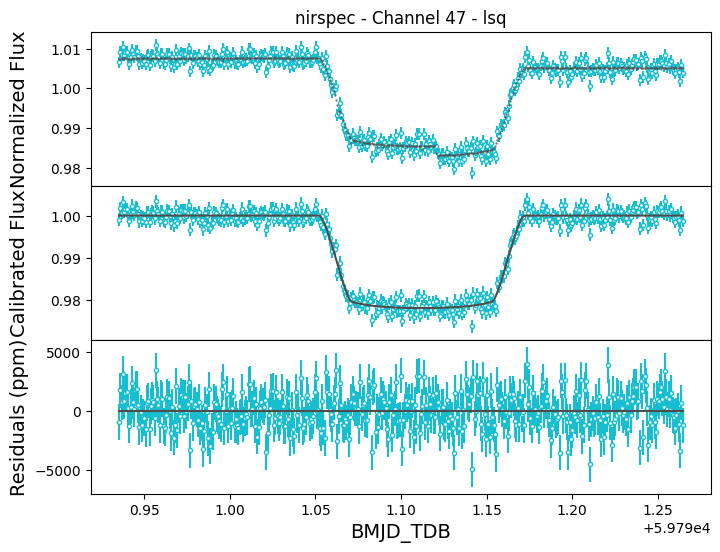

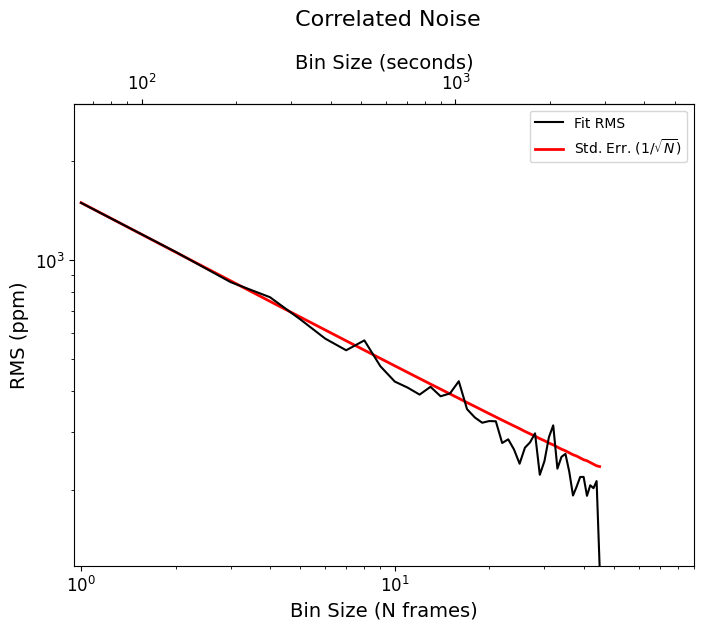

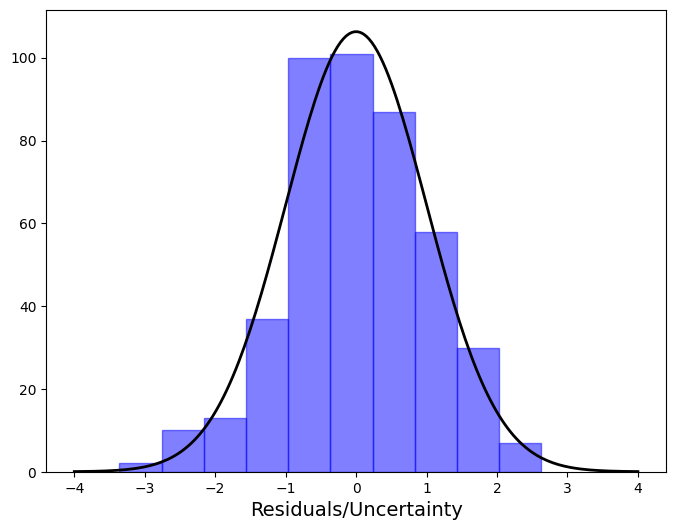

Completed lsq fit.
-------------------------


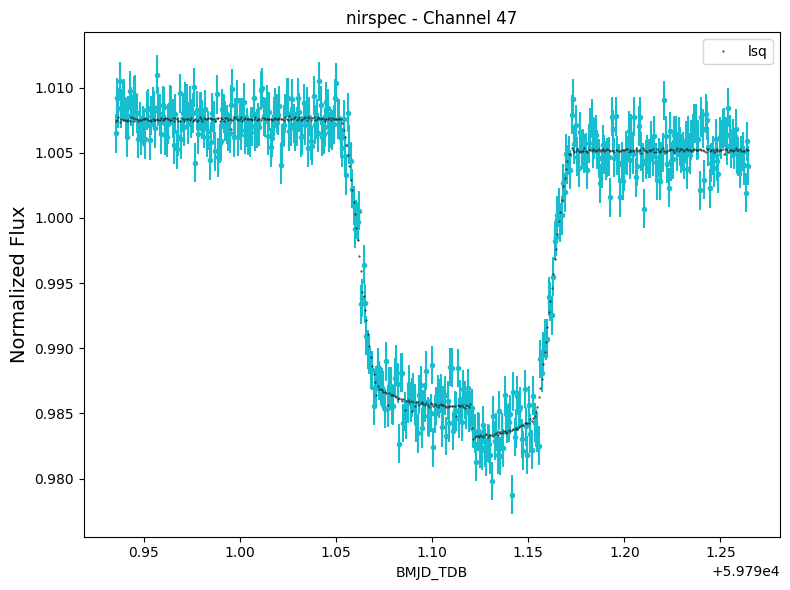

Saving results

Starting Channel 49 of 50

Starting lsq fit.
Starting lnprob: 2250.932786655999

Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2259.5814948605343
       x: [ 1.469e-01  3.640e-02  2.891e-01  1.007e+00 -4.969e-05
            5.990e-02 -3.763e-01  1.558e+00]
     nit: 7
   direc: [[ 0.000e+00  0.000e+00 ...  0.000e+00  1.000e+00]
           [-4.249e-05 -2.746e-03 ...  9.891e-03 -5.076e-04]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [-4.657e-05  2.657e-03 ...  2.543e-03 -4.880e-05]]
    nfev: 717

Ending lnprob: 2259.5814948605343
Reduced Chi-squared: 1.0184474086425845

LSQ RESULTS:
rp: 0.14687230400092585
u1: 0.036402996487545886
u2: 0.2890933631023098
c0: 1.0066974061137757
c1: -4.9687704447496776e-05
ypos: 0.059902461046841646
ywidth: -0.3763071126406587
scatter_mult: 1.5580431309813363; 1537.1206179913825 ppm



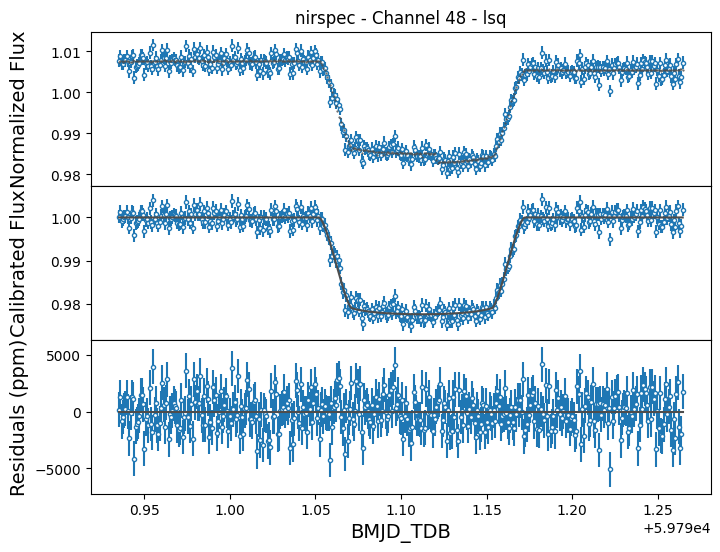

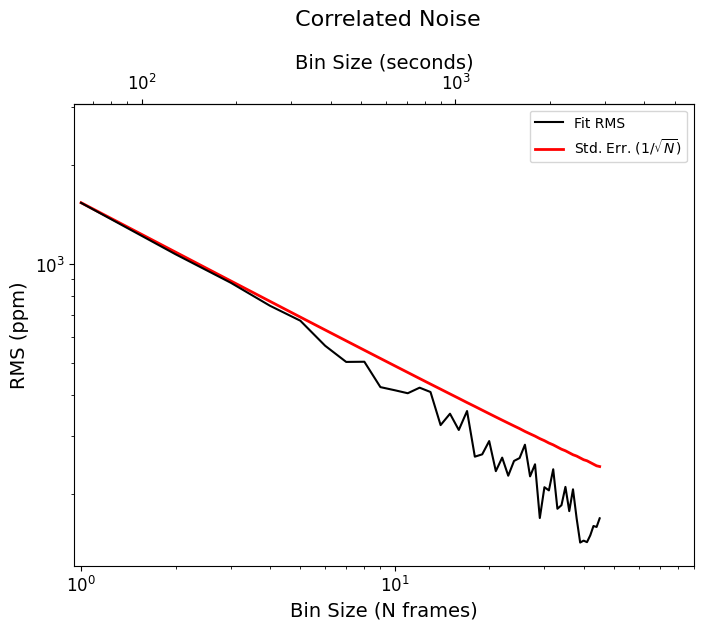

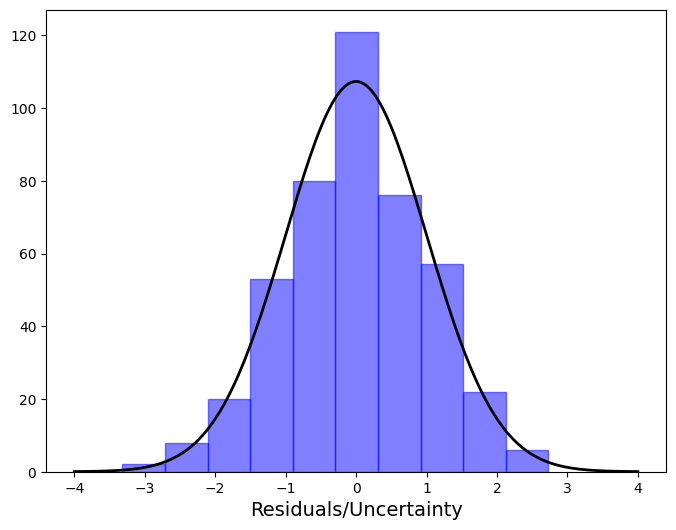

Completed lsq fit.
-------------------------


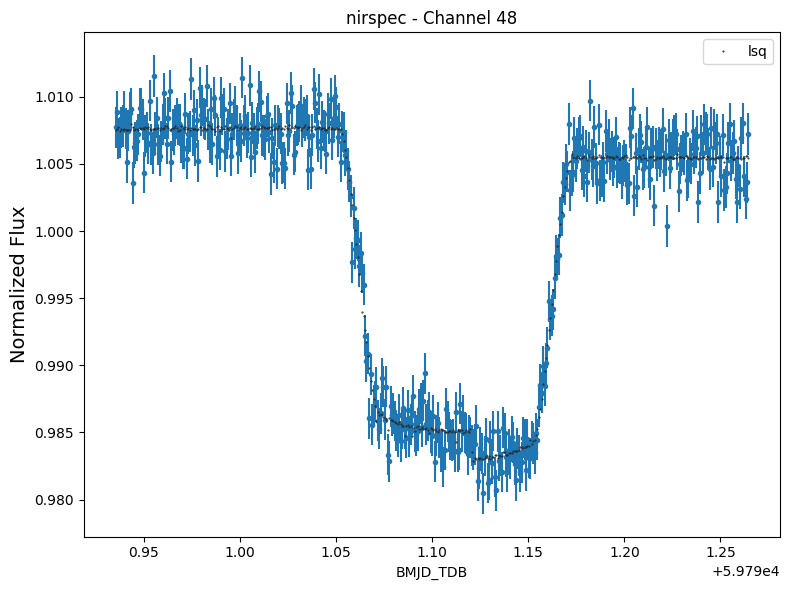

Saving results

Starting Channel 50 of 50

Starting lsq fit.
Starting lnprob: 2275.5888550843406
Current lnprob =  2286.9545306675027
Verbose lsq results:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: -2286.955626214615
       x: [ 1.455e-01  5.668e-03  1.000e+00  1.007e+00 -2.517e-04
            5.973e-02 -3.646e-01  1.443e+00]
     nit: 7
   direc: [[ 1.000e+00  0.000e+00 ...  0.000e+00  0.000e+00]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 0.000e+00  0.000e+00 ...  0.000e+00  1.000e+00]]
    nfev: 898

Ending lnprob: 2286.955626214615
Reduced Chi-squared: 1.0183420756322688

LSQ RESULTS:
rp: 0.14554451989047446
u1: 0.0056682249828715
u2: 0.9999999999947583
c0: 1.0065470779612462
c1: -0.00025171131758531265
ypos: 0.05973290796728942
ywidth: -0.3646109001049761
scatter_mult: 1.442932673658677; 1445.4167041458825 ppm



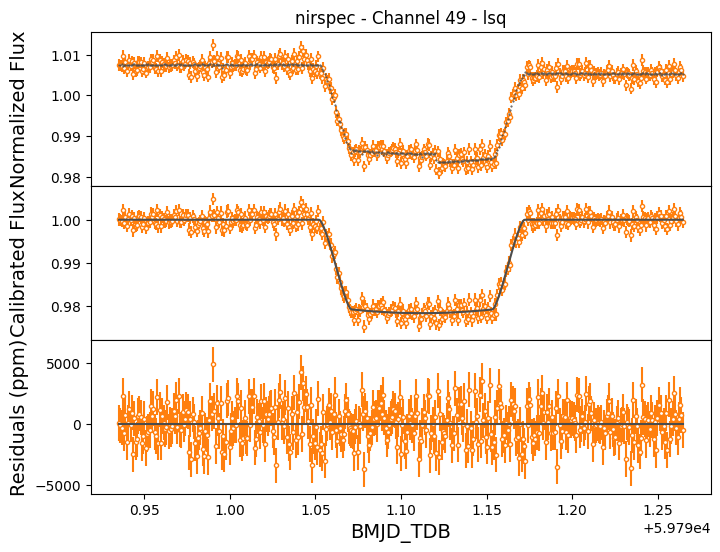

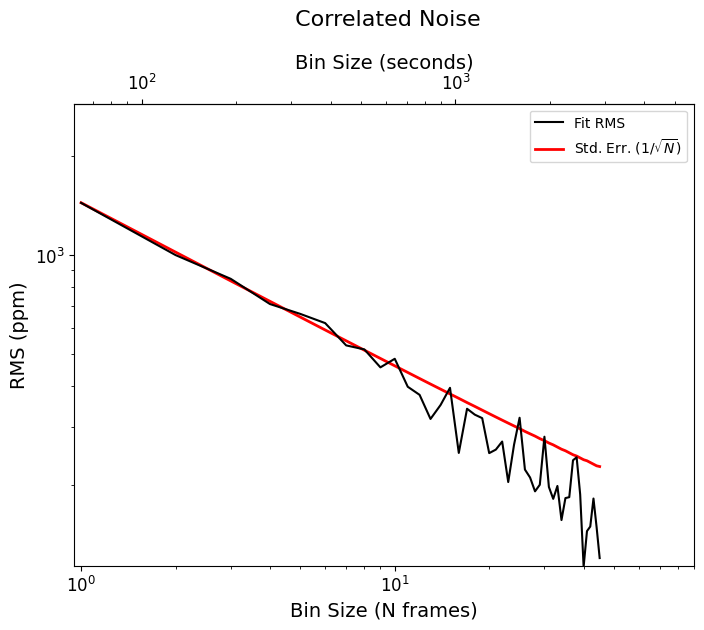

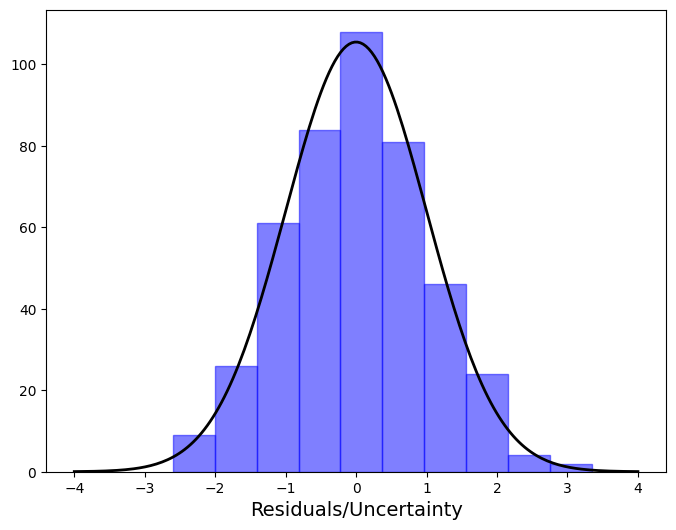

Completed lsq fit.
-------------------------


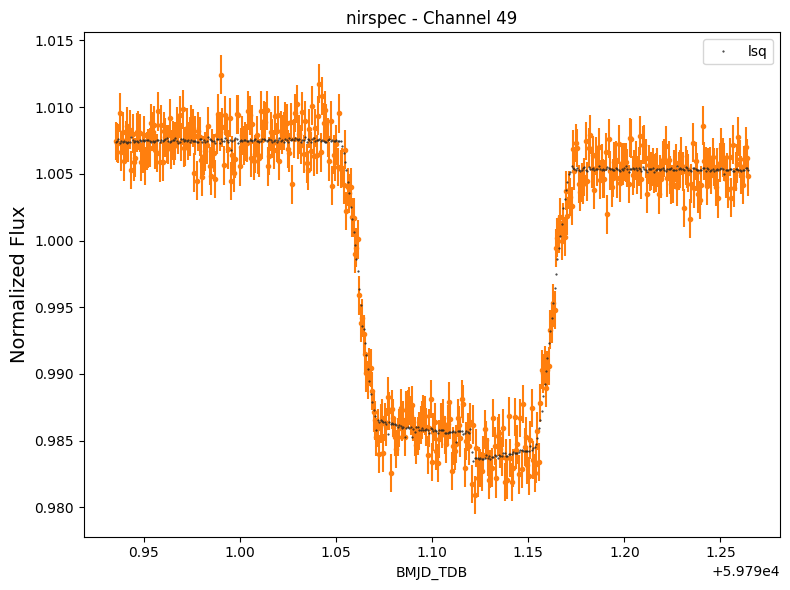

Saving results

Total time (min): 8.65


In [ ]:
s5_meta = eureka.S5_lightcurve_fitting.s5_fit.fitlc(eventlabel)

# Gathering together spectroscopic fits

Now that we've completed fits to the 50 spectroscopic channels, we want an easy way of seeing how different parameters vary with wavelength. Of particular interest is the transit depth (`rp^2`) — the variations in transit depth as a function of wavelength is called an transmission spectrum and can be used to determine the presence and abundance of molecules in the atmosphere of an exoplanet. Because we only used the `lsq` optimization algorithm above, our transmission spectrum will not have error bars. If you want to know what the spectrum looks like with error bars, you'll have to re-run your spectroscopic fits above using a sampler like dynesty.

## Setting the Stage 6 "Eureka! Control File" (ECF)

**This determines what will happen during Eureka!'s Stage 6**

To begin, please first copy below the contents of the ECF template for MIRI/LRS from the `S6_template.ecf` file in the ECF demos folder on [GitHub](https://github.com/kevin218/Eureka/tree/main/demos/JWST).

The most important parameters and their recommended settings are described below, but more context can be found on the [Eureka! documentation website](https://eurekadocs.readthedocs.io/en/latest/ecf.html#stage-6).

1. Set `y_params` to `['rp^2']`. Eureka! is able to plot any of the `'free'` parameters from your fits as a function of wavelength as well as a very limited number of convenient transformations (e.g., `rp^2` to get the transit depth), but the only one we're really interested in here is `rp^2`.
2. Set `y_scalars` to `[100]` so that units of % are used for a plot that is easier to read.
3. We will also set some parameters to let Eureka! estimate the [atmospheric scale height](https://en.wikipedia.org/wiki/Scale_height) of WASP-39b; this will help us understand the strength of different molecular features in our transmission spectrum. We will again navigate to the [NASA Exoplanet Archive's page](https://exoplanetarchive.ipac.caltech.edu/overview/WASP-39b) about our target WASP-39b. We will again use the published values from Maciejewski et al. 2016 to keep everything self-consistent. First, click on "WASP-39 Stellar Parameters" and note the stellar radius (ignoring the uncertainty) in units of Solar radii in your ECF below beside `star_Rad`. Then, click on "WASP-39 b Planetary Parameters" and note the planetary mass in Jupiter masses beside `planet_Mass`. Since Maciejewski et al. 2016 didn't publish an equilibrium temperature, grab the value from Sing et al. 2016 and put the equilibtrium temperature in units of Kelvin beside `planet_Teq`. We will leave `planet_Rad` at it's default setting of `None` to use our mean fitted radius as the radius of the planet. We will also leave `planet_mu` at it's default setting of `2.3` AMU which is the approximate mean-molecular weight of most gas giant planets. And finally, we will leave `planet_R0` at it's default setting of `None` to use the mean featted radius as the reference height for the scale height axis. In summary, you should set:
> `star_Rad 0.918`
> `planet_Teq 1120`
> `planet_Mass 0.283`
> `planet_Rad None`
> `planet_mu 2.3`
> `planet_R0 None`

4. Set `topdir` to the same value as you used in your Stage 5 spectroscopic fits.

That's all we need to change for our purposes here, and all the other parameters can be left at their default settings.

In [ ]:
s6_ecf_contents = f"""
# Eureka! Control File for Stage 6: Spectra Plotting

# Stage 6 Documentation: https://eurekadocs.readthedocs.io/en/latest/ecf.html#stage-6

allapers        False # Run S6 on all of the apertures considered in S5? Otherwise will use newest output in the inputdir

# Plotting parameters
y_params        ['rp^2', 'u1', 'u2', 'c0', 'c1', 'scatter_mult']  # The parameter name as entered in your EPF file in Stage 5. rp^2, 1/r1, 1/r4, fn (nightside flux), pc_amp (phase curve amplitude), and pc_offset (phase curve offset), pc_amp2 (second order phase curve amplitude), and pc_offset2 (second order phase curve offset) are also permitted.
y_labels        [None, None, None, None, None, None]  # The formatted string you want on the y-label. Set to None to use the default formatting.
y_label_units   [None, None, None, None, None, None]  # The formatted string for the units you want on the y-label - e.g., (ppm), (seconds), '(days$^{-1})$', etc.. Set to None to automatically add any implied units from y_scalars (e.g. ppm), or set to '' to force no units.
y_scalars       [1e6, 1, 1, 1, 1, 1]  # Can be used to convert to percent (100), ppm (1e6), etc.
x_unit          um  # Options include any measurement of light included in astropy.units.spectral (e.g. um, nm, Hz, etc.)

# Tabulating parameters
ncol            4  # The number of columns you want in your LaTeX formatted tables

# This section is relevant if isplots_S6>=3
# Scale height parameters (if you want a second copy of the plot with a second y-axis with units of scale height)
star_Rad        0.918 # The radius of the star in units of solar radii
planet_Teq      1120   # The equilibrium temperature of the planet in units of Kelvin
planet_Mass     0.283      # The planet's mass in units of Jupiter masses (used to calculate surface gravity)
planet_Rad      None   # The planet's radius in units of Jupiter radii (used to calculate surface gravity); Set to None to use the average fitted radius
planet_mu       2.3    # The mean molecular mass of the atmosphere (in atomic mass units)
planet_R0       None   # The reference radius (in Jupiter radii) for the scale height measurement; Set to None to use the mean fitted radius

# Diagnostics
isplots_S6      5      # Generate few (1), some (3), or many (5) figures (Options: 1 - 5)
hide_plots      False  # If True, plots will automatically be closed rather than popping up

# Project directory
topdir          /content/drive/MyDrive/SSW2023/WASP39b_NIRSpec

# Model to plot underneath the fitted data points
model_spectrum  None   # Path to the model spectrum relative to topdir. Set to None if no model should be plotted.
model_x_unit    um     # Options include any measurement of light included in astropy.units.spectral (e.g. um, nm, Hz, etc.)
model_y_param   rp^2   # Follow the same format as y_params. If desired, can be rp if y_params is rp^2, or vice-versa.
model_y_scalar  1      # Indicate whether model y-values have already been scaled (e.g. write 1e6 if model_spectrum is in ppm)
model_zorder    0      # The zorder of the model on the plot (0 for beneath the data, 1 for above the data)
model_delimiter None   # Delimiter between columns. Typical options: None (for space), ',' for comma

# Directories relative to topdir
inputdir        Stage5   # The folder containing the outputs from Eureka!'s S5 pipeline (will be overwritten if calling S5 and S6 sequentially)
outputdir       Stage6
# Fill this text block with the contents of the S6 ECF template from https://github.com/kevin218/Eureka/tree/main/demos/JWST
# and then adjust the values as described above

"""

with open(f'S6_{eventlabel}.ecf', 'w') as f:
    f.write(s6_ecf_contents)

## Running Eureka!'s Stage 6

The following cell will run Eureka!'s Stage 6 using the settings you defined above. Note that your ECF will be copied to your output folder, making it easy to remember how you produced those outputs hours, days, or years after you reduced the data.

The following stage should take &#8810;1 minute to complete on Google Colab.


Starting Stage 6: Light Curve Fitting

Input directory: /content/drive/MyDrive/SSW2023/WASP39b_NIRSpec/Stage5/S5_2023-07-25_nirspec_run1/ap5_bg7/
Output directory: /content/drive/MyDrive/SSW2023/WASP39b_NIRSpec/Stage6/S6_2023-07-25_nirspec_run1/ap5_bg7/
Copying S6 control file
Plotting rp^2...


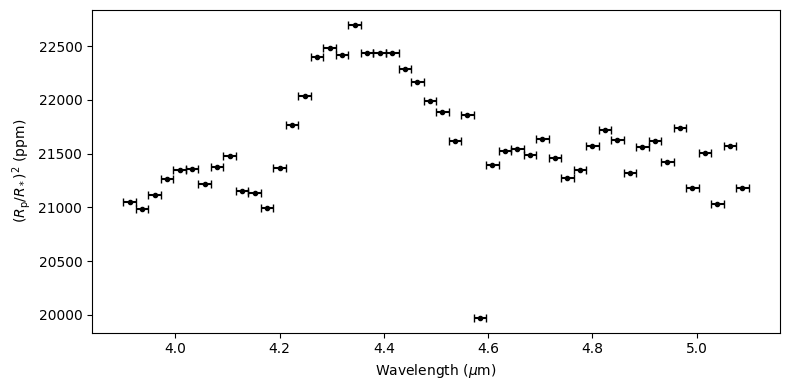

  Calculated g=4.07 m/s^2 with Rp=1.31 R_jup and Mp=0.283 M_jup
  Calculated H=994.28 km with g=4.07 m/s^2, Teq=1120 K, and mu=2.3 u


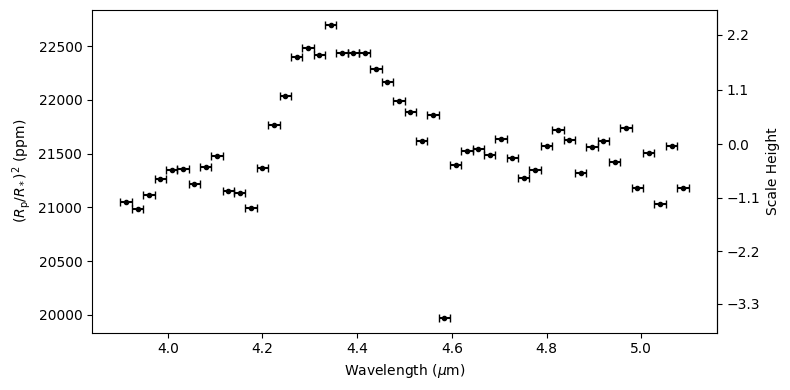

  Saving results as an astropy table
  Saving results as a LaTeX table
Plotting u1...


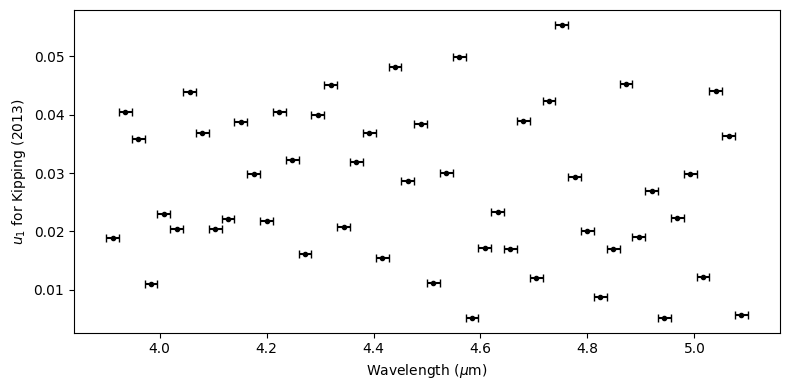

  Saving results as an astropy table
  Saving results as a LaTeX table
Plotting u2...


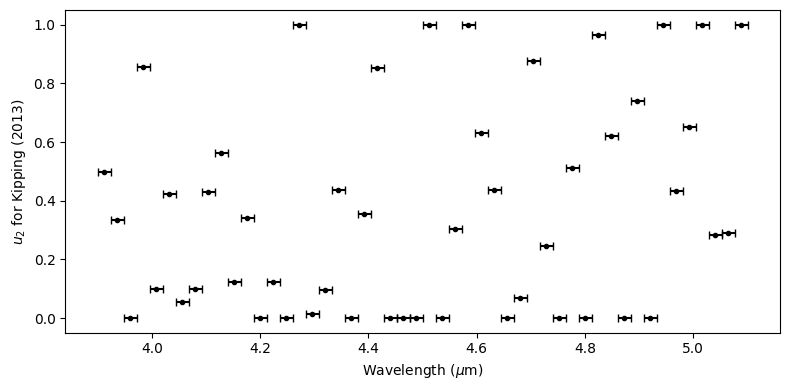

  Saving results as an astropy table
  Saving results as a LaTeX table
Plotting c0...


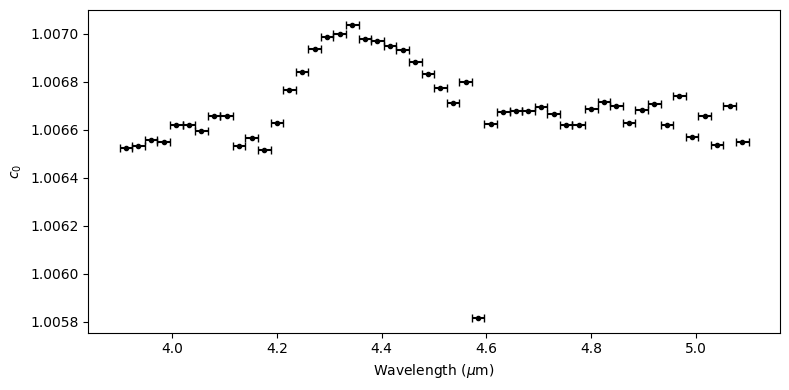

  Saving results as an astropy table
  Saving results as a LaTeX table
Plotting c1...


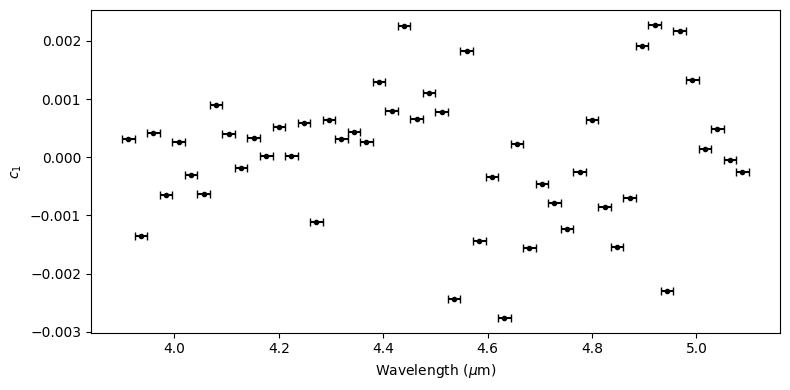

  Saving results as an astropy table
  Saving results as a LaTeX table
Plotting scatter_mult...


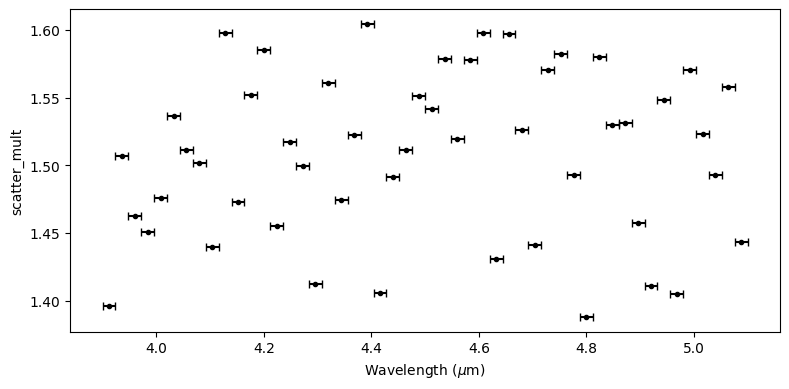

  Saving results as an astropy table
  Saving results as a LaTeX table
Finished writing to /content/drive/MyDrive/SSW2023/WASP39b_NIRSpec/Stage6/S6_2023-07-25_nirspec_run1/ap5_bg7/S6_nirspec_ap5_bg7_LC.h5
Saving results

Total time (min): 0.15


In [ ]:
s6_meta = eureka.S6_planet_spectra.s6_spectra.plot_spectra(eventlabel)

Two plots should have been generated. The second plot is a clone of the first with the addition of a second y-axis on the right showing the amplitude of features in atmospheric scale heights to help you interpret the size of features.

As you can see from your transmission spectrum, the mean transit depth is around 2.15%. There is a clearly visible large bump at ~4.35 microns which is caused by CO<sub>2</sub> absorption, and to the left of that bump there is also a shallower bump centered around ~4.05 microns which is caused by SO<sub>2</sub>. The abnormally low point around 4.6 microns is likely spurious and caused by imperfect processing in Stages 1--4 or imperfect fitting in Stage 5. In the next workshops, we'll learn how we can use forward models and retrievals to interpret transmission and/or emission spectra.